In [2]:
!pip install spacy==2.2

Defaulting to user installation because normal site-packages is not writeable


In [3]:
import pandas as pd
from SPARQLWrapper import SPARQLWrapper, JSON
#NLP 
from spacy.lang.en.stop_words import STOP_WORDS
# import en_core_sci_lg  # model downloaded in previous step

In [4]:
def get_breaks(content, length):
    data = ""
    words = content.split(' ')
    total_chars = 0

    # add break every length characters
    for i in range(len(words)):
        total_chars += len(words[i])
        if total_chars > length:
            data = data + "<br>" + words[i]
            total_chars = 0
        else:
            data = data + " " + words[i]
    return data


In [6]:
sparql = SPARQLWrapper("http://localhost:7200/repositories/publications")
sparql.setQuery("""
	PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
	PREFIX foaf: <http://xmlns.com/foaf/0.1/>
	PREFIX dcterms: <http://purl.org/dc/terms/>
	PREFIX dc: <http://purl.org/dc/elements/1.1/>
	PREFIX fabio: <http://purl.org/spar/fabio/>
	PREFIX data: <http://utpl.edu.ec/lod/publicationsCOVID#>
	PREFIX dbo: <http://dbpedia.org/ontology/>
	SELECT ?Publicaciones ?DOI ?Titulo_Publicacion ?Autores ?Nombre_Revista ?Nombre_Organizacion ?Tipo_Licencia ?URL ?Fecha_Publicacion
	WHERE{
		?Publicaciones rdf:type dcterms:BibliographicResource .
		?Publicaciones dcterms:title ?Titulo_Publicacion ;
		dcterms:license ?Licencia .
		?Licencia foaf:name ?Tipo_Licencia .
		?Publicaciones fabio:doi ?DOI .
		?Publicaciones data:authors ?Autores .
		?Publicaciones dcterms:publisher ?Organizacion .
		?Organizacion foaf:name ?Nombre_Organizacion .
		?Publicaciones fabio:hasURL ?URL .
		?Publicaciones dbo:AcademicJournal  ?Revista .
		?Revista foaf:name ?Nombre_Revista .
		?Publicaciones dcterms:date ?Fecha_Publicacion .
	} ORDER BY(?Titulo_Publicacion)
""")
sparql.setReturnFormat(JSON)
results = sparql.query().convert()

In [7]:
count = 0

'''for result in results["results"]["bindings"]:
    print(result["Publicaciones"]["value"], result["DOI"]["value"], result["Titulo_Publicacion"]["value"], result["Autores"]["value"], result["Tipo_Licencia"]["value"])
'''
print('---------------------------')
dict_ = {'Uri_Pb': [], 'Doi':[], 'Titulo': [], 'Autores': [], 'Fecha': [], 'Revista': [], 'Organizacion': [], 'Licencia': [], 'URL': []}

---------------------------


In [8]:
for idx, res in enumerate(results["results"]["bindings"]):
    #print(f'Processing index: {idx} of {len(results["results"]["bindings"])}')

    dict_['Uri_Pb'].append(res['Publicaciones']['value'])
    dict_['Doi'].append(res["DOI"]["value"])
    dict_['Titulo'].append(res["Titulo_Publicacion"]["value"])
    try:
        # if more than one author
        autores = res["Autores"]["value"]
        authors = autores.split(';')
        if len(authors) > 2:
            # if more than 2 authors, take them all with html tag breaks in between
            dict_['Autores'].append(get_breaks('. '.join(authors), 40))
        else:
            # authors will fit in plot
            dict_['Autores'].append(". ".join(authors))
    except Exception as e:
        # if only one author - or Null valie
        dict_['Autores'].append(res["Autores"]["value"])
    
    dict_['Fecha'].append(res["Fecha_Publicacion"]["value"])
    dict_['Revista'].append(res["Nombre_Revista"]["value"])
    dict_['Organizacion'].append(res["Nombre_Organizacion"]["value"])
    dict_['Licencia'].append(res["Tipo_Licencia"]["value"])
    dict_['URL'].append(res["URL"]["value"])
    
    df_covid = pd.DataFrame(dict_, columns=['Uri_Pb', 'Doi', 'Titulo','Autores', 'Fecha', 'Revista', 'Organizacion', 'Licencia', 'URL'])
    df_covid.info()
    print('-------------')
    df_covid.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1 entries, 0 to 0
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1 non-null      object
 1   Doi           1 non-null      object
 2   Titulo        1 non-null      object
 3   Autores       1 non-null      object
 4   Fecha         1 non-null      object
 5   Revista       1 non-null      object
 6   Organizacion  1 non-null      object
 7   Licencia      1 non-null      object
 8   URL           1 non-null      object
dtypes: object(9)
memory usage: 200.0+ bytes
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2 entries, 0 to 1
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2 non-null      object
 1   Doi           2 non-null      object
 2   Titulo        2 non-null      object
 3   Autores       2 non-null      object
 4   Fecha         2 non-nu

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39 entries, 0 to 38
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        39 non-null     object
 1   Doi           39 non-null     object
 2   Titulo        39 non-null     object
 3   Autores       39 non-null     object
 4   Fecha         39 non-null     object
 5   Revista       39 non-null     object
 6   Organizacion  39 non-null     object
 7   Licencia      39 non-null     object
 8   URL           39 non-null     object
dtypes: object(9)
memory usage: 2.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40 entries, 0 to 39
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        40 non-null     object
 1   Doi           40 non-null     object
 2   Titulo        40 non-null     object
 3   Autores       40 non-null     object
 4   Fecha         40 non-nu

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61 entries, 0 to 60
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        61 non-null     object
 1   Doi           61 non-null     object
 2   Titulo        61 non-null     object
 3   Autores       61 non-null     object
 4   Fecha         61 non-null     object
 5   Revista       61 non-null     object
 6   Organizacion  61 non-null     object
 7   Licencia      61 non-null     object
 8   URL           61 non-null     object
dtypes: object(9)
memory usage: 4.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62 entries, 0 to 61
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        62 non-null     object
 1   Doi           62 non-null     object
 2   Titulo        62 non-null     object
 3   Autores       62 non-null     object
 4   Fecha         62 non-nu

-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101 entries, 0 to 100
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        101 non-null    object
 1   Doi           101 non-null    object
 2   Titulo        101 non-null    object
 3   Autores       101 non-null    object
 4   Fecha         101 non-null    object
 5   Revista       101 non-null    object
 6   Organizacion  101 non-null    object
 7   Licencia      101 non-null    object
 8   URL           101 non-null    object
dtypes: object(9)
memory usage: 7.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102 entries, 0 to 101
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        102 non-null    object
 1   Doi           102 non-null    object
 2   Titulo        102 non-null    object
 3   Autores       102 non-null    object
 4   Fecha

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144 entries, 0 to 143
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        144 non-null    object
 1   Doi           144 non-null    object
 2   Titulo        144 non-null    object
 3   Autores       144 non-null    object
 4   Fecha         144 non-null    object
 5   Revista       144 non-null    object
 6   Organizacion  144 non-null    object
 7   Licencia      144 non-null    object
 8   URL           144 non-null    object
dtypes: object(9)
memory usage: 10.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145 entries, 0 to 144
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        145 non-null    object
 1   Doi           145 non-null    object
 2   Titulo        145 non-null    object
 3   Autores       145 non-null    object
 4   Fecha         145 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187 entries, 0 to 186
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        187 non-null    object
 1   Doi           187 non-null    object
 2   Titulo        187 non-null    object
 3   Autores       187 non-null    object
 4   Fecha         187 non-null    object
 5   Revista       187 non-null    object
 6   Organizacion  187 non-null    object
 7   Licencia      187 non-null    object
 8   URL           187 non-null    object
dtypes: object(9)
memory usage: 13.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188 entries, 0 to 187
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        188 non-null    object
 1   Doi           188 non-null    object
 2   Titulo        188 non-null    object
 3   Autores       188 non-null    object
 4   Fecha         188 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 222 entries, 0 to 221
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        222 non-null    object
 1   Doi           222 non-null    object
 2   Titulo        222 non-null    object
 3   Autores       222 non-null    object
 4   Fecha         222 non-null    object
 5   Revista       222 non-null    object
 6   Organizacion  222 non-null    object
 7   Licencia      222 non-null    object
 8   URL           222 non-null    object
dtypes: object(9)
memory usage: 15.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 223 entries, 0 to 222
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        223 non-null    object
 1   Doi           223 non-null    object
 2   Titulo        223 non-null    object
 3   Autores       223 non-null    object
 4   Fecha         223 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 263 entries, 0 to 262
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        263 non-null    object
 1   Doi           263 non-null    object
 2   Titulo        263 non-null    object
 3   Autores       263 non-null    object
 4   Fecha         263 non-null    object
 5   Revista       263 non-null    object
 6   Organizacion  263 non-null    object
 7   Licencia      263 non-null    object
 8   URL           263 non-null    object
dtypes: object(9)
memory usage: 18.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 264 entries, 0 to 263
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        264 non-null    object
 1   Doi           264 non-null    object
 2   Titulo        264 non-null    object
 3   Autores       264 non-null    object
 4   Fecha         264 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 305 entries, 0 to 304
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        305 non-null    object
 1   Doi           305 non-null    object
 2   Titulo        305 non-null    object
 3   Autores       305 non-null    object
 4   Fecha         305 non-null    object
 5   Revista       305 non-null    object
 6   Organizacion  305 non-null    object
 7   Licencia      305 non-null    object
 8   URL           305 non-null    object
dtypes: object(9)
memory usage: 21.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 306 entries, 0 to 305
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        306 non-null    object
 1   Doi           306 non-null    object
 2   Titulo        306 non-null    object
 3   Autores       306 non-null    object
 4   Fecha         306 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 346 entries, 0 to 345
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        346 non-null    object
 1   Doi           346 non-null    object
 2   Titulo        346 non-null    object
 3   Autores       346 non-null    object
 4   Fecha         346 non-null    object
 5   Revista       346 non-null    object
 6   Organizacion  346 non-null    object
 7   Licencia      346 non-null    object
 8   URL           346 non-null    object
dtypes: object(9)
memory usage: 24.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 347 entries, 0 to 346
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        347 non-null    object
 1   Doi           347 non-null    object
 2   Titulo        347 non-null    object
 3   Autores       347 non-null    object
 4   Fecha         347 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 384 entries, 0 to 383
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        384 non-null    object
 1   Doi           384 non-null    object
 2   Titulo        384 non-null    object
 3   Autores       384 non-null    object
 4   Fecha         384 non-null    object
 5   Revista       384 non-null    object
 6   Organizacion  384 non-null    object
 7   Licencia      384 non-null    object
 8   URL           384 non-null    object
dtypes: object(9)
memory usage: 27.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 385 entries, 0 to 384
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        385 non-null    object
 1   Doi           385 non-null    object
 2   Titulo        385 non-null    object
 3   Autores       385 non-null    object
 4   Fecha         385 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 411 entries, 0 to 410
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        411 non-null    object
 1   Doi           411 non-null    object
 2   Titulo        411 non-null    object
 3   Autores       411 non-null    object
 4   Fecha         411 non-null    object
 5   Revista       411 non-null    object
 6   Organizacion  411 non-null    object
 7   Licencia      411 non-null    object
 8   URL           411 non-null    object
dtypes: object(9)
memory usage: 29.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 412 entries, 0 to 411
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        412 non-null    object
 1   Doi           412 non-null    object
 2   Titulo        412 non-null    object
 3   Autores       412 non-null    object
 4   Fecha         412 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 437 entries, 0 to 436
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        437 non-null    object
 1   Doi           437 non-null    object
 2   Titulo        437 non-null    object
 3   Autores       437 non-null    object
 4   Fecha         437 non-null    object
 5   Revista       437 non-null    object
 6   Organizacion  437 non-null    object
 7   Licencia      437 non-null    object
 8   URL           437 non-null    object
dtypes: object(9)
memory usage: 30.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 438 entries, 0 to 437
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        438 non-null    object
 1   Doi           438 non-null    object
 2   Titulo        438 non-null    object
 3   Autores       438 non-null    object
 4   Fecha         438 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 478 entries, 0 to 477
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        478 non-null    object
 1   Doi           478 non-null    object
 2   Titulo        478 non-null    object
 3   Autores       478 non-null    object
 4   Fecha         478 non-null    object
 5   Revista       478 non-null    object
 6   Organizacion  478 non-null    object
 7   Licencia      478 non-null    object
 8   URL           478 non-null    object
dtypes: object(9)
memory usage: 33.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 479 entries, 0 to 478
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        479 non-null    object
 1   Doi           479 non-null    object
 2   Titulo        479 non-null    object
 3   Autores       479 non-null    object
 4   Fecha         479 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 516 entries, 0 to 515
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        516 non-null    object
 1   Doi           516 non-null    object
 2   Titulo        516 non-null    object
 3   Autores       516 non-null    object
 4   Fecha         516 non-null    object
 5   Revista       516 non-null    object
 6   Organizacion  516 non-null    object
 7   Licencia      516 non-null    object
 8   URL           516 non-null    object
dtypes: object(9)
memory usage: 36.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 517 entries, 0 to 516
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        517 non-null    object
 1   Doi           517 non-null    object
 2   Titulo        517 non-null    object
 3   Autores       517 non-null    object
 4   Fecha         517 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 553 entries, 0 to 552
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        553 non-null    object
 1   Doi           553 non-null    object
 2   Titulo        553 non-null    object
 3   Autores       553 non-null    object
 4   Fecha         553 non-null    object
 5   Revista       553 non-null    object
 6   Organizacion  553 non-null    object
 7   Licencia      553 non-null    object
 8   URL           553 non-null    object
dtypes: object(9)
memory usage: 39.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 554 entries, 0 to 553
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        554 non-null    object
 1   Doi           554 non-null    object
 2   Titulo        554 non-null    object
 3   Autores       554 non-null    object
 4   Fecha         554 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 591 entries, 0 to 590
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        591 non-null    object
 1   Doi           591 non-null    object
 2   Titulo        591 non-null    object
 3   Autores       591 non-null    object
 4   Fecha         591 non-null    object
 5   Revista       591 non-null    object
 6   Organizacion  591 non-null    object
 7   Licencia      591 non-null    object
 8   URL           591 non-null    object
dtypes: object(9)
memory usage: 41.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 592 entries, 0 to 591
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        592 non-null    object
 1   Doi           592 non-null    object
 2   Titulo        592 non-null    object
 3   Autores       592 non-null    object
 4   Fecha         592 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 625 entries, 0 to 624
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        625 non-null    object
 1   Doi           625 non-null    object
 2   Titulo        625 non-null    object
 3   Autores       625 non-null    object
 4   Fecha         625 non-null    object
 5   Revista       625 non-null    object
 6   Organizacion  625 non-null    object
 7   Licencia      625 non-null    object
 8   URL           625 non-null    object
dtypes: object(9)
memory usage: 44.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 626 entries, 0 to 625
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        626 non-null    object
 1   Doi           626 non-null    object
 2   Titulo        626 non-null    object
 3   Autores       626 non-null    object
 4   Fecha         626 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 661 entries, 0 to 660
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        661 non-null    object
 1   Doi           661 non-null    object
 2   Titulo        661 non-null    object
 3   Autores       661 non-null    object
 4   Fecha         661 non-null    object
 5   Revista       661 non-null    object
 6   Organizacion  661 non-null    object
 7   Licencia      661 non-null    object
 8   URL           661 non-null    object
dtypes: object(9)
memory usage: 46.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 662 entries, 0 to 661
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        662 non-null    object
 1   Doi           662 non-null    object
 2   Titulo        662 non-null    object
 3   Autores       662 non-null    object
 4   Fecha         662 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 695 entries, 0 to 694
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        695 non-null    object
 1   Doi           695 non-null    object
 2   Titulo        695 non-null    object
 3   Autores       695 non-null    object
 4   Fecha         695 non-null    object
 5   Revista       695 non-null    object
 6   Organizacion  695 non-null    object
 7   Licencia      695 non-null    object
 8   URL           695 non-null    object
dtypes: object(9)
memory usage: 49.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 696 entries, 0 to 695
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        696 non-null    object
 1   Doi           696 non-null    object
 2   Titulo        696 non-null    object
 3   Autores       696 non-null    object
 4   Fecha         696 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 728 entries, 0 to 727
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        728 non-null    object
 1   Doi           728 non-null    object
 2   Titulo        728 non-null    object
 3   Autores       728 non-null    object
 4   Fecha         728 non-null    object
 5   Revista       728 non-null    object
 6   Organizacion  728 non-null    object
 7   Licencia      728 non-null    object
 8   URL           728 non-null    object
dtypes: object(9)
memory usage: 51.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 729 entries, 0 to 728
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        729 non-null    object
 1   Doi           729 non-null    object
 2   Titulo        729 non-null    object
 3   Autores       729 non-null    object
 4   Fecha         729 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 745 entries, 0 to 744
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        745 non-null    object
 1   Doi           745 non-null    object
 2   Titulo        745 non-null    object
 3   Autores       745 non-null    object
 4   Fecha         745 non-null    object
 5   Revista       745 non-null    object
 6   Organizacion  745 non-null    object
 7   Licencia      745 non-null    object
 8   URL           745 non-null    object
dtypes: object(9)
memory usage: 52.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 746 entries, 0 to 745
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        746 non-null    object
 1   Doi           746 non-null    object
 2   Titulo        746 non-null    object
 3   Autores       746 non-null    object
 4   Fecha         746 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 762 entries, 0 to 761
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        762 non-null    object
 1   Doi           762 non-null    object
 2   Titulo        762 non-null    object
 3   Autores       762 non-null    object
 4   Fecha         762 non-null    object
 5   Revista       762 non-null    object
 6   Organizacion  762 non-null    object
 7   Licencia      762 non-null    object
 8   URL           762 non-null    object
dtypes: object(9)
memory usage: 53.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 763 entries, 0 to 762
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        763 non-null    object
 1   Doi           763 non-null    object
 2   Titulo        763 non-null    object
 3   Autores       763 non-null    object
 4   Fecha         763 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 785 entries, 0 to 784
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        785 non-null    object
 1   Doi           785 non-null    object
 2   Titulo        785 non-null    object
 3   Autores       785 non-null    object
 4   Fecha         785 non-null    object
 5   Revista       785 non-null    object
 6   Organizacion  785 non-null    object
 7   Licencia      785 non-null    object
 8   URL           785 non-null    object
dtypes: object(9)
memory usage: 55.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 786 entries, 0 to 785
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        786 non-null    object
 1   Doi           786 non-null    object
 2   Titulo        786 non-null    object
 3   Autores       786 non-null    object
 4   Fecha         786 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 819 entries, 0 to 818
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        819 non-null    object
 1   Doi           819 non-null    object
 2   Titulo        819 non-null    object
 3   Autores       819 non-null    object
 4   Fecha         819 non-null    object
 5   Revista       819 non-null    object
 6   Organizacion  819 non-null    object
 7   Licencia      819 non-null    object
 8   URL           819 non-null    object
dtypes: object(9)
memory usage: 57.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 820 entries, 0 to 819
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        820 non-null    object
 1   Doi           820 non-null    object
 2   Titulo        820 non-null    object
 3   Autores       820 non-null    object
 4   Fecha         820 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 853 entries, 0 to 852
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        853 non-null    object
 1   Doi           853 non-null    object
 2   Titulo        853 non-null    object
 3   Autores       853 non-null    object
 4   Fecha         853 non-null    object
 5   Revista       853 non-null    object
 6   Organizacion  853 non-null    object
 7   Licencia      853 non-null    object
 8   URL           853 non-null    object
dtypes: object(9)
memory usage: 60.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 854 entries, 0 to 853
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        854 non-null    object
 1   Doi           854 non-null    object
 2   Titulo        854 non-null    object
 3   Autores       854 non-null    object
 4   Fecha         854 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 887 entries, 0 to 886
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        887 non-null    object
 1   Doi           887 non-null    object
 2   Titulo        887 non-null    object
 3   Autores       887 non-null    object
 4   Fecha         887 non-null    object
 5   Revista       887 non-null    object
 6   Organizacion  887 non-null    object
 7   Licencia      887 non-null    object
 8   URL           887 non-null    object
dtypes: object(9)
memory usage: 62.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 888 entries, 0 to 887
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        888 non-null    object
 1   Doi           888 non-null    object
 2   Titulo        888 non-null    object
 3   Autores       888 non-null    object
 4   Fecha         888 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 913 entries, 0 to 912
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        913 non-null    object
 1   Doi           913 non-null    object
 2   Titulo        913 non-null    object
 3   Autores       913 non-null    object
 4   Fecha         913 non-null    object
 5   Revista       913 non-null    object
 6   Organizacion  913 non-null    object
 7   Licencia      913 non-null    object
 8   URL           913 non-null    object
dtypes: object(9)
memory usage: 64.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 914 entries, 0 to 913
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        914 non-null    object
 1   Doi           914 non-null    object
 2   Titulo        914 non-null    object
 3   Autores       914 non-null    object
 4   Fecha         914 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 942 entries, 0 to 941
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        942 non-null    object
 1   Doi           942 non-null    object
 2   Titulo        942 non-null    object
 3   Autores       942 non-null    object
 4   Fecha         942 non-null    object
 5   Revista       942 non-null    object
 6   Organizacion  942 non-null    object
 7   Licencia      942 non-null    object
 8   URL           942 non-null    object
dtypes: object(9)
memory usage: 66.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 943 entries, 0 to 942
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        943 non-null    object
 1   Doi           943 non-null    object
 2   Titulo        943 non-null    object
 3   Autores       943 non-null    object
 4   Fecha         943 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 977 entries, 0 to 976
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        977 non-null    object
 1   Doi           977 non-null    object
 2   Titulo        977 non-null    object
 3   Autores       977 non-null    object
 4   Fecha         977 non-null    object
 5   Revista       977 non-null    object
 6   Organizacion  977 non-null    object
 7   Licencia      977 non-null    object
 8   URL           977 non-null    object
dtypes: object(9)
memory usage: 68.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 978 entries, 0 to 977
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        978 non-null    object
 1   Doi           978 non-null    object
 2   Titulo        978 non-null    object
 3   Autores       978 non-null    object
 4   Fecha         978 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1009 entries, 0 to 1008
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1009 non-null   object
 1   Doi           1009 non-null   object
 2   Titulo        1009 non-null   object
 3   Autores       1009 non-null   object
 4   Fecha         1009 non-null   object
 5   Revista       1009 non-null   object
 6   Organizacion  1009 non-null   object
 7   Licencia      1009 non-null   object
 8   URL           1009 non-null   object
dtypes: object(9)
memory usage: 71.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1010 entries, 0 to 1009
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1010 non-null   object
 1   Doi           1010 non-null   object
 2   Titulo        1010 non-null   object
 3   Autores       1010 non-null   object
 4   Fecha         

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1045 entries, 0 to 1044
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1045 non-null   object
 1   Doi           1045 non-null   object
 2   Titulo        1045 non-null   object
 3   Autores       1045 non-null   object
 4   Fecha         1045 non-null   object
 5   Revista       1045 non-null   object
 6   Organizacion  1045 non-null   object
 7   Licencia      1045 non-null   object
 8   URL           1045 non-null   object
dtypes: object(9)
memory usage: 73.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1046 entries, 0 to 1045
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1046 non-null   object
 1   Doi           1046 non-null   object
 2   Titulo        1046 non-null   object
 3   Autores       1046 non-null   object
 4   Fecha         

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1073 entries, 0 to 1072
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1073 non-null   object
 1   Doi           1073 non-null   object
 2   Titulo        1073 non-null   object
 3   Autores       1073 non-null   object
 4   Fecha         1073 non-null   object
 5   Revista       1073 non-null   object
 6   Organizacion  1073 non-null   object
 7   Licencia      1073 non-null   object
 8   URL           1073 non-null   object
dtypes: object(9)
memory usage: 75.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1074 entries, 0 to 1073
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1074 non-null   object
 1   Doi           1074 non-null   object
 2   Titulo        1074 non-null   object
 3   Autores       1074 non-null   object
 4   Fecha         

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1107 entries, 0 to 1106
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1107 non-null   object
 1   Doi           1107 non-null   object
 2   Titulo        1107 non-null   object
 3   Autores       1107 non-null   object
 4   Fecha         1107 non-null   object
 5   Revista       1107 non-null   object
 6   Organizacion  1107 non-null   object
 7   Licencia      1107 non-null   object
 8   URL           1107 non-null   object
dtypes: object(9)
memory usage: 78.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1108 entries, 0 to 1107
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1108 non-null   object
 1   Doi           1108 non-null   object
 2   Titulo        1108 non-null   object
 3   Autores       1108 non-null   object
 4   Fecha         

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1138 entries, 0 to 1137
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1138 non-null   object
 1   Doi           1138 non-null   object
 2   Titulo        1138 non-null   object
 3   Autores       1138 non-null   object
 4   Fecha         1138 non-null   object
 5   Revista       1138 non-null   object
 6   Organizacion  1138 non-null   object
 7   Licencia      1138 non-null   object
 8   URL           1138 non-null   object
dtypes: object(9)
memory usage: 80.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1139 entries, 0 to 1138
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1139 non-null   object
 1   Doi           1139 non-null   object
 2   Titulo        1139 non-null   object
 3   Autores       1139 non-null   object
 4   Fecha         

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1170 entries, 0 to 1169
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1170 non-null   object
 1   Doi           1170 non-null   object
 2   Titulo        1170 non-null   object
 3   Autores       1170 non-null   object
 4   Fecha         1170 non-null   object
 5   Revista       1170 non-null   object
 6   Organizacion  1170 non-null   object
 7   Licencia      1170 non-null   object
 8   URL           1170 non-null   object
dtypes: object(9)
memory usage: 82.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1171 entries, 0 to 1170
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1171 non-null   object
 1   Doi           1171 non-null   object
 2   Titulo        1171 non-null   object
 3   Autores       1171 non-null   object
 4   Fecha         

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1201 entries, 0 to 1200
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1201 non-null   object
 1   Doi           1201 non-null   object
 2   Titulo        1201 non-null   object
 3   Autores       1201 non-null   object
 4   Fecha         1201 non-null   object
 5   Revista       1201 non-null   object
 6   Organizacion  1201 non-null   object
 7   Licencia      1201 non-null   object
 8   URL           1201 non-null   object
dtypes: object(9)
memory usage: 84.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1202 entries, 0 to 1201
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1202 non-null   object
 1   Doi           1202 non-null   object
 2   Titulo        1202 non-null   object
 3   Autores       1202 non-null   object
 4   Fecha         

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1234 entries, 0 to 1233
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1234 non-null   object
 1   Doi           1234 non-null   object
 2   Titulo        1234 non-null   object
 3   Autores       1234 non-null   object
 4   Fecha         1234 non-null   object
 5   Revista       1234 non-null   object
 6   Organizacion  1234 non-null   object
 7   Licencia      1234 non-null   object
 8   URL           1234 non-null   object
dtypes: object(9)
memory usage: 86.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1235 entries, 0 to 1234
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1235 non-null   object
 1   Doi           1235 non-null   object
 2   Titulo        1235 non-null   object
 3   Autores       1235 non-null   object
 4   Fecha         

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1265 entries, 0 to 1264
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1265 non-null   object
 1   Doi           1265 non-null   object
 2   Titulo        1265 non-null   object
 3   Autores       1265 non-null   object
 4   Fecha         1265 non-null   object
 5   Revista       1265 non-null   object
 6   Organizacion  1265 non-null   object
 7   Licencia      1265 non-null   object
 8   URL           1265 non-null   object
dtypes: object(9)
memory usage: 89.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1266 entries, 0 to 1265
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1266 non-null   object
 1   Doi           1266 non-null   object
 2   Titulo        1266 non-null   object
 3   Autores       1266 non-null   object
 4   Fecha         

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1286 entries, 0 to 1285
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1286 non-null   object
 1   Doi           1286 non-null   object
 2   Titulo        1286 non-null   object
 3   Autores       1286 non-null   object
 4   Fecha         1286 non-null   object
 5   Revista       1286 non-null   object
 6   Organizacion  1286 non-null   object
 7   Licencia      1286 non-null   object
 8   URL           1286 non-null   object
dtypes: object(9)
memory usage: 90.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1287 entries, 0 to 1286
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1287 non-null   object
 1   Doi           1287 non-null   object
 2   Titulo        1287 non-null   object
 3   Autores       1287 non-null   object
 4   Fecha         

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1313 entries, 0 to 1312
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1313 non-null   object
 1   Doi           1313 non-null   object
 2   Titulo        1313 non-null   object
 3   Autores       1313 non-null   object
 4   Fecha         1313 non-null   object
 5   Revista       1313 non-null   object
 6   Organizacion  1313 non-null   object
 7   Licencia      1313 non-null   object
 8   URL           1313 non-null   object
dtypes: object(9)
memory usage: 92.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1314 entries, 0 to 1313
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1314 non-null   object
 1   Doi           1314 non-null   object
 2   Titulo        1314 non-null   object
 3   Autores       1314 non-null   object
 4   Fecha         

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1343 entries, 0 to 1342
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1343 non-null   object
 1   Doi           1343 non-null   object
 2   Titulo        1343 non-null   object
 3   Autores       1343 non-null   object
 4   Fecha         1343 non-null   object
 5   Revista       1343 non-null   object
 6   Organizacion  1343 non-null   object
 7   Licencia      1343 non-null   object
 8   URL           1343 non-null   object
dtypes: object(9)
memory usage: 94.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1344 entries, 0 to 1343
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1344 non-null   object
 1   Doi           1344 non-null   object
 2   Titulo        1344 non-null   object
 3   Autores       1344 non-null   object
 4   Fecha         

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1376 entries, 0 to 1375
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1376 non-null   object
 1   Doi           1376 non-null   object
 2   Titulo        1376 non-null   object
 3   Autores       1376 non-null   object
 4   Fecha         1376 non-null   object
 5   Revista       1376 non-null   object
 6   Organizacion  1376 non-null   object
 7   Licencia      1376 non-null   object
 8   URL           1376 non-null   object
dtypes: object(9)
memory usage: 96.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1377 entries, 0 to 1376
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1377 non-null   object
 1   Doi           1377 non-null   object
 2   Titulo        1377 non-null   object
 3   Autores       1377 non-null   object
 4   Fecha         

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1406 entries, 0 to 1405
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1406 non-null   object
 1   Doi           1406 non-null   object
 2   Titulo        1406 non-null   object
 3   Autores       1406 non-null   object
 4   Fecha         1406 non-null   object
 5   Revista       1406 non-null   object
 6   Organizacion  1406 non-null   object
 7   Licencia      1406 non-null   object
 8   URL           1406 non-null   object
dtypes: object(9)
memory usage: 99.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1407 entries, 0 to 1406
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1407 non-null   object
 1   Doi           1407 non-null   object
 2   Titulo        1407 non-null   object
 3   Autores       1407 non-null   object
 4   Fecha         

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1442 entries, 0 to 1441
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1442 non-null   object
 1   Doi           1442 non-null   object
 2   Titulo        1442 non-null   object
 3   Autores       1442 non-null   object
 4   Fecha         1442 non-null   object
 5   Revista       1442 non-null   object
 6   Organizacion  1442 non-null   object
 7   Licencia      1442 non-null   object
 8   URL           1442 non-null   object
dtypes: object(9)
memory usage: 101.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1443 entries, 0 to 1442
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1443 non-null   object
 1   Doi           1443 non-null   object
 2   Titulo        1443 non-null   object
 3   Autores       1443 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1475 entries, 0 to 1474
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1475 non-null   object
 1   Doi           1475 non-null   object
 2   Titulo        1475 non-null   object
 3   Autores       1475 non-null   object
 4   Fecha         1475 non-null   object
 5   Revista       1475 non-null   object
 6   Organizacion  1475 non-null   object
 7   Licencia      1475 non-null   object
 8   URL           1475 non-null   object
dtypes: object(9)
memory usage: 103.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1476 entries, 0 to 1475
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1476 non-null   object
 1   Doi           1476 non-null   object
 2   Titulo        1476 non-null   object
 3   Autores       1476 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1507 entries, 0 to 1506
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1507 non-null   object
 1   Doi           1507 non-null   object
 2   Titulo        1507 non-null   object
 3   Autores       1507 non-null   object
 4   Fecha         1507 non-null   object
 5   Revista       1507 non-null   object
 6   Organizacion  1507 non-null   object
 7   Licencia      1507 non-null   object
 8   URL           1507 non-null   object
dtypes: object(9)
memory usage: 106.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1508 entries, 0 to 1507
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1508 non-null   object
 1   Doi           1508 non-null   object
 2   Titulo        1508 non-null   object
 3   Autores       1508 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1537 entries, 0 to 1536
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1537 non-null   object
 1   Doi           1537 non-null   object
 2   Titulo        1537 non-null   object
 3   Autores       1537 non-null   object
 4   Fecha         1537 non-null   object
 5   Revista       1537 non-null   object
 6   Organizacion  1537 non-null   object
 7   Licencia      1537 non-null   object
 8   URL           1537 non-null   object
dtypes: object(9)
memory usage: 108.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1538 entries, 0 to 1537
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1538 non-null   object
 1   Doi           1538 non-null   object
 2   Titulo        1538 non-null   object
 3   Autores       1538 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1566 entries, 0 to 1565
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1566 non-null   object
 1   Doi           1566 non-null   object
 2   Titulo        1566 non-null   object
 3   Autores       1566 non-null   object
 4   Fecha         1566 non-null   object
 5   Revista       1566 non-null   object
 6   Organizacion  1566 non-null   object
 7   Licencia      1566 non-null   object
 8   URL           1566 non-null   object
dtypes: object(9)
memory usage: 110.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1567 entries, 0 to 1566
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1567 non-null   object
 1   Doi           1567 non-null   object
 2   Titulo        1567 non-null   object
 3   Autores       1567 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1599 non-null   object
 1   Doi           1599 non-null   object
 2   Titulo        1599 non-null   object
 3   Autores       1599 non-null   object
 4   Fecha         1599 non-null   object
 5   Revista       1599 non-null   object
 6   Organizacion  1599 non-null   object
 7   Licencia      1599 non-null   object
 8   URL           1599 non-null   object
dtypes: object(9)
memory usage: 112.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1600 entries, 0 to 1599
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1600 non-null   object
 1   Doi           1600 non-null   object
 2   Titulo        1600 non-null   object
 3   Autores       1600 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1627 entries, 0 to 1626
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1627 non-null   object
 1   Doi           1627 non-null   object
 2   Titulo        1627 non-null   object
 3   Autores       1627 non-null   object
 4   Fecha         1627 non-null   object
 5   Revista       1627 non-null   object
 6   Organizacion  1627 non-null   object
 7   Licencia      1627 non-null   object
 8   URL           1627 non-null   object
dtypes: object(9)
memory usage: 114.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1628 entries, 0 to 1627
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1628 non-null   object
 1   Doi           1628 non-null   object
 2   Titulo        1628 non-null   object
 3   Autores       1628 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1654 entries, 0 to 1653
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1654 non-null   object
 1   Doi           1654 non-null   object
 2   Titulo        1654 non-null   object
 3   Autores       1654 non-null   object
 4   Fecha         1654 non-null   object
 5   Revista       1654 non-null   object
 6   Organizacion  1654 non-null   object
 7   Licencia      1654 non-null   object
 8   URL           1654 non-null   object
dtypes: object(9)
memory usage: 116.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1655 entries, 0 to 1654
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1655 non-null   object
 1   Doi           1655 non-null   object
 2   Titulo        1655 non-null   object
 3   Autores       1655 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1684 entries, 0 to 1683
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1684 non-null   object
 1   Doi           1684 non-null   object
 2   Titulo        1684 non-null   object
 3   Autores       1684 non-null   object
 4   Fecha         1684 non-null   object
 5   Revista       1684 non-null   object
 6   Organizacion  1684 non-null   object
 7   Licencia      1684 non-null   object
 8   URL           1684 non-null   object
dtypes: object(9)
memory usage: 118.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1685 entries, 0 to 1684
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1685 non-null   object
 1   Doi           1685 non-null   object
 2   Titulo        1685 non-null   object
 3   Autores       1685 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1715 entries, 0 to 1714
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1715 non-null   object
 1   Doi           1715 non-null   object
 2   Titulo        1715 non-null   object
 3   Autores       1715 non-null   object
 4   Fecha         1715 non-null   object
 5   Revista       1715 non-null   object
 6   Organizacion  1715 non-null   object
 7   Licencia      1715 non-null   object
 8   URL           1715 non-null   object
dtypes: object(9)
memory usage: 120.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716 entries, 0 to 1715
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1716 non-null   object
 1   Doi           1716 non-null   object
 2   Titulo        1716 non-null   object
 3   Autores       1716 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1745 entries, 0 to 1744
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1745 non-null   object
 1   Doi           1745 non-null   object
 2   Titulo        1745 non-null   object
 3   Autores       1745 non-null   object
 4   Fecha         1745 non-null   object
 5   Revista       1745 non-null   object
 6   Organizacion  1745 non-null   object
 7   Licencia      1745 non-null   object
 8   URL           1745 non-null   object
dtypes: object(9)
memory usage: 122.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1746 entries, 0 to 1745
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1746 non-null   object
 1   Doi           1746 non-null   object
 2   Titulo        1746 non-null   object
 3   Autores       1746 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1775 entries, 0 to 1774
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1775 non-null   object
 1   Doi           1775 non-null   object
 2   Titulo        1775 non-null   object
 3   Autores       1775 non-null   object
 4   Fecha         1775 non-null   object
 5   Revista       1775 non-null   object
 6   Organizacion  1775 non-null   object
 7   Licencia      1775 non-null   object
 8   URL           1775 non-null   object
dtypes: object(9)
memory usage: 124.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1776 entries, 0 to 1775
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1776 non-null   object
 1   Doi           1776 non-null   object
 2   Titulo        1776 non-null   object
 3   Autores       1776 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1808 entries, 0 to 1807
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1808 non-null   object
 1   Doi           1808 non-null   object
 2   Titulo        1808 non-null   object
 3   Autores       1808 non-null   object
 4   Fecha         1808 non-null   object
 5   Revista       1808 non-null   object
 6   Organizacion  1808 non-null   object
 7   Licencia      1808 non-null   object
 8   URL           1808 non-null   object
dtypes: object(9)
memory usage: 127.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1809 entries, 0 to 1808
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1809 non-null   object
 1   Doi           1809 non-null   object
 2   Titulo        1809 non-null   object
 3   Autores       1809 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1839 entries, 0 to 1838
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1839 non-null   object
 1   Doi           1839 non-null   object
 2   Titulo        1839 non-null   object
 3   Autores       1839 non-null   object
 4   Fecha         1839 non-null   object
 5   Revista       1839 non-null   object
 6   Organizacion  1839 non-null   object
 7   Licencia      1839 non-null   object
 8   URL           1839 non-null   object
dtypes: object(9)
memory usage: 129.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1840 entries, 0 to 1839
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1840 non-null   object
 1   Doi           1840 non-null   object
 2   Titulo        1840 non-null   object
 3   Autores       1840 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1868 entries, 0 to 1867
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1868 non-null   object
 1   Doi           1868 non-null   object
 2   Titulo        1868 non-null   object
 3   Autores       1868 non-null   object
 4   Fecha         1868 non-null   object
 5   Revista       1868 non-null   object
 6   Organizacion  1868 non-null   object
 7   Licencia      1868 non-null   object
 8   URL           1868 non-null   object
dtypes: object(9)
memory usage: 131.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1869 entries, 0 to 1868
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1869 non-null   object
 1   Doi           1869 non-null   object
 2   Titulo        1869 non-null   object
 3   Autores       1869 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1899 entries, 0 to 1898
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1899 non-null   object
 1   Doi           1899 non-null   object
 2   Titulo        1899 non-null   object
 3   Autores       1899 non-null   object
 4   Fecha         1899 non-null   object
 5   Revista       1899 non-null   object
 6   Organizacion  1899 non-null   object
 7   Licencia      1899 non-null   object
 8   URL           1899 non-null   object
dtypes: object(9)
memory usage: 133.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1900 entries, 0 to 1899
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1900 non-null   object
 1   Doi           1900 non-null   object
 2   Titulo        1900 non-null   object
 3   Autores       1900 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1929 entries, 0 to 1928
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1929 non-null   object
 1   Doi           1929 non-null   object
 2   Titulo        1929 non-null   object
 3   Autores       1929 non-null   object
 4   Fecha         1929 non-null   object
 5   Revista       1929 non-null   object
 6   Organizacion  1929 non-null   object
 7   Licencia      1929 non-null   object
 8   URL           1929 non-null   object
dtypes: object(9)
memory usage: 135.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1930 entries, 0 to 1929
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1930 non-null   object
 1   Doi           1930 non-null   object
 2   Titulo        1930 non-null   object
 3   Autores       1930 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1960 entries, 0 to 1959
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1960 non-null   object
 1   Doi           1960 non-null   object
 2   Titulo        1960 non-null   object
 3   Autores       1960 non-null   object
 4   Fecha         1960 non-null   object
 5   Revista       1960 non-null   object
 6   Organizacion  1960 non-null   object
 7   Licencia      1960 non-null   object
 8   URL           1960 non-null   object
dtypes: object(9)
memory usage: 137.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1961 entries, 0 to 1960
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1961 non-null   object
 1   Doi           1961 non-null   object
 2   Titulo        1961 non-null   object
 3   Autores       1961 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1990 entries, 0 to 1989
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1990 non-null   object
 1   Doi           1990 non-null   object
 2   Titulo        1990 non-null   object
 3   Autores       1990 non-null   object
 4   Fecha         1990 non-null   object
 5   Revista       1990 non-null   object
 6   Organizacion  1990 non-null   object
 7   Licencia      1990 non-null   object
 8   URL           1990 non-null   object
dtypes: object(9)
memory usage: 140.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1991 entries, 0 to 1990
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        1991 non-null   object
 1   Doi           1991 non-null   object
 2   Titulo        1991 non-null   object
 3   Autores       1991 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2019 entries, 0 to 2018
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2019 non-null   object
 1   Doi           2019 non-null   object
 2   Titulo        2019 non-null   object
 3   Autores       2019 non-null   object
 4   Fecha         2019 non-null   object
 5   Revista       2019 non-null   object
 6   Organizacion  2019 non-null   object
 7   Licencia      2019 non-null   object
 8   URL           2019 non-null   object
dtypes: object(9)
memory usage: 142.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2020 entries, 0 to 2019
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2020 non-null   object
 1   Doi           2020 non-null   object
 2   Titulo        2020 non-null   object
 3   Autores       2020 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2047 entries, 0 to 2046
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2047 non-null   object
 1   Doi           2047 non-null   object
 2   Titulo        2047 non-null   object
 3   Autores       2047 non-null   object
 4   Fecha         2047 non-null   object
 5   Revista       2047 non-null   object
 6   Organizacion  2047 non-null   object
 7   Licencia      2047 non-null   object
 8   URL           2047 non-null   object
dtypes: object(9)
memory usage: 144.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2048 entries, 0 to 2047
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2048 non-null   object
 1   Doi           2048 non-null   object
 2   Titulo        2048 non-null   object
 3   Autores       2048 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2076 entries, 0 to 2075
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2076 non-null   object
 1   Doi           2076 non-null   object
 2   Titulo        2076 non-null   object
 3   Autores       2076 non-null   object
 4   Fecha         2076 non-null   object
 5   Revista       2076 non-null   object
 6   Organizacion  2076 non-null   object
 7   Licencia      2076 non-null   object
 8   URL           2076 non-null   object
dtypes: object(9)
memory usage: 146.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2077 entries, 0 to 2076
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2077 non-null   object
 1   Doi           2077 non-null   object
 2   Titulo        2077 non-null   object
 3   Autores       2077 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2103 entries, 0 to 2102
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2103 non-null   object
 1   Doi           2103 non-null   object
 2   Titulo        2103 non-null   object
 3   Autores       2103 non-null   object
 4   Fecha         2103 non-null   object
 5   Revista       2103 non-null   object
 6   Organizacion  2103 non-null   object
 7   Licencia      2103 non-null   object
 8   URL           2103 non-null   object
dtypes: object(9)
memory usage: 148.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2104 entries, 0 to 2103
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2104 non-null   object
 1   Doi           2104 non-null   object
 2   Titulo        2104 non-null   object
 3   Autores       2104 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2129 entries, 0 to 2128
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2129 non-null   object
 1   Doi           2129 non-null   object
 2   Titulo        2129 non-null   object
 3   Autores       2129 non-null   object
 4   Fecha         2129 non-null   object
 5   Revista       2129 non-null   object
 6   Organizacion  2129 non-null   object
 7   Licencia      2129 non-null   object
 8   URL           2129 non-null   object
dtypes: object(9)
memory usage: 149.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2130 entries, 0 to 2129
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2130 non-null   object
 1   Doi           2130 non-null   object
 2   Titulo        2130 non-null   object
 3   Autores       2130 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2159 entries, 0 to 2158
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2159 non-null   object
 1   Doi           2159 non-null   object
 2   Titulo        2159 non-null   object
 3   Autores       2159 non-null   object
 4   Fecha         2159 non-null   object
 5   Revista       2159 non-null   object
 6   Organizacion  2159 non-null   object
 7   Licencia      2159 non-null   object
 8   URL           2159 non-null   object
dtypes: object(9)
memory usage: 151.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2160 entries, 0 to 2159
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2160 non-null   object
 1   Doi           2160 non-null   object
 2   Titulo        2160 non-null   object
 3   Autores       2160 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2186 entries, 0 to 2185
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2186 non-null   object
 1   Doi           2186 non-null   object
 2   Titulo        2186 non-null   object
 3   Autores       2186 non-null   object
 4   Fecha         2186 non-null   object
 5   Revista       2186 non-null   object
 6   Organizacion  2186 non-null   object
 7   Licencia      2186 non-null   object
 8   URL           2186 non-null   object
dtypes: object(9)
memory usage: 153.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2187 entries, 0 to 2186
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2187 non-null   object
 1   Doi           2187 non-null   object
 2   Titulo        2187 non-null   object
 3   Autores       2187 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2213 entries, 0 to 2212
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2213 non-null   object
 1   Doi           2213 non-null   object
 2   Titulo        2213 non-null   object
 3   Autores       2213 non-null   object
 4   Fecha         2213 non-null   object
 5   Revista       2213 non-null   object
 6   Organizacion  2213 non-null   object
 7   Licencia      2213 non-null   object
 8   URL           2213 non-null   object
dtypes: object(9)
memory usage: 155.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2214 entries, 0 to 2213
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2214 non-null   object
 1   Doi           2214 non-null   object
 2   Titulo        2214 non-null   object
 3   Autores       2214 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2242 entries, 0 to 2241
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2242 non-null   object
 1   Doi           2242 non-null   object
 2   Titulo        2242 non-null   object
 3   Autores       2242 non-null   object
 4   Fecha         2242 non-null   object
 5   Revista       2242 non-null   object
 6   Organizacion  2242 non-null   object
 7   Licencia      2242 non-null   object
 8   URL           2242 non-null   object
dtypes: object(9)
memory usage: 157.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2243 entries, 0 to 2242
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2243 non-null   object
 1   Doi           2243 non-null   object
 2   Titulo        2243 non-null   object
 3   Autores       2243 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2270 entries, 0 to 2269
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2270 non-null   object
 1   Doi           2270 non-null   object
 2   Titulo        2270 non-null   object
 3   Autores       2270 non-null   object
 4   Fecha         2270 non-null   object
 5   Revista       2270 non-null   object
 6   Organizacion  2270 non-null   object
 7   Licencia      2270 non-null   object
 8   URL           2270 non-null   object
dtypes: object(9)
memory usage: 159.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2271 entries, 0 to 2270
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2271 non-null   object
 1   Doi           2271 non-null   object
 2   Titulo        2271 non-null   object
 3   Autores       2271 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2299 entries, 0 to 2298
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2299 non-null   object
 1   Doi           2299 non-null   object
 2   Titulo        2299 non-null   object
 3   Autores       2299 non-null   object
 4   Fecha         2299 non-null   object
 5   Revista       2299 non-null   object
 6   Organizacion  2299 non-null   object
 7   Licencia      2299 non-null   object
 8   URL           2299 non-null   object
dtypes: object(9)
memory usage: 161.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2300 entries, 0 to 2299
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2300 non-null   object
 1   Doi           2300 non-null   object
 2   Titulo        2300 non-null   object
 3   Autores       2300 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2328 entries, 0 to 2327
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2328 non-null   object
 1   Doi           2328 non-null   object
 2   Titulo        2328 non-null   object
 3   Autores       2328 non-null   object
 4   Fecha         2328 non-null   object
 5   Revista       2328 non-null   object
 6   Organizacion  2328 non-null   object
 7   Licencia      2328 non-null   object
 8   URL           2328 non-null   object
dtypes: object(9)
memory usage: 163.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2329 entries, 0 to 2328
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2329 non-null   object
 1   Doi           2329 non-null   object
 2   Titulo        2329 non-null   object
 3   Autores       2329 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2356 non-null   object
 1   Doi           2356 non-null   object
 2   Titulo        2356 non-null   object
 3   Autores       2356 non-null   object
 4   Fecha         2356 non-null   object
 5   Revista       2356 non-null   object
 6   Organizacion  2356 non-null   object
 7   Licencia      2356 non-null   object
 8   URL           2356 non-null   object
dtypes: object(9)
memory usage: 165.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2357 entries, 0 to 2356
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2357 non-null   object
 1   Doi           2357 non-null   object
 2   Titulo        2357 non-null   object
 3   Autores       2357 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2382 entries, 0 to 2381
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2382 non-null   object
 1   Doi           2382 non-null   object
 2   Titulo        2382 non-null   object
 3   Autores       2382 non-null   object
 4   Fecha         2382 non-null   object
 5   Revista       2382 non-null   object
 6   Organizacion  2382 non-null   object
 7   Licencia      2382 non-null   object
 8   URL           2382 non-null   object
dtypes: object(9)
memory usage: 167.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2383 entries, 0 to 2382
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2383 non-null   object
 1   Doi           2383 non-null   object
 2   Titulo        2383 non-null   object
 3   Autores       2383 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2410 entries, 0 to 2409
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2410 non-null   object
 1   Doi           2410 non-null   object
 2   Titulo        2410 non-null   object
 3   Autores       2410 non-null   object
 4   Fecha         2410 non-null   object
 5   Revista       2410 non-null   object
 6   Organizacion  2410 non-null   object
 7   Licencia      2410 non-null   object
 8   URL           2410 non-null   object
dtypes: object(9)
memory usage: 169.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2411 entries, 0 to 2410
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2411 non-null   object
 1   Doi           2411 non-null   object
 2   Titulo        2411 non-null   object
 3   Autores       2411 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2437 entries, 0 to 2436
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2437 non-null   object
 1   Doi           2437 non-null   object
 2   Titulo        2437 non-null   object
 3   Autores       2437 non-null   object
 4   Fecha         2437 non-null   object
 5   Revista       2437 non-null   object
 6   Organizacion  2437 non-null   object
 7   Licencia      2437 non-null   object
 8   URL           2437 non-null   object
dtypes: object(9)
memory usage: 171.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2438 entries, 0 to 2437
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2438 non-null   object
 1   Doi           2438 non-null   object
 2   Titulo        2438 non-null   object
 3   Autores       2438 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2464 entries, 0 to 2463
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2464 non-null   object
 1   Doi           2464 non-null   object
 2   Titulo        2464 non-null   object
 3   Autores       2464 non-null   object
 4   Fecha         2464 non-null   object
 5   Revista       2464 non-null   object
 6   Organizacion  2464 non-null   object
 7   Licencia      2464 non-null   object
 8   URL           2464 non-null   object
dtypes: object(9)
memory usage: 173.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2465 entries, 0 to 2464
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2465 non-null   object
 1   Doi           2465 non-null   object
 2   Titulo        2465 non-null   object
 3   Autores       2465 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2492 entries, 0 to 2491
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2492 non-null   object
 1   Doi           2492 non-null   object
 2   Titulo        2492 non-null   object
 3   Autores       2492 non-null   object
 4   Fecha         2492 non-null   object
 5   Revista       2492 non-null   object
 6   Organizacion  2492 non-null   object
 7   Licencia      2492 non-null   object
 8   URL           2492 non-null   object
dtypes: object(9)
memory usage: 175.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2493 entries, 0 to 2492
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2493 non-null   object
 1   Doi           2493 non-null   object
 2   Titulo        2493 non-null   object
 3   Autores       2493 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2520 entries, 0 to 2519
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2520 non-null   object
 1   Doi           2520 non-null   object
 2   Titulo        2520 non-null   object
 3   Autores       2520 non-null   object
 4   Fecha         2520 non-null   object
 5   Revista       2520 non-null   object
 6   Organizacion  2520 non-null   object
 7   Licencia      2520 non-null   object
 8   URL           2520 non-null   object
dtypes: object(9)
memory usage: 177.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2521 entries, 0 to 2520
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2521 non-null   object
 1   Doi           2521 non-null   object
 2   Titulo        2521 non-null   object
 3   Autores       2521 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2547 entries, 0 to 2546
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2547 non-null   object
 1   Doi           2547 non-null   object
 2   Titulo        2547 non-null   object
 3   Autores       2547 non-null   object
 4   Fecha         2547 non-null   object
 5   Revista       2547 non-null   object
 6   Organizacion  2547 non-null   object
 7   Licencia      2547 non-null   object
 8   URL           2547 non-null   object
dtypes: object(9)
memory usage: 179.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2548 entries, 0 to 2547
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2548 non-null   object
 1   Doi           2548 non-null   object
 2   Titulo        2548 non-null   object
 3   Autores       2548 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2573 entries, 0 to 2572
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2573 non-null   object
 1   Doi           2573 non-null   object
 2   Titulo        2573 non-null   object
 3   Autores       2573 non-null   object
 4   Fecha         2573 non-null   object
 5   Revista       2573 non-null   object
 6   Organizacion  2573 non-null   object
 7   Licencia      2573 non-null   object
 8   URL           2573 non-null   object
dtypes: object(9)
memory usage: 181.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2574 entries, 0 to 2573
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2574 non-null   object
 1   Doi           2574 non-null   object
 2   Titulo        2574 non-null   object
 3   Autores       2574 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2601 entries, 0 to 2600
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2601 non-null   object
 1   Doi           2601 non-null   object
 2   Titulo        2601 non-null   object
 3   Autores       2601 non-null   object
 4   Fecha         2601 non-null   object
 5   Revista       2601 non-null   object
 6   Organizacion  2601 non-null   object
 7   Licencia      2601 non-null   object
 8   URL           2601 non-null   object
dtypes: object(9)
memory usage: 183.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2602 entries, 0 to 2601
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2602 non-null   object
 1   Doi           2602 non-null   object
 2   Titulo        2602 non-null   object
 3   Autores       2602 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2628 entries, 0 to 2627
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2628 non-null   object
 1   Doi           2628 non-null   object
 2   Titulo        2628 non-null   object
 3   Autores       2628 non-null   object
 4   Fecha         2628 non-null   object
 5   Revista       2628 non-null   object
 6   Organizacion  2628 non-null   object
 7   Licencia      2628 non-null   object
 8   URL           2628 non-null   object
dtypes: object(9)
memory usage: 184.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2629 entries, 0 to 2628
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2629 non-null   object
 1   Doi           2629 non-null   object
 2   Titulo        2629 non-null   object
 3   Autores       2629 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2655 entries, 0 to 2654
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2655 non-null   object
 1   Doi           2655 non-null   object
 2   Titulo        2655 non-null   object
 3   Autores       2655 non-null   object
 4   Fecha         2655 non-null   object
 5   Revista       2655 non-null   object
 6   Organizacion  2655 non-null   object
 7   Licencia      2655 non-null   object
 8   URL           2655 non-null   object
dtypes: object(9)
memory usage: 186.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2656 entries, 0 to 2655
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2656 non-null   object
 1   Doi           2656 non-null   object
 2   Titulo        2656 non-null   object
 3   Autores       2656 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2682 entries, 0 to 2681
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2682 non-null   object
 1   Doi           2682 non-null   object
 2   Titulo        2682 non-null   object
 3   Autores       2682 non-null   object
 4   Fecha         2682 non-null   object
 5   Revista       2682 non-null   object
 6   Organizacion  2682 non-null   object
 7   Licencia      2682 non-null   object
 8   URL           2682 non-null   object
dtypes: object(9)
memory usage: 188.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2683 entries, 0 to 2682
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2683 non-null   object
 1   Doi           2683 non-null   object
 2   Titulo        2683 non-null   object
 3   Autores       2683 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2707 entries, 0 to 2706
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2707 non-null   object
 1   Doi           2707 non-null   object
 2   Titulo        2707 non-null   object
 3   Autores       2707 non-null   object
 4   Fecha         2707 non-null   object
 5   Revista       2707 non-null   object
 6   Organizacion  2707 non-null   object
 7   Licencia      2707 non-null   object
 8   URL           2707 non-null   object
dtypes: object(9)
memory usage: 190.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2708 entries, 0 to 2707
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2708 non-null   object
 1   Doi           2708 non-null   object
 2   Titulo        2708 non-null   object
 3   Autores       2708 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2733 entries, 0 to 2732
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2733 non-null   object
 1   Doi           2733 non-null   object
 2   Titulo        2733 non-null   object
 3   Autores       2733 non-null   object
 4   Fecha         2733 non-null   object
 5   Revista       2733 non-null   object
 6   Organizacion  2733 non-null   object
 7   Licencia      2733 non-null   object
 8   URL           2733 non-null   object
dtypes: object(9)
memory usage: 192.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2734 entries, 0 to 2733
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2734 non-null   object
 1   Doi           2734 non-null   object
 2   Titulo        2734 non-null   object
 3   Autores       2734 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2760 entries, 0 to 2759
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2760 non-null   object
 1   Doi           2760 non-null   object
 2   Titulo        2760 non-null   object
 3   Autores       2760 non-null   object
 4   Fecha         2760 non-null   object
 5   Revista       2760 non-null   object
 6   Organizacion  2760 non-null   object
 7   Licencia      2760 non-null   object
 8   URL           2760 non-null   object
dtypes: object(9)
memory usage: 194.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2761 entries, 0 to 2760
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2761 non-null   object
 1   Doi           2761 non-null   object
 2   Titulo        2761 non-null   object
 3   Autores       2761 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2786 entries, 0 to 2785
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2786 non-null   object
 1   Doi           2786 non-null   object
 2   Titulo        2786 non-null   object
 3   Autores       2786 non-null   object
 4   Fecha         2786 non-null   object
 5   Revista       2786 non-null   object
 6   Organizacion  2786 non-null   object
 7   Licencia      2786 non-null   object
 8   URL           2786 non-null   object
dtypes: object(9)
memory usage: 196.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2787 entries, 0 to 2786
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2787 non-null   object
 1   Doi           2787 non-null   object
 2   Titulo        2787 non-null   object
 3   Autores       2787 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2813 entries, 0 to 2812
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2813 non-null   object
 1   Doi           2813 non-null   object
 2   Titulo        2813 non-null   object
 3   Autores       2813 non-null   object
 4   Fecha         2813 non-null   object
 5   Revista       2813 non-null   object
 6   Organizacion  2813 non-null   object
 7   Licencia      2813 non-null   object
 8   URL           2813 non-null   object
dtypes: object(9)
memory usage: 197.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2814 entries, 0 to 2813
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2814 non-null   object
 1   Doi           2814 non-null   object
 2   Titulo        2814 non-null   object
 3   Autores       2814 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2839 entries, 0 to 2838
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2839 non-null   object
 1   Doi           2839 non-null   object
 2   Titulo        2839 non-null   object
 3   Autores       2839 non-null   object
 4   Fecha         2839 non-null   object
 5   Revista       2839 non-null   object
 6   Organizacion  2839 non-null   object
 7   Licencia      2839 non-null   object
 8   URL           2839 non-null   object
dtypes: object(9)
memory usage: 199.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2840 entries, 0 to 2839
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2840 non-null   object
 1   Doi           2840 non-null   object
 2   Titulo        2840 non-null   object
 3   Autores       2840 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2867 entries, 0 to 2866
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2867 non-null   object
 1   Doi           2867 non-null   object
 2   Titulo        2867 non-null   object
 3   Autores       2867 non-null   object
 4   Fecha         2867 non-null   object
 5   Revista       2867 non-null   object
 6   Organizacion  2867 non-null   object
 7   Licencia      2867 non-null   object
 8   URL           2867 non-null   object
dtypes: object(9)
memory usage: 201.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2868 entries, 0 to 2867
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2868 non-null   object
 1   Doi           2868 non-null   object
 2   Titulo        2868 non-null   object
 3   Autores       2868 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2890 entries, 0 to 2889
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2890 non-null   object
 1   Doi           2890 non-null   object
 2   Titulo        2890 non-null   object
 3   Autores       2890 non-null   object
 4   Fecha         2890 non-null   object
 5   Revista       2890 non-null   object
 6   Organizacion  2890 non-null   object
 7   Licencia      2890 non-null   object
 8   URL           2890 non-null   object
dtypes: object(9)
memory usage: 203.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2891 entries, 0 to 2890
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2891 non-null   object
 1   Doi           2891 non-null   object
 2   Titulo        2891 non-null   object
 3   Autores       2891 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2916 entries, 0 to 2915
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2916 non-null   object
 1   Doi           2916 non-null   object
 2   Titulo        2916 non-null   object
 3   Autores       2916 non-null   object
 4   Fecha         2916 non-null   object
 5   Revista       2916 non-null   object
 6   Organizacion  2916 non-null   object
 7   Licencia      2916 non-null   object
 8   URL           2916 non-null   object
dtypes: object(9)
memory usage: 205.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2917 entries, 0 to 2916
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2917 non-null   object
 1   Doi           2917 non-null   object
 2   Titulo        2917 non-null   object
 3   Autores       2917 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2941 entries, 0 to 2940
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2941 non-null   object
 1   Doi           2941 non-null   object
 2   Titulo        2941 non-null   object
 3   Autores       2941 non-null   object
 4   Fecha         2941 non-null   object
 5   Revista       2941 non-null   object
 6   Organizacion  2941 non-null   object
 7   Licencia      2941 non-null   object
 8   URL           2941 non-null   object
dtypes: object(9)
memory usage: 206.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2942 entries, 0 to 2941
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2942 non-null   object
 1   Doi           2942 non-null   object
 2   Titulo        2942 non-null   object
 3   Autores       2942 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2968 entries, 0 to 2967
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2968 non-null   object
 1   Doi           2968 non-null   object
 2   Titulo        2968 non-null   object
 3   Autores       2968 non-null   object
 4   Fecha         2968 non-null   object
 5   Revista       2968 non-null   object
 6   Organizacion  2968 non-null   object
 7   Licencia      2968 non-null   object
 8   URL           2968 non-null   object
dtypes: object(9)
memory usage: 208.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2969 entries, 0 to 2968
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2969 non-null   object
 1   Doi           2969 non-null   object
 2   Titulo        2969 non-null   object
 3   Autores       2969 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2995 entries, 0 to 2994
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2995 non-null   object
 1   Doi           2995 non-null   object
 2   Titulo        2995 non-null   object
 3   Autores       2995 non-null   object
 4   Fecha         2995 non-null   object
 5   Revista       2995 non-null   object
 6   Organizacion  2995 non-null   object
 7   Licencia      2995 non-null   object
 8   URL           2995 non-null   object
dtypes: object(9)
memory usage: 210.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2996 entries, 0 to 2995
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        2996 non-null   object
 1   Doi           2996 non-null   object
 2   Titulo        2996 non-null   object
 3   Autores       2996 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3020 entries, 0 to 3019
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3020 non-null   object
 1   Doi           3020 non-null   object
 2   Titulo        3020 non-null   object
 3   Autores       3020 non-null   object
 4   Fecha         3020 non-null   object
 5   Revista       3020 non-null   object
 6   Organizacion  3020 non-null   object
 7   Licencia      3020 non-null   object
 8   URL           3020 non-null   object
dtypes: object(9)
memory usage: 212.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3021 entries, 0 to 3020
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3021 non-null   object
 1   Doi           3021 non-null   object
 2   Titulo        3021 non-null   object
 3   Autores       3021 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3045 entries, 0 to 3044
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3045 non-null   object
 1   Doi           3045 non-null   object
 2   Titulo        3045 non-null   object
 3   Autores       3045 non-null   object
 4   Fecha         3045 non-null   object
 5   Revista       3045 non-null   object
 6   Organizacion  3045 non-null   object
 7   Licencia      3045 non-null   object
 8   URL           3045 non-null   object
dtypes: object(9)
memory usage: 214.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3046 entries, 0 to 3045
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3046 non-null   object
 1   Doi           3046 non-null   object
 2   Titulo        3046 non-null   object
 3   Autores       3046 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3070 entries, 0 to 3069
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3070 non-null   object
 1   Doi           3070 non-null   object
 2   Titulo        3070 non-null   object
 3   Autores       3070 non-null   object
 4   Fecha         3070 non-null   object
 5   Revista       3070 non-null   object
 6   Organizacion  3070 non-null   object
 7   Licencia      3070 non-null   object
 8   URL           3070 non-null   object
dtypes: object(9)
memory usage: 216.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3071 entries, 0 to 3070
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3071 non-null   object
 1   Doi           3071 non-null   object
 2   Titulo        3071 non-null   object
 3   Autores       3071 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3095 entries, 0 to 3094
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3095 non-null   object
 1   Doi           3095 non-null   object
 2   Titulo        3095 non-null   object
 3   Autores       3095 non-null   object
 4   Fecha         3095 non-null   object
 5   Revista       3095 non-null   object
 6   Organizacion  3095 non-null   object
 7   Licencia      3095 non-null   object
 8   URL           3095 non-null   object
dtypes: object(9)
memory usage: 217.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3096 entries, 0 to 3095
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3096 non-null   object
 1   Doi           3096 non-null   object
 2   Titulo        3096 non-null   object
 3   Autores       3096 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3120 entries, 0 to 3119
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3120 non-null   object
 1   Doi           3120 non-null   object
 2   Titulo        3120 non-null   object
 3   Autores       3120 non-null   object
 4   Fecha         3120 non-null   object
 5   Revista       3120 non-null   object
 6   Organizacion  3120 non-null   object
 7   Licencia      3120 non-null   object
 8   URL           3120 non-null   object
dtypes: object(9)
memory usage: 219.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3121 entries, 0 to 3120
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3121 non-null   object
 1   Doi           3121 non-null   object
 2   Titulo        3121 non-null   object
 3   Autores       3121 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3144 entries, 0 to 3143
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3144 non-null   object
 1   Doi           3144 non-null   object
 2   Titulo        3144 non-null   object
 3   Autores       3144 non-null   object
 4   Fecha         3144 non-null   object
 5   Revista       3144 non-null   object
 6   Organizacion  3144 non-null   object
 7   Licencia      3144 non-null   object
 8   URL           3144 non-null   object
dtypes: object(9)
memory usage: 221.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3145 entries, 0 to 3144
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3145 non-null   object
 1   Doi           3145 non-null   object
 2   Titulo        3145 non-null   object
 3   Autores       3145 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3169 entries, 0 to 3168
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3169 non-null   object
 1   Doi           3169 non-null   object
 2   Titulo        3169 non-null   object
 3   Autores       3169 non-null   object
 4   Fecha         3169 non-null   object
 5   Revista       3169 non-null   object
 6   Organizacion  3169 non-null   object
 7   Licencia      3169 non-null   object
 8   URL           3169 non-null   object
dtypes: object(9)
memory usage: 222.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3170 entries, 0 to 3169
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3170 non-null   object
 1   Doi           3170 non-null   object
 2   Titulo        3170 non-null   object
 3   Autores       3170 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3194 entries, 0 to 3193
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3194 non-null   object
 1   Doi           3194 non-null   object
 2   Titulo        3194 non-null   object
 3   Autores       3194 non-null   object
 4   Fecha         3194 non-null   object
 5   Revista       3194 non-null   object
 6   Organizacion  3194 non-null   object
 7   Licencia      3194 non-null   object
 8   URL           3194 non-null   object
dtypes: object(9)
memory usage: 224.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3195 entries, 0 to 3194
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3195 non-null   object
 1   Doi           3195 non-null   object
 2   Titulo        3195 non-null   object
 3   Autores       3195 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3220 entries, 0 to 3219
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3220 non-null   object
 1   Doi           3220 non-null   object
 2   Titulo        3220 non-null   object
 3   Autores       3220 non-null   object
 4   Fecha         3220 non-null   object
 5   Revista       3220 non-null   object
 6   Organizacion  3220 non-null   object
 7   Licencia      3220 non-null   object
 8   URL           3220 non-null   object
dtypes: object(9)
memory usage: 226.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3221 entries, 0 to 3220
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3221 non-null   object
 1   Doi           3221 non-null   object
 2   Titulo        3221 non-null   object
 3   Autores       3221 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3245 entries, 0 to 3244
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3245 non-null   object
 1   Doi           3245 non-null   object
 2   Titulo        3245 non-null   object
 3   Autores       3245 non-null   object
 4   Fecha         3245 non-null   object
 5   Revista       3245 non-null   object
 6   Organizacion  3245 non-null   object
 7   Licencia      3245 non-null   object
 8   URL           3245 non-null   object
dtypes: object(9)
memory usage: 228.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3246 entries, 0 to 3245
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3246 non-null   object
 1   Doi           3246 non-null   object
 2   Titulo        3246 non-null   object
 3   Autores       3246 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3268 entries, 0 to 3267
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3268 non-null   object
 1   Doi           3268 non-null   object
 2   Titulo        3268 non-null   object
 3   Autores       3268 non-null   object
 4   Fecha         3268 non-null   object
 5   Revista       3268 non-null   object
 6   Organizacion  3268 non-null   object
 7   Licencia      3268 non-null   object
 8   URL           3268 non-null   object
dtypes: object(9)
memory usage: 229.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3269 entries, 0 to 3268
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3269 non-null   object
 1   Doi           3269 non-null   object
 2   Titulo        3269 non-null   object
 3   Autores       3269 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3291 entries, 0 to 3290
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3291 non-null   object
 1   Doi           3291 non-null   object
 2   Titulo        3291 non-null   object
 3   Autores       3291 non-null   object
 4   Fecha         3291 non-null   object
 5   Revista       3291 non-null   object
 6   Organizacion  3291 non-null   object
 7   Licencia      3291 non-null   object
 8   URL           3291 non-null   object
dtypes: object(9)
memory usage: 231.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3292 entries, 0 to 3291
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3292 non-null   object
 1   Doi           3292 non-null   object
 2   Titulo        3292 non-null   object
 3   Autores       3292 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3316 entries, 0 to 3315
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3316 non-null   object
 1   Doi           3316 non-null   object
 2   Titulo        3316 non-null   object
 3   Autores       3316 non-null   object
 4   Fecha         3316 non-null   object
 5   Revista       3316 non-null   object
 6   Organizacion  3316 non-null   object
 7   Licencia      3316 non-null   object
 8   URL           3316 non-null   object
dtypes: object(9)
memory usage: 233.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3317 entries, 0 to 3316
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3317 non-null   object
 1   Doi           3317 non-null   object
 2   Titulo        3317 non-null   object
 3   Autores       3317 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3341 entries, 0 to 3340
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3341 non-null   object
 1   Doi           3341 non-null   object
 2   Titulo        3341 non-null   object
 3   Autores       3341 non-null   object
 4   Fecha         3341 non-null   object
 5   Revista       3341 non-null   object
 6   Organizacion  3341 non-null   object
 7   Licencia      3341 non-null   object
 8   URL           3341 non-null   object
dtypes: object(9)
memory usage: 235.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3342 entries, 0 to 3341
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3342 non-null   object
 1   Doi           3342 non-null   object
 2   Titulo        3342 non-null   object
 3   Autores       3342 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3364 entries, 0 to 3363
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3364 non-null   object
 1   Doi           3364 non-null   object
 2   Titulo        3364 non-null   object
 3   Autores       3364 non-null   object
 4   Fecha         3364 non-null   object
 5   Revista       3364 non-null   object
 6   Organizacion  3364 non-null   object
 7   Licencia      3364 non-null   object
 8   URL           3364 non-null   object
dtypes: object(9)
memory usage: 236.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3365 entries, 0 to 3364
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3365 non-null   object
 1   Doi           3365 non-null   object
 2   Titulo        3365 non-null   object
 3   Autores       3365 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3389 entries, 0 to 3388
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3389 non-null   object
 1   Doi           3389 non-null   object
 2   Titulo        3389 non-null   object
 3   Autores       3389 non-null   object
 4   Fecha         3389 non-null   object
 5   Revista       3389 non-null   object
 6   Organizacion  3389 non-null   object
 7   Licencia      3389 non-null   object
 8   URL           3389 non-null   object
dtypes: object(9)
memory usage: 238.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3390 entries, 0 to 3389
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3390 non-null   object
 1   Doi           3390 non-null   object
 2   Titulo        3390 non-null   object
 3   Autores       3390 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3412 entries, 0 to 3411
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3412 non-null   object
 1   Doi           3412 non-null   object
 2   Titulo        3412 non-null   object
 3   Autores       3412 non-null   object
 4   Fecha         3412 non-null   object
 5   Revista       3412 non-null   object
 6   Organizacion  3412 non-null   object
 7   Licencia      3412 non-null   object
 8   URL           3412 non-null   object
dtypes: object(9)
memory usage: 240.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3413 entries, 0 to 3412
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3413 non-null   object
 1   Doi           3413 non-null   object
 2   Titulo        3413 non-null   object
 3   Autores       3413 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3436 entries, 0 to 3435
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3436 non-null   object
 1   Doi           3436 non-null   object
 2   Titulo        3436 non-null   object
 3   Autores       3436 non-null   object
 4   Fecha         3436 non-null   object
 5   Revista       3436 non-null   object
 6   Organizacion  3436 non-null   object
 7   Licencia      3436 non-null   object
 8   URL           3436 non-null   object
dtypes: object(9)
memory usage: 241.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3437 entries, 0 to 3436
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3437 non-null   object
 1   Doi           3437 non-null   object
 2   Titulo        3437 non-null   object
 3   Autores       3437 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3461 entries, 0 to 3460
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3461 non-null   object
 1   Doi           3461 non-null   object
 2   Titulo        3461 non-null   object
 3   Autores       3461 non-null   object
 4   Fecha         3461 non-null   object
 5   Revista       3461 non-null   object
 6   Organizacion  3461 non-null   object
 7   Licencia      3461 non-null   object
 8   URL           3461 non-null   object
dtypes: object(9)
memory usage: 243.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3462 entries, 0 to 3461
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3462 non-null   object
 1   Doi           3462 non-null   object
 2   Titulo        3462 non-null   object
 3   Autores       3462 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3484 entries, 0 to 3483
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3484 non-null   object
 1   Doi           3484 non-null   object
 2   Titulo        3484 non-null   object
 3   Autores       3484 non-null   object
 4   Fecha         3484 non-null   object
 5   Revista       3484 non-null   object
 6   Organizacion  3484 non-null   object
 7   Licencia      3484 non-null   object
 8   URL           3484 non-null   object
dtypes: object(9)
memory usage: 245.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3485 entries, 0 to 3484
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3485 non-null   object
 1   Doi           3485 non-null   object
 2   Titulo        3485 non-null   object
 3   Autores       3485 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3508 entries, 0 to 3507
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3508 non-null   object
 1   Doi           3508 non-null   object
 2   Titulo        3508 non-null   object
 3   Autores       3508 non-null   object
 4   Fecha         3508 non-null   object
 5   Revista       3508 non-null   object
 6   Organizacion  3508 non-null   object
 7   Licencia      3508 non-null   object
 8   URL           3508 non-null   object
dtypes: object(9)
memory usage: 246.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3509 entries, 0 to 3508
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3509 non-null   object
 1   Doi           3509 non-null   object
 2   Titulo        3509 non-null   object
 3   Autores       3509 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3531 entries, 0 to 3530
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3531 non-null   object
 1   Doi           3531 non-null   object
 2   Titulo        3531 non-null   object
 3   Autores       3531 non-null   object
 4   Fecha         3531 non-null   object
 5   Revista       3531 non-null   object
 6   Organizacion  3531 non-null   object
 7   Licencia      3531 non-null   object
 8   URL           3531 non-null   object
dtypes: object(9)
memory usage: 248.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3532 entries, 0 to 3531
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3532 non-null   object
 1   Doi           3532 non-null   object
 2   Titulo        3532 non-null   object
 3   Autores       3532 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3555 entries, 0 to 3554
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3555 non-null   object
 1   Doi           3555 non-null   object
 2   Titulo        3555 non-null   object
 3   Autores       3555 non-null   object
 4   Fecha         3555 non-null   object
 5   Revista       3555 non-null   object
 6   Organizacion  3555 non-null   object
 7   Licencia      3555 non-null   object
 8   URL           3555 non-null   object
dtypes: object(9)
memory usage: 250.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3556 entries, 0 to 3555
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3556 non-null   object
 1   Doi           3556 non-null   object
 2   Titulo        3556 non-null   object
 3   Autores       3556 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3578 entries, 0 to 3577
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3578 non-null   object
 1   Doi           3578 non-null   object
 2   Titulo        3578 non-null   object
 3   Autores       3578 non-null   object
 4   Fecha         3578 non-null   object
 5   Revista       3578 non-null   object
 6   Organizacion  3578 non-null   object
 7   Licencia      3578 non-null   object
 8   URL           3578 non-null   object
dtypes: object(9)
memory usage: 251.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3579 entries, 0 to 3578
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3579 non-null   object
 1   Doi           3579 non-null   object
 2   Titulo        3579 non-null   object
 3   Autores       3579 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3599 entries, 0 to 3598
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3599 non-null   object
 1   Doi           3599 non-null   object
 2   Titulo        3599 non-null   object
 3   Autores       3599 non-null   object
 4   Fecha         3599 non-null   object
 5   Revista       3599 non-null   object
 6   Organizacion  3599 non-null   object
 7   Licencia      3599 non-null   object
 8   URL           3599 non-null   object
dtypes: object(9)
memory usage: 253.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3600 entries, 0 to 3599
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3600 non-null   object
 1   Doi           3600 non-null   object
 2   Titulo        3600 non-null   object
 3   Autores       3600 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3622 entries, 0 to 3621
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3622 non-null   object
 1   Doi           3622 non-null   object
 2   Titulo        3622 non-null   object
 3   Autores       3622 non-null   object
 4   Fecha         3622 non-null   object
 5   Revista       3622 non-null   object
 6   Organizacion  3622 non-null   object
 7   Licencia      3622 non-null   object
 8   URL           3622 non-null   object
dtypes: object(9)
memory usage: 254.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3623 entries, 0 to 3622
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3623 non-null   object
 1   Doi           3623 non-null   object
 2   Titulo        3623 non-null   object
 3   Autores       3623 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3645 entries, 0 to 3644
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3645 non-null   object
 1   Doi           3645 non-null   object
 2   Titulo        3645 non-null   object
 3   Autores       3645 non-null   object
 4   Fecha         3645 non-null   object
 5   Revista       3645 non-null   object
 6   Organizacion  3645 non-null   object
 7   Licencia      3645 non-null   object
 8   URL           3645 non-null   object
dtypes: object(9)
memory usage: 256.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3646 entries, 0 to 3645
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3646 non-null   object
 1   Doi           3646 non-null   object
 2   Titulo        3646 non-null   object
 3   Autores       3646 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3667 entries, 0 to 3666
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3667 non-null   object
 1   Doi           3667 non-null   object
 2   Titulo        3667 non-null   object
 3   Autores       3667 non-null   object
 4   Fecha         3667 non-null   object
 5   Revista       3667 non-null   object
 6   Organizacion  3667 non-null   object
 7   Licencia      3667 non-null   object
 8   URL           3667 non-null   object
dtypes: object(9)
memory usage: 258.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3668 entries, 0 to 3667
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3668 non-null   object
 1   Doi           3668 non-null   object
 2   Titulo        3668 non-null   object
 3   Autores       3668 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3689 entries, 0 to 3688
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3689 non-null   object
 1   Doi           3689 non-null   object
 2   Titulo        3689 non-null   object
 3   Autores       3689 non-null   object
 4   Fecha         3689 non-null   object
 5   Revista       3689 non-null   object
 6   Organizacion  3689 non-null   object
 7   Licencia      3689 non-null   object
 8   URL           3689 non-null   object
dtypes: object(9)
memory usage: 259.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3690 entries, 0 to 3689
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3690 non-null   object
 1   Doi           3690 non-null   object
 2   Titulo        3690 non-null   object
 3   Autores       3690 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3712 entries, 0 to 3711
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3712 non-null   object
 1   Doi           3712 non-null   object
 2   Titulo        3712 non-null   object
 3   Autores       3712 non-null   object
 4   Fecha         3712 non-null   object
 5   Revista       3712 non-null   object
 6   Organizacion  3712 non-null   object
 7   Licencia      3712 non-null   object
 8   URL           3712 non-null   object
dtypes: object(9)
memory usage: 261.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3713 entries, 0 to 3712
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3713 non-null   object
 1   Doi           3713 non-null   object
 2   Titulo        3713 non-null   object
 3   Autores       3713 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3733 entries, 0 to 3732
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3733 non-null   object
 1   Doi           3733 non-null   object
 2   Titulo        3733 non-null   object
 3   Autores       3733 non-null   object
 4   Fecha         3733 non-null   object
 5   Revista       3733 non-null   object
 6   Organizacion  3733 non-null   object
 7   Licencia      3733 non-null   object
 8   URL           3733 non-null   object
dtypes: object(9)
memory usage: 262.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3734 entries, 0 to 3733
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3734 non-null   object
 1   Doi           3734 non-null   object
 2   Titulo        3734 non-null   object
 3   Autores       3734 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3757 entries, 0 to 3756
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3757 non-null   object
 1   Doi           3757 non-null   object
 2   Titulo        3757 non-null   object
 3   Autores       3757 non-null   object
 4   Fecha         3757 non-null   object
 5   Revista       3757 non-null   object
 6   Organizacion  3757 non-null   object
 7   Licencia      3757 non-null   object
 8   URL           3757 non-null   object
dtypes: object(9)
memory usage: 264.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3758 entries, 0 to 3757
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3758 non-null   object
 1   Doi           3758 non-null   object
 2   Titulo        3758 non-null   object
 3   Autores       3758 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3779 entries, 0 to 3778
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3779 non-null   object
 1   Doi           3779 non-null   object
 2   Titulo        3779 non-null   object
 3   Autores       3779 non-null   object
 4   Fecha         3779 non-null   object
 5   Revista       3779 non-null   object
 6   Organizacion  3779 non-null   object
 7   Licencia      3779 non-null   object
 8   URL           3779 non-null   object
dtypes: object(9)
memory usage: 265.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3780 entries, 0 to 3779
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3780 non-null   object
 1   Doi           3780 non-null   object
 2   Titulo        3780 non-null   object
 3   Autores       3780 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3801 entries, 0 to 3800
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3801 non-null   object
 1   Doi           3801 non-null   object
 2   Titulo        3801 non-null   object
 3   Autores       3801 non-null   object
 4   Fecha         3801 non-null   object
 5   Revista       3801 non-null   object
 6   Organizacion  3801 non-null   object
 7   Licencia      3801 non-null   object
 8   URL           3801 non-null   object
dtypes: object(9)
memory usage: 267.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3802 entries, 0 to 3801
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3802 non-null   object
 1   Doi           3802 non-null   object
 2   Titulo        3802 non-null   object
 3   Autores       3802 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3823 entries, 0 to 3822
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3823 non-null   object
 1   Doi           3823 non-null   object
 2   Titulo        3823 non-null   object
 3   Autores       3823 non-null   object
 4   Fecha         3823 non-null   object
 5   Revista       3823 non-null   object
 6   Organizacion  3823 non-null   object
 7   Licencia      3823 non-null   object
 8   URL           3823 non-null   object
dtypes: object(9)
memory usage: 268.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3824 entries, 0 to 3823
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3824 non-null   object
 1   Doi           3824 non-null   object
 2   Titulo        3824 non-null   object
 3   Autores       3824 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3847 entries, 0 to 3846
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3847 non-null   object
 1   Doi           3847 non-null   object
 2   Titulo        3847 non-null   object
 3   Autores       3847 non-null   object
 4   Fecha         3847 non-null   object
 5   Revista       3847 non-null   object
 6   Organizacion  3847 non-null   object
 7   Licencia      3847 non-null   object
 8   URL           3847 non-null   object
dtypes: object(9)
memory usage: 270.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3848 entries, 0 to 3847
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3848 non-null   object
 1   Doi           3848 non-null   object
 2   Titulo        3848 non-null   object
 3   Autores       3848 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3869 entries, 0 to 3868
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3869 non-null   object
 1   Doi           3869 non-null   object
 2   Titulo        3869 non-null   object
 3   Autores       3869 non-null   object
 4   Fecha         3869 non-null   object
 5   Revista       3869 non-null   object
 6   Organizacion  3869 non-null   object
 7   Licencia      3869 non-null   object
 8   URL           3869 non-null   object
dtypes: object(9)
memory usage: 272.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3870 entries, 0 to 3869
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3870 non-null   object
 1   Doi           3870 non-null   object
 2   Titulo        3870 non-null   object
 3   Autores       3870 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3888 entries, 0 to 3887
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3888 non-null   object
 1   Doi           3888 non-null   object
 2   Titulo        3888 non-null   object
 3   Autores       3888 non-null   object
 4   Fecha         3888 non-null   object
 5   Revista       3888 non-null   object
 6   Organizacion  3888 non-null   object
 7   Licencia      3888 non-null   object
 8   URL           3888 non-null   object
dtypes: object(9)
memory usage: 273.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3889 entries, 0 to 3888
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3889 non-null   object
 1   Doi           3889 non-null   object
 2   Titulo        3889 non-null   object
 3   Autores       3889 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3909 entries, 0 to 3908
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3909 non-null   object
 1   Doi           3909 non-null   object
 2   Titulo        3909 non-null   object
 3   Autores       3909 non-null   object
 4   Fecha         3909 non-null   object
 5   Revista       3909 non-null   object
 6   Organizacion  3909 non-null   object
 7   Licencia      3909 non-null   object
 8   URL           3909 non-null   object
dtypes: object(9)
memory usage: 275.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3910 entries, 0 to 3909
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3910 non-null   object
 1   Doi           3910 non-null   object
 2   Titulo        3910 non-null   object
 3   Autores       3910 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3939 entries, 0 to 3938
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3939 non-null   object
 1   Doi           3939 non-null   object
 2   Titulo        3939 non-null   object
 3   Autores       3939 non-null   object
 4   Fecha         3939 non-null   object
 5   Revista       3939 non-null   object
 6   Organizacion  3939 non-null   object
 7   Licencia      3939 non-null   object
 8   URL           3939 non-null   object
dtypes: object(9)
memory usage: 277.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3940 entries, 0 to 3939
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3940 non-null   object
 1   Doi           3940 non-null   object
 2   Titulo        3940 non-null   object
 3   Autores       3940 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3959 entries, 0 to 3958
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3959 non-null   object
 1   Doi           3959 non-null   object
 2   Titulo        3959 non-null   object
 3   Autores       3959 non-null   object
 4   Fecha         3959 non-null   object
 5   Revista       3959 non-null   object
 6   Organizacion  3959 non-null   object
 7   Licencia      3959 non-null   object
 8   URL           3959 non-null   object
dtypes: object(9)
memory usage: 278.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3960 entries, 0 to 3959
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3960 non-null   object
 1   Doi           3960 non-null   object
 2   Titulo        3960 non-null   object
 3   Autores       3960 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3979 entries, 0 to 3978
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3979 non-null   object
 1   Doi           3979 non-null   object
 2   Titulo        3979 non-null   object
 3   Autores       3979 non-null   object
 4   Fecha         3979 non-null   object
 5   Revista       3979 non-null   object
 6   Organizacion  3979 non-null   object
 7   Licencia      3979 non-null   object
 8   URL           3979 non-null   object
dtypes: object(9)
memory usage: 279.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3980 entries, 0 to 3979
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3980 non-null   object
 1   Doi           3980 non-null   object
 2   Titulo        3980 non-null   object
 3   Autores       3980 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3994 entries, 0 to 3993
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3994 non-null   object
 1   Doi           3994 non-null   object
 2   Titulo        3994 non-null   object
 3   Autores       3994 non-null   object
 4   Fecha         3994 non-null   object
 5   Revista       3994 non-null   object
 6   Organizacion  3994 non-null   object
 7   Licencia      3994 non-null   object
 8   URL           3994 non-null   object
dtypes: object(9)
memory usage: 281.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3995 entries, 0 to 3994
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        3995 non-null   object
 1   Doi           3995 non-null   object
 2   Titulo        3995 non-null   object
 3   Autores       3995 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4019 entries, 0 to 4018
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4019 non-null   object
 1   Doi           4019 non-null   object
 2   Titulo        4019 non-null   object
 3   Autores       4019 non-null   object
 4   Fecha         4019 non-null   object
 5   Revista       4019 non-null   object
 6   Organizacion  4019 non-null   object
 7   Licencia      4019 non-null   object
 8   URL           4019 non-null   object
dtypes: object(9)
memory usage: 282.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4020 entries, 0 to 4019
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4020 non-null   object
 1   Doi           4020 non-null   object
 2   Titulo        4020 non-null   object
 3   Autores       4020 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4038 entries, 0 to 4037
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4038 non-null   object
 1   Doi           4038 non-null   object
 2   Titulo        4038 non-null   object
 3   Autores       4038 non-null   object
 4   Fecha         4038 non-null   object
 5   Revista       4038 non-null   object
 6   Organizacion  4038 non-null   object
 7   Licencia      4038 non-null   object
 8   URL           4038 non-null   object
dtypes: object(9)
memory usage: 284.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4039 entries, 0 to 4038
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4039 non-null   object
 1   Doi           4039 non-null   object
 2   Titulo        4039 non-null   object
 3   Autores       4039 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4055 entries, 0 to 4054
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4055 non-null   object
 1   Doi           4055 non-null   object
 2   Titulo        4055 non-null   object
 3   Autores       4055 non-null   object
 4   Fecha         4055 non-null   object
 5   Revista       4055 non-null   object
 6   Organizacion  4055 non-null   object
 7   Licencia      4055 non-null   object
 8   URL           4055 non-null   object
dtypes: object(9)
memory usage: 285.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4056 entries, 0 to 4055
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4056 non-null   object
 1   Doi           4056 non-null   object
 2   Titulo        4056 non-null   object
 3   Autores       4056 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4076 entries, 0 to 4075
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4076 non-null   object
 1   Doi           4076 non-null   object
 2   Titulo        4076 non-null   object
 3   Autores       4076 non-null   object
 4   Fecha         4076 non-null   object
 5   Revista       4076 non-null   object
 6   Organizacion  4076 non-null   object
 7   Licencia      4076 non-null   object
 8   URL           4076 non-null   object
dtypes: object(9)
memory usage: 286.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4077 entries, 0 to 4076
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4077 non-null   object
 1   Doi           4077 non-null   object
 2   Titulo        4077 non-null   object
 3   Autores       4077 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4095 entries, 0 to 4094
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4095 non-null   object
 1   Doi           4095 non-null   object
 2   Titulo        4095 non-null   object
 3   Autores       4095 non-null   object
 4   Fecha         4095 non-null   object
 5   Revista       4095 non-null   object
 6   Organizacion  4095 non-null   object
 7   Licencia      4095 non-null   object
 8   URL           4095 non-null   object
dtypes: object(9)
memory usage: 288.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4096 entries, 0 to 4095
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4096 non-null   object
 1   Doi           4096 non-null   object
 2   Titulo        4096 non-null   object
 3   Autores       4096 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4112 entries, 0 to 4111
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4112 non-null   object
 1   Doi           4112 non-null   object
 2   Titulo        4112 non-null   object
 3   Autores       4112 non-null   object
 4   Fecha         4112 non-null   object
 5   Revista       4112 non-null   object
 6   Organizacion  4112 non-null   object
 7   Licencia      4112 non-null   object
 8   URL           4112 non-null   object
dtypes: object(9)
memory usage: 289.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4113 entries, 0 to 4112
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4113 non-null   object
 1   Doi           4113 non-null   object
 2   Titulo        4113 non-null   object
 3   Autores       4113 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4128 entries, 0 to 4127
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4128 non-null   object
 1   Doi           4128 non-null   object
 2   Titulo        4128 non-null   object
 3   Autores       4128 non-null   object
 4   Fecha         4128 non-null   object
 5   Revista       4128 non-null   object
 6   Organizacion  4128 non-null   object
 7   Licencia      4128 non-null   object
 8   URL           4128 non-null   object
dtypes: object(9)
memory usage: 290.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4129 entries, 0 to 4128
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4129 non-null   object
 1   Doi           4129 non-null   object
 2   Titulo        4129 non-null   object
 3   Autores       4129 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4144 entries, 0 to 4143
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4144 non-null   object
 1   Doi           4144 non-null   object
 2   Titulo        4144 non-null   object
 3   Autores       4144 non-null   object
 4   Fecha         4144 non-null   object
 5   Revista       4144 non-null   object
 6   Organizacion  4144 non-null   object
 7   Licencia      4144 non-null   object
 8   URL           4144 non-null   object
dtypes: object(9)
memory usage: 291.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4145 entries, 0 to 4144
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4145 non-null   object
 1   Doi           4145 non-null   object
 2   Titulo        4145 non-null   object
 3   Autores       4145 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4168 entries, 0 to 4167
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4168 non-null   object
 1   Doi           4168 non-null   object
 2   Titulo        4168 non-null   object
 3   Autores       4168 non-null   object
 4   Fecha         4168 non-null   object
 5   Revista       4168 non-null   object
 6   Organizacion  4168 non-null   object
 7   Licencia      4168 non-null   object
 8   URL           4168 non-null   object
dtypes: object(9)
memory usage: 293.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4169 entries, 0 to 4168
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4169 non-null   object
 1   Doi           4169 non-null   object
 2   Titulo        4169 non-null   object
 3   Autores       4169 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4188 entries, 0 to 4187
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4188 non-null   object
 1   Doi           4188 non-null   object
 2   Titulo        4188 non-null   object
 3   Autores       4188 non-null   object
 4   Fecha         4188 non-null   object
 5   Revista       4188 non-null   object
 6   Organizacion  4188 non-null   object
 7   Licencia      4188 non-null   object
 8   URL           4188 non-null   object
dtypes: object(9)
memory usage: 294.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4189 entries, 0 to 4188
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4189 non-null   object
 1   Doi           4189 non-null   object
 2   Titulo        4189 non-null   object
 3   Autores       4189 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4209 entries, 0 to 4208
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4209 non-null   object
 1   Doi           4209 non-null   object
 2   Titulo        4209 non-null   object
 3   Autores       4209 non-null   object
 4   Fecha         4209 non-null   object
 5   Revista       4209 non-null   object
 6   Organizacion  4209 non-null   object
 7   Licencia      4209 non-null   object
 8   URL           4209 non-null   object
dtypes: object(9)
memory usage: 296.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4210 entries, 0 to 4209
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4210 non-null   object
 1   Doi           4210 non-null   object
 2   Titulo        4210 non-null   object
 3   Autores       4210 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4229 entries, 0 to 4228
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4229 non-null   object
 1   Doi           4229 non-null   object
 2   Titulo        4229 non-null   object
 3   Autores       4229 non-null   object
 4   Fecha         4229 non-null   object
 5   Revista       4229 non-null   object
 6   Organizacion  4229 non-null   object
 7   Licencia      4229 non-null   object
 8   URL           4229 non-null   object
dtypes: object(9)
memory usage: 297.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4230 entries, 0 to 4229
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4230 non-null   object
 1   Doi           4230 non-null   object
 2   Titulo        4230 non-null   object
 3   Autores       4230 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4248 entries, 0 to 4247
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4248 non-null   object
 1   Doi           4248 non-null   object
 2   Titulo        4248 non-null   object
 3   Autores       4248 non-null   object
 4   Fecha         4248 non-null   object
 5   Revista       4248 non-null   object
 6   Organizacion  4248 non-null   object
 7   Licencia      4248 non-null   object
 8   URL           4248 non-null   object
dtypes: object(9)
memory usage: 298.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4249 entries, 0 to 4248
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4249 non-null   object
 1   Doi           4249 non-null   object
 2   Titulo        4249 non-null   object
 3   Autores       4249 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4268 entries, 0 to 4267
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4268 non-null   object
 1   Doi           4268 non-null   object
 2   Titulo        4268 non-null   object
 3   Autores       4268 non-null   object
 4   Fecha         4268 non-null   object
 5   Revista       4268 non-null   object
 6   Organizacion  4268 non-null   object
 7   Licencia      4268 non-null   object
 8   URL           4268 non-null   object
dtypes: object(9)
memory usage: 300.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4269 entries, 0 to 4268
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4269 non-null   object
 1   Doi           4269 non-null   object
 2   Titulo        4269 non-null   object
 3   Autores       4269 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4290 entries, 0 to 4289
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4290 non-null   object
 1   Doi           4290 non-null   object
 2   Titulo        4290 non-null   object
 3   Autores       4290 non-null   object
 4   Fecha         4290 non-null   object
 5   Revista       4290 non-null   object
 6   Organizacion  4290 non-null   object
 7   Licencia      4290 non-null   object
 8   URL           4290 non-null   object
dtypes: object(9)
memory usage: 301.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4291 entries, 0 to 4290
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4291 non-null   object
 1   Doi           4291 non-null   object
 2   Titulo        4291 non-null   object
 3   Autores       4291 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4311 entries, 0 to 4310
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4311 non-null   object
 1   Doi           4311 non-null   object
 2   Titulo        4311 non-null   object
 3   Autores       4311 non-null   object
 4   Fecha         4311 non-null   object
 5   Revista       4311 non-null   object
 6   Organizacion  4311 non-null   object
 7   Licencia      4311 non-null   object
 8   URL           4311 non-null   object
dtypes: object(9)
memory usage: 303.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4312 entries, 0 to 4311
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4312 non-null   object
 1   Doi           4312 non-null   object
 2   Titulo        4312 non-null   object
 3   Autores       4312 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4330 entries, 0 to 4329
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4330 non-null   object
 1   Doi           4330 non-null   object
 2   Titulo        4330 non-null   object
 3   Autores       4330 non-null   object
 4   Fecha         4330 non-null   object
 5   Revista       4330 non-null   object
 6   Organizacion  4330 non-null   object
 7   Licencia      4330 non-null   object
 8   URL           4330 non-null   object
dtypes: object(9)
memory usage: 304.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4331 entries, 0 to 4330
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4331 non-null   object
 1   Doi           4331 non-null   object
 2   Titulo        4331 non-null   object
 3   Autores       4331 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4349 entries, 0 to 4348
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4349 non-null   object
 1   Doi           4349 non-null   object
 2   Titulo        4349 non-null   object
 3   Autores       4349 non-null   object
 4   Fecha         4349 non-null   object
 5   Revista       4349 non-null   object
 6   Organizacion  4349 non-null   object
 7   Licencia      4349 non-null   object
 8   URL           4349 non-null   object
dtypes: object(9)
memory usage: 305.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4350 entries, 0 to 4349
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4350 non-null   object
 1   Doi           4350 non-null   object
 2   Titulo        4350 non-null   object
 3   Autores       4350 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4368 entries, 0 to 4367
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4368 non-null   object
 1   Doi           4368 non-null   object
 2   Titulo        4368 non-null   object
 3   Autores       4368 non-null   object
 4   Fecha         4368 non-null   object
 5   Revista       4368 non-null   object
 6   Organizacion  4368 non-null   object
 7   Licencia      4368 non-null   object
 8   URL           4368 non-null   object
dtypes: object(9)
memory usage: 307.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4369 entries, 0 to 4368
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4369 non-null   object
 1   Doi           4369 non-null   object
 2   Titulo        4369 non-null   object
 3   Autores       4369 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4387 entries, 0 to 4386
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4387 non-null   object
 1   Doi           4387 non-null   object
 2   Titulo        4387 non-null   object
 3   Autores       4387 non-null   object
 4   Fecha         4387 non-null   object
 5   Revista       4387 non-null   object
 6   Organizacion  4387 non-null   object
 7   Licencia      4387 non-null   object
 8   URL           4387 non-null   object
dtypes: object(9)
memory usage: 308.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4388 entries, 0 to 4387
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4388 non-null   object
 1   Doi           4388 non-null   object
 2   Titulo        4388 non-null   object
 3   Autores       4388 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4405 entries, 0 to 4404
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4405 non-null   object
 1   Doi           4405 non-null   object
 2   Titulo        4405 non-null   object
 3   Autores       4405 non-null   object
 4   Fecha         4405 non-null   object
 5   Revista       4405 non-null   object
 6   Organizacion  4405 non-null   object
 7   Licencia      4405 non-null   object
 8   URL           4405 non-null   object
dtypes: object(9)
memory usage: 309.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4406 entries, 0 to 4405
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4406 non-null   object
 1   Doi           4406 non-null   object
 2   Titulo        4406 non-null   object
 3   Autores       4406 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4426 entries, 0 to 4425
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4426 non-null   object
 1   Doi           4426 non-null   object
 2   Titulo        4426 non-null   object
 3   Autores       4426 non-null   object
 4   Fecha         4426 non-null   object
 5   Revista       4426 non-null   object
 6   Organizacion  4426 non-null   object
 7   Licencia      4426 non-null   object
 8   URL           4426 non-null   object
dtypes: object(9)
memory usage: 311.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4427 entries, 0 to 4426
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4427 non-null   object
 1   Doi           4427 non-null   object
 2   Titulo        4427 non-null   object
 3   Autores       4427 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4449 entries, 0 to 4448
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4449 non-null   object
 1   Doi           4449 non-null   object
 2   Titulo        4449 non-null   object
 3   Autores       4449 non-null   object
 4   Fecha         4449 non-null   object
 5   Revista       4449 non-null   object
 6   Organizacion  4449 non-null   object
 7   Licencia      4449 non-null   object
 8   URL           4449 non-null   object
dtypes: object(9)
memory usage: 312.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4450 entries, 0 to 4449
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4450 non-null   object
 1   Doi           4450 non-null   object
 2   Titulo        4450 non-null   object
 3   Autores       4450 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4471 entries, 0 to 4470
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4471 non-null   object
 1   Doi           4471 non-null   object
 2   Titulo        4471 non-null   object
 3   Autores       4471 non-null   object
 4   Fecha         4471 non-null   object
 5   Revista       4471 non-null   object
 6   Organizacion  4471 non-null   object
 7   Licencia      4471 non-null   object
 8   URL           4471 non-null   object
dtypes: object(9)
memory usage: 314.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4472 entries, 0 to 4471
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4472 non-null   object
 1   Doi           4472 non-null   object
 2   Titulo        4472 non-null   object
 3   Autores       4472 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4490 entries, 0 to 4489
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4490 non-null   object
 1   Doi           4490 non-null   object
 2   Titulo        4490 non-null   object
 3   Autores       4490 non-null   object
 4   Fecha         4490 non-null   object
 5   Revista       4490 non-null   object
 6   Organizacion  4490 non-null   object
 7   Licencia      4490 non-null   object
 8   URL           4490 non-null   object
dtypes: object(9)
memory usage: 315.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4491 entries, 0 to 4490
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4491 non-null   object
 1   Doi           4491 non-null   object
 2   Titulo        4491 non-null   object
 3   Autores       4491 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4514 entries, 0 to 4513
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4514 non-null   object
 1   Doi           4514 non-null   object
 2   Titulo        4514 non-null   object
 3   Autores       4514 non-null   object
 4   Fecha         4514 non-null   object
 5   Revista       4514 non-null   object
 6   Organizacion  4514 non-null   object
 7   Licencia      4514 non-null   object
 8   URL           4514 non-null   object
dtypes: object(9)
memory usage: 317.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4515 entries, 0 to 4514
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4515 non-null   object
 1   Doi           4515 non-null   object
 2   Titulo        4515 non-null   object
 3   Autores       4515 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4535 entries, 0 to 4534
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4535 non-null   object
 1   Doi           4535 non-null   object
 2   Titulo        4535 non-null   object
 3   Autores       4535 non-null   object
 4   Fecha         4535 non-null   object
 5   Revista       4535 non-null   object
 6   Organizacion  4535 non-null   object
 7   Licencia      4535 non-null   object
 8   URL           4535 non-null   object
dtypes: object(9)
memory usage: 319.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4536 entries, 0 to 4535
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4536 non-null   object
 1   Doi           4536 non-null   object
 2   Titulo        4536 non-null   object
 3   Autores       4536 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4559 entries, 0 to 4558
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4559 non-null   object
 1   Doi           4559 non-null   object
 2   Titulo        4559 non-null   object
 3   Autores       4559 non-null   object
 4   Fecha         4559 non-null   object
 5   Revista       4559 non-null   object
 6   Organizacion  4559 non-null   object
 7   Licencia      4559 non-null   object
 8   URL           4559 non-null   object
dtypes: object(9)
memory usage: 320.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4560 entries, 0 to 4559
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4560 non-null   object
 1   Doi           4560 non-null   object
 2   Titulo        4560 non-null   object
 3   Autores       4560 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4581 entries, 0 to 4580
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4581 non-null   object
 1   Doi           4581 non-null   object
 2   Titulo        4581 non-null   object
 3   Autores       4581 non-null   object
 4   Fecha         4581 non-null   object
 5   Revista       4581 non-null   object
 6   Organizacion  4581 non-null   object
 7   Licencia      4581 non-null   object
 8   URL           4581 non-null   object
dtypes: object(9)
memory usage: 322.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4582 entries, 0 to 4581
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4582 non-null   object
 1   Doi           4582 non-null   object
 2   Titulo        4582 non-null   object
 3   Autores       4582 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4600 entries, 0 to 4599
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4600 non-null   object
 1   Doi           4600 non-null   object
 2   Titulo        4600 non-null   object
 3   Autores       4600 non-null   object
 4   Fecha         4600 non-null   object
 5   Revista       4600 non-null   object
 6   Organizacion  4600 non-null   object
 7   Licencia      4600 non-null   object
 8   URL           4600 non-null   object
dtypes: object(9)
memory usage: 323.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4601 entries, 0 to 4600
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4601 non-null   object
 1   Doi           4601 non-null   object
 2   Titulo        4601 non-null   object
 3   Autores       4601 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4618 entries, 0 to 4617
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4618 non-null   object
 1   Doi           4618 non-null   object
 2   Titulo        4618 non-null   object
 3   Autores       4618 non-null   object
 4   Fecha         4618 non-null   object
 5   Revista       4618 non-null   object
 6   Organizacion  4618 non-null   object
 7   Licencia      4618 non-null   object
 8   URL           4618 non-null   object
dtypes: object(9)
memory usage: 324.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4619 entries, 0 to 4618
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4619 non-null   object
 1   Doi           4619 non-null   object
 2   Titulo        4619 non-null   object
 3   Autores       4619 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4641 entries, 0 to 4640
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4641 non-null   object
 1   Doi           4641 non-null   object
 2   Titulo        4641 non-null   object
 3   Autores       4641 non-null   object
 4   Fecha         4641 non-null   object
 5   Revista       4641 non-null   object
 6   Organizacion  4641 non-null   object
 7   Licencia      4641 non-null   object
 8   URL           4641 non-null   object
dtypes: object(9)
memory usage: 326.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4642 entries, 0 to 4641
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4642 non-null   object
 1   Doi           4642 non-null   object
 2   Titulo        4642 non-null   object
 3   Autores       4642 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4660 entries, 0 to 4659
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4660 non-null   object
 1   Doi           4660 non-null   object
 2   Titulo        4660 non-null   object
 3   Autores       4660 non-null   object
 4   Fecha         4660 non-null   object
 5   Revista       4660 non-null   object
 6   Organizacion  4660 non-null   object
 7   Licencia      4660 non-null   object
 8   URL           4660 non-null   object
dtypes: object(9)
memory usage: 327.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4661 entries, 0 to 4660
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4661 non-null   object
 1   Doi           4661 non-null   object
 2   Titulo        4661 non-null   object
 3   Autores       4661 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4678 entries, 0 to 4677
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4678 non-null   object
 1   Doi           4678 non-null   object
 2   Titulo        4678 non-null   object
 3   Autores       4678 non-null   object
 4   Fecha         4678 non-null   object
 5   Revista       4678 non-null   object
 6   Organizacion  4678 non-null   object
 7   Licencia      4678 non-null   object
 8   URL           4678 non-null   object
dtypes: object(9)
memory usage: 329.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4679 entries, 0 to 4678
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4679 non-null   object
 1   Doi           4679 non-null   object
 2   Titulo        4679 non-null   object
 3   Autores       4679 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4697 entries, 0 to 4696
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4697 non-null   object
 1   Doi           4697 non-null   object
 2   Titulo        4697 non-null   object
 3   Autores       4697 non-null   object
 4   Fecha         4697 non-null   object
 5   Revista       4697 non-null   object
 6   Organizacion  4697 non-null   object
 7   Licencia      4697 non-null   object
 8   URL           4697 non-null   object
dtypes: object(9)
memory usage: 330.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4698 entries, 0 to 4697
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4698 non-null   object
 1   Doi           4698 non-null   object
 2   Titulo        4698 non-null   object
 3   Autores       4698 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4716 entries, 0 to 4715
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4716 non-null   object
 1   Doi           4716 non-null   object
 2   Titulo        4716 non-null   object
 3   Autores       4716 non-null   object
 4   Fecha         4716 non-null   object
 5   Revista       4716 non-null   object
 6   Organizacion  4716 non-null   object
 7   Licencia      4716 non-null   object
 8   URL           4716 non-null   object
dtypes: object(9)
memory usage: 331.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4717 entries, 0 to 4716
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4717 non-null   object
 1   Doi           4717 non-null   object
 2   Titulo        4717 non-null   object
 3   Autores       4717 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4735 entries, 0 to 4734
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4735 non-null   object
 1   Doi           4735 non-null   object
 2   Titulo        4735 non-null   object
 3   Autores       4735 non-null   object
 4   Fecha         4735 non-null   object
 5   Revista       4735 non-null   object
 6   Organizacion  4735 non-null   object
 7   Licencia      4735 non-null   object
 8   URL           4735 non-null   object
dtypes: object(9)
memory usage: 333.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4736 entries, 0 to 4735
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4736 non-null   object
 1   Doi           4736 non-null   object
 2   Titulo        4736 non-null   object
 3   Autores       4736 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4763 entries, 0 to 4762
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4763 non-null   object
 1   Doi           4763 non-null   object
 2   Titulo        4763 non-null   object
 3   Autores       4763 non-null   object
 4   Fecha         4763 non-null   object
 5   Revista       4763 non-null   object
 6   Organizacion  4763 non-null   object
 7   Licencia      4763 non-null   object
 8   URL           4763 non-null   object
dtypes: object(9)
memory usage: 335.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4764 entries, 0 to 4763
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4764 non-null   object
 1   Doi           4764 non-null   object
 2   Titulo        4764 non-null   object
 3   Autores       4764 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4780 entries, 0 to 4779
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4780 non-null   object
 1   Doi           4780 non-null   object
 2   Titulo        4780 non-null   object
 3   Autores       4780 non-null   object
 4   Fecha         4780 non-null   object
 5   Revista       4780 non-null   object
 6   Organizacion  4780 non-null   object
 7   Licencia      4780 non-null   object
 8   URL           4780 non-null   object
dtypes: object(9)
memory usage: 336.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4781 entries, 0 to 4780
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4781 non-null   object
 1   Doi           4781 non-null   object
 2   Titulo        4781 non-null   object
 3   Autores       4781 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4801 entries, 0 to 4800
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4801 non-null   object
 1   Doi           4801 non-null   object
 2   Titulo        4801 non-null   object
 3   Autores       4801 non-null   object
 4   Fecha         4801 non-null   object
 5   Revista       4801 non-null   object
 6   Organizacion  4801 non-null   object
 7   Licencia      4801 non-null   object
 8   URL           4801 non-null   object
dtypes: object(9)
memory usage: 337.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4802 entries, 0 to 4801
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4802 non-null   object
 1   Doi           4802 non-null   object
 2   Titulo        4802 non-null   object
 3   Autores       4802 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4823 entries, 0 to 4822
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4823 non-null   object
 1   Doi           4823 non-null   object
 2   Titulo        4823 non-null   object
 3   Autores       4823 non-null   object
 4   Fecha         4823 non-null   object
 5   Revista       4823 non-null   object
 6   Organizacion  4823 non-null   object
 7   Licencia      4823 non-null   object
 8   URL           4823 non-null   object
dtypes: object(9)
memory usage: 339.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4824 entries, 0 to 4823
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4824 non-null   object
 1   Doi           4824 non-null   object
 2   Titulo        4824 non-null   object
 3   Autores       4824 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4839 entries, 0 to 4838
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4839 non-null   object
 1   Doi           4839 non-null   object
 2   Titulo        4839 non-null   object
 3   Autores       4839 non-null   object
 4   Fecha         4839 non-null   object
 5   Revista       4839 non-null   object
 6   Organizacion  4839 non-null   object
 7   Licencia      4839 non-null   object
 8   URL           4839 non-null   object
dtypes: object(9)
memory usage: 340.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4840 entries, 0 to 4839
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4840 non-null   object
 1   Doi           4840 non-null   object
 2   Titulo        4840 non-null   object
 3   Autores       4840 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4855 entries, 0 to 4854
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4855 non-null   object
 1   Doi           4855 non-null   object
 2   Titulo        4855 non-null   object
 3   Autores       4855 non-null   object
 4   Fecha         4855 non-null   object
 5   Revista       4855 non-null   object
 6   Organizacion  4855 non-null   object
 7   Licencia      4855 non-null   object
 8   URL           4855 non-null   object
dtypes: object(9)
memory usage: 341.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4856 entries, 0 to 4855
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4856 non-null   object
 1   Doi           4856 non-null   object
 2   Titulo        4856 non-null   object
 3   Autores       4856 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4870 entries, 0 to 4869
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4870 non-null   object
 1   Doi           4870 non-null   object
 2   Titulo        4870 non-null   object
 3   Autores       4870 non-null   object
 4   Fecha         4870 non-null   object
 5   Revista       4870 non-null   object
 6   Organizacion  4870 non-null   object
 7   Licencia      4870 non-null   object
 8   URL           4870 non-null   object
dtypes: object(9)
memory usage: 342.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4871 entries, 0 to 4870
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4871 non-null   object
 1   Doi           4871 non-null   object
 2   Titulo        4871 non-null   object
 3   Autores       4871 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4888 entries, 0 to 4887
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4888 non-null   object
 1   Doi           4888 non-null   object
 2   Titulo        4888 non-null   object
 3   Autores       4888 non-null   object
 4   Fecha         4888 non-null   object
 5   Revista       4888 non-null   object
 6   Organizacion  4888 non-null   object
 7   Licencia      4888 non-null   object
 8   URL           4888 non-null   object
dtypes: object(9)
memory usage: 343.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4889 entries, 0 to 4888
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4889 non-null   object
 1   Doi           4889 non-null   object
 2   Titulo        4889 non-null   object
 3   Autores       4889 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4906 entries, 0 to 4905
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4906 non-null   object
 1   Doi           4906 non-null   object
 2   Titulo        4906 non-null   object
 3   Autores       4906 non-null   object
 4   Fecha         4906 non-null   object
 5   Revista       4906 non-null   object
 6   Organizacion  4906 non-null   object
 7   Licencia      4906 non-null   object
 8   URL           4906 non-null   object
dtypes: object(9)
memory usage: 345.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4907 entries, 0 to 4906
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4907 non-null   object
 1   Doi           4907 non-null   object
 2   Titulo        4907 non-null   object
 3   Autores       4907 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4927 entries, 0 to 4926
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4927 non-null   object
 1   Doi           4927 non-null   object
 2   Titulo        4927 non-null   object
 3   Autores       4927 non-null   object
 4   Fecha         4927 non-null   object
 5   Revista       4927 non-null   object
 6   Organizacion  4927 non-null   object
 7   Licencia      4927 non-null   object
 8   URL           4927 non-null   object
dtypes: object(9)
memory usage: 346.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4928 entries, 0 to 4927
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4928 non-null   object
 1   Doi           4928 non-null   object
 2   Titulo        4928 non-null   object
 3   Autores       4928 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4946 entries, 0 to 4945
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4946 non-null   object
 1   Doi           4946 non-null   object
 2   Titulo        4946 non-null   object
 3   Autores       4946 non-null   object
 4   Fecha         4946 non-null   object
 5   Revista       4946 non-null   object
 6   Organizacion  4946 non-null   object
 7   Licencia      4946 non-null   object
 8   URL           4946 non-null   object
dtypes: object(9)
memory usage: 347.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4947 entries, 0 to 4946
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4947 non-null   object
 1   Doi           4947 non-null   object
 2   Titulo        4947 non-null   object
 3   Autores       4947 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4965 entries, 0 to 4964
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4965 non-null   object
 1   Doi           4965 non-null   object
 2   Titulo        4965 non-null   object
 3   Autores       4965 non-null   object
 4   Fecha         4965 non-null   object
 5   Revista       4965 non-null   object
 6   Organizacion  4965 non-null   object
 7   Licencia      4965 non-null   object
 8   URL           4965 non-null   object
dtypes: object(9)
memory usage: 349.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4966 entries, 0 to 4965
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4966 non-null   object
 1   Doi           4966 non-null   object
 2   Titulo        4966 non-null   object
 3   Autores       4966 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4984 entries, 0 to 4983
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4984 non-null   object
 1   Doi           4984 non-null   object
 2   Titulo        4984 non-null   object
 3   Autores       4984 non-null   object
 4   Fecha         4984 non-null   object
 5   Revista       4984 non-null   object
 6   Organizacion  4984 non-null   object
 7   Licencia      4984 non-null   object
 8   URL           4984 non-null   object
dtypes: object(9)
memory usage: 350.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4985 entries, 0 to 4984
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        4985 non-null   object
 1   Doi           4985 non-null   object
 2   Titulo        4985 non-null   object
 3   Autores       4985 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5001 entries, 0 to 5000
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5001 non-null   object
 1   Doi           5001 non-null   object
 2   Titulo        5001 non-null   object
 3   Autores       5001 non-null   object
 4   Fecha         5001 non-null   object
 5   Revista       5001 non-null   object
 6   Organizacion  5001 non-null   object
 7   Licencia      5001 non-null   object
 8   URL           5001 non-null   object
dtypes: object(9)
memory usage: 351.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5002 entries, 0 to 5001
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5002 non-null   object
 1   Doi           5002 non-null   object
 2   Titulo        5002 non-null   object
 3   Autores       5002 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5018 entries, 0 to 5017
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5018 non-null   object
 1   Doi           5018 non-null   object
 2   Titulo        5018 non-null   object
 3   Autores       5018 non-null   object
 4   Fecha         5018 non-null   object
 5   Revista       5018 non-null   object
 6   Organizacion  5018 non-null   object
 7   Licencia      5018 non-null   object
 8   URL           5018 non-null   object
dtypes: object(9)
memory usage: 353.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5019 entries, 0 to 5018
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5019 non-null   object
 1   Doi           5019 non-null   object
 2   Titulo        5019 non-null   object
 3   Autores       5019 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5035 entries, 0 to 5034
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5035 non-null   object
 1   Doi           5035 non-null   object
 2   Titulo        5035 non-null   object
 3   Autores       5035 non-null   object
 4   Fecha         5035 non-null   object
 5   Revista       5035 non-null   object
 6   Organizacion  5035 non-null   object
 7   Licencia      5035 non-null   object
 8   URL           5035 non-null   object
dtypes: object(9)
memory usage: 354.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5036 entries, 0 to 5035
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5036 non-null   object
 1   Doi           5036 non-null   object
 2   Titulo        5036 non-null   object
 3   Autores       5036 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5049 entries, 0 to 5048
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5049 non-null   object
 1   Doi           5049 non-null   object
 2   Titulo        5049 non-null   object
 3   Autores       5049 non-null   object
 4   Fecha         5049 non-null   object
 5   Revista       5049 non-null   object
 6   Organizacion  5049 non-null   object
 7   Licencia      5049 non-null   object
 8   URL           5049 non-null   object
dtypes: object(9)
memory usage: 355.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5050 entries, 0 to 5049
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5050 non-null   object
 1   Doi           5050 non-null   object
 2   Titulo        5050 non-null   object
 3   Autores       5050 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5069 entries, 0 to 5068
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5069 non-null   object
 1   Doi           5069 non-null   object
 2   Titulo        5069 non-null   object
 3   Autores       5069 non-null   object
 4   Fecha         5069 non-null   object
 5   Revista       5069 non-null   object
 6   Organizacion  5069 non-null   object
 7   Licencia      5069 non-null   object
 8   URL           5069 non-null   object
dtypes: object(9)
memory usage: 356.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5070 entries, 0 to 5069
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5070 non-null   object
 1   Doi           5070 non-null   object
 2   Titulo        5070 non-null   object
 3   Autores       5070 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5083 entries, 0 to 5082
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5083 non-null   object
 1   Doi           5083 non-null   object
 2   Titulo        5083 non-null   object
 3   Autores       5083 non-null   object
 4   Fecha         5083 non-null   object
 5   Revista       5083 non-null   object
 6   Organizacion  5083 non-null   object
 7   Licencia      5083 non-null   object
 8   URL           5083 non-null   object
dtypes: object(9)
memory usage: 357.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5084 entries, 0 to 5083
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5084 non-null   object
 1   Doi           5084 non-null   object
 2   Titulo        5084 non-null   object
 3   Autores       5084 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5113 entries, 0 to 5112
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5113 non-null   object
 1   Doi           5113 non-null   object
 2   Titulo        5113 non-null   object
 3   Autores       5113 non-null   object
 4   Fecha         5113 non-null   object
 5   Revista       5113 non-null   object
 6   Organizacion  5113 non-null   object
 7   Licencia      5113 non-null   object
 8   URL           5113 non-null   object
dtypes: object(9)
memory usage: 359.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5114 entries, 0 to 5113
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5114 non-null   object
 1   Doi           5114 non-null   object
 2   Titulo        5114 non-null   object
 3   Autores       5114 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5148 entries, 0 to 5147
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5148 non-null   object
 1   Doi           5148 non-null   object
 2   Titulo        5148 non-null   object
 3   Autores       5148 non-null   object
 4   Fecha         5148 non-null   object
 5   Revista       5148 non-null   object
 6   Organizacion  5148 non-null   object
 7   Licencia      5148 non-null   object
 8   URL           5148 non-null   object
dtypes: object(9)
memory usage: 362.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5149 entries, 0 to 5148
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5149 non-null   object
 1   Doi           5149 non-null   object
 2   Titulo        5149 non-null   object
 3   Autores       5149 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5167 entries, 0 to 5166
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5167 non-null   object
 1   Doi           5167 non-null   object
 2   Titulo        5167 non-null   object
 3   Autores       5167 non-null   object
 4   Fecha         5167 non-null   object
 5   Revista       5167 non-null   object
 6   Organizacion  5167 non-null   object
 7   Licencia      5167 non-null   object
 8   URL           5167 non-null   object
dtypes: object(9)
memory usage: 363.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5168 entries, 0 to 5167
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5168 non-null   object
 1   Doi           5168 non-null   object
 2   Titulo        5168 non-null   object
 3   Autores       5168 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5193 entries, 0 to 5192
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5193 non-null   object
 1   Doi           5193 non-null   object
 2   Titulo        5193 non-null   object
 3   Autores       5193 non-null   object
 4   Fecha         5193 non-null   object
 5   Revista       5193 non-null   object
 6   Organizacion  5193 non-null   object
 7   Licencia      5193 non-null   object
 8   URL           5193 non-null   object
dtypes: object(9)
memory usage: 365.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5194 entries, 0 to 5193
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5194 non-null   object
 1   Doi           5194 non-null   object
 2   Titulo        5194 non-null   object
 3   Autores       5194 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5212 entries, 0 to 5211
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5212 non-null   object
 1   Doi           5212 non-null   object
 2   Titulo        5212 non-null   object
 3   Autores       5212 non-null   object
 4   Fecha         5212 non-null   object
 5   Revista       5212 non-null   object
 6   Organizacion  5212 non-null   object
 7   Licencia      5212 non-null   object
 8   URL           5212 non-null   object
dtypes: object(9)
memory usage: 366.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5213 entries, 0 to 5212
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5213 non-null   object
 1   Doi           5213 non-null   object
 2   Titulo        5213 non-null   object
 3   Autores       5213 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5233 entries, 0 to 5232
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5233 non-null   object
 1   Doi           5233 non-null   object
 2   Titulo        5233 non-null   object
 3   Autores       5233 non-null   object
 4   Fecha         5233 non-null   object
 5   Revista       5233 non-null   object
 6   Organizacion  5233 non-null   object
 7   Licencia      5233 non-null   object
 8   URL           5233 non-null   object
dtypes: object(9)
memory usage: 368.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5234 entries, 0 to 5233
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5234 non-null   object
 1   Doi           5234 non-null   object
 2   Titulo        5234 non-null   object
 3   Autores       5234 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5257 entries, 0 to 5256
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5257 non-null   object
 1   Doi           5257 non-null   object
 2   Titulo        5257 non-null   object
 3   Autores       5257 non-null   object
 4   Fecha         5257 non-null   object
 5   Revista       5257 non-null   object
 6   Organizacion  5257 non-null   object
 7   Licencia      5257 non-null   object
 8   URL           5257 non-null   object
dtypes: object(9)
memory usage: 369.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5258 entries, 0 to 5257
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5258 non-null   object
 1   Doi           5258 non-null   object
 2   Titulo        5258 non-null   object
 3   Autores       5258 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5286 entries, 0 to 5285
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5286 non-null   object
 1   Doi           5286 non-null   object
 2   Titulo        5286 non-null   object
 3   Autores       5286 non-null   object
 4   Fecha         5286 non-null   object
 5   Revista       5286 non-null   object
 6   Organizacion  5286 non-null   object
 7   Licencia      5286 non-null   object
 8   URL           5286 non-null   object
dtypes: object(9)
memory usage: 371.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5287 entries, 0 to 5286
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5287 non-null   object
 1   Doi           5287 non-null   object
 2   Titulo        5287 non-null   object
 3   Autores       5287 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5304 entries, 0 to 5303
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5304 non-null   object
 1   Doi           5304 non-null   object
 2   Titulo        5304 non-null   object
 3   Autores       5304 non-null   object
 4   Fecha         5304 non-null   object
 5   Revista       5304 non-null   object
 6   Organizacion  5304 non-null   object
 7   Licencia      5304 non-null   object
 8   URL           5304 non-null   object
dtypes: object(9)
memory usage: 373.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5305 entries, 0 to 5304
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5305 non-null   object
 1   Doi           5305 non-null   object
 2   Titulo        5305 non-null   object
 3   Autores       5305 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5321 entries, 0 to 5320
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5321 non-null   object
 1   Doi           5321 non-null   object
 2   Titulo        5321 non-null   object
 3   Autores       5321 non-null   object
 4   Fecha         5321 non-null   object
 5   Revista       5321 non-null   object
 6   Organizacion  5321 non-null   object
 7   Licencia      5321 non-null   object
 8   URL           5321 non-null   object
dtypes: object(9)
memory usage: 374.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5322 entries, 0 to 5321
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5322 non-null   object
 1   Doi           5322 non-null   object
 2   Titulo        5322 non-null   object
 3   Autores       5322 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5338 entries, 0 to 5337
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5338 non-null   object
 1   Doi           5338 non-null   object
 2   Titulo        5338 non-null   object
 3   Autores       5338 non-null   object
 4   Fecha         5338 non-null   object
 5   Revista       5338 non-null   object
 6   Organizacion  5338 non-null   object
 7   Licencia      5338 non-null   object
 8   URL           5338 non-null   object
dtypes: object(9)
memory usage: 375.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5339 entries, 0 to 5338
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5339 non-null   object
 1   Doi           5339 non-null   object
 2   Titulo        5339 non-null   object
 3   Autores       5339 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5362 entries, 0 to 5361
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5362 non-null   object
 1   Doi           5362 non-null   object
 2   Titulo        5362 non-null   object
 3   Autores       5362 non-null   object
 4   Fecha         5362 non-null   object
 5   Revista       5362 non-null   object
 6   Organizacion  5362 non-null   object
 7   Licencia      5362 non-null   object
 8   URL           5362 non-null   object
dtypes: object(9)
memory usage: 377.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5363 entries, 0 to 5362
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5363 non-null   object
 1   Doi           5363 non-null   object
 2   Titulo        5363 non-null   object
 3   Autores       5363 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5387 entries, 0 to 5386
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5387 non-null   object
 1   Doi           5387 non-null   object
 2   Titulo        5387 non-null   object
 3   Autores       5387 non-null   object
 4   Fecha         5387 non-null   object
 5   Revista       5387 non-null   object
 6   Organizacion  5387 non-null   object
 7   Licencia      5387 non-null   object
 8   URL           5387 non-null   object
dtypes: object(9)
memory usage: 378.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5388 entries, 0 to 5387
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5388 non-null   object
 1   Doi           5388 non-null   object
 2   Titulo        5388 non-null   object
 3   Autores       5388 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5402 entries, 0 to 5401
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5402 non-null   object
 1   Doi           5402 non-null   object
 2   Titulo        5402 non-null   object
 3   Autores       5402 non-null   object
 4   Fecha         5402 non-null   object
 5   Revista       5402 non-null   object
 6   Organizacion  5402 non-null   object
 7   Licencia      5402 non-null   object
 8   URL           5402 non-null   object
dtypes: object(9)
memory usage: 380.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5403 entries, 0 to 5402
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5403 non-null   object
 1   Doi           5403 non-null   object
 2   Titulo        5403 non-null   object
 3   Autores       5403 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5430 entries, 0 to 5429
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5430 non-null   object
 1   Doi           5430 non-null   object
 2   Titulo        5430 non-null   object
 3   Autores       5430 non-null   object
 4   Fecha         5430 non-null   object
 5   Revista       5430 non-null   object
 6   Organizacion  5430 non-null   object
 7   Licencia      5430 non-null   object
 8   URL           5430 non-null   object
dtypes: object(9)
memory usage: 381.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5431 entries, 0 to 5430
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5431 non-null   object
 1   Doi           5431 non-null   object
 2   Titulo        5431 non-null   object
 3   Autores       5431 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5445 entries, 0 to 5444
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5445 non-null   object
 1   Doi           5445 non-null   object
 2   Titulo        5445 non-null   object
 3   Autores       5445 non-null   object
 4   Fecha         5445 non-null   object
 5   Revista       5445 non-null   object
 6   Organizacion  5445 non-null   object
 7   Licencia      5445 non-null   object
 8   URL           5445 non-null   object
dtypes: object(9)
memory usage: 383.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5446 entries, 0 to 5445
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5446 non-null   object
 1   Doi           5446 non-null   object
 2   Titulo        5446 non-null   object
 3   Autores       5446 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5462 entries, 0 to 5461
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5462 non-null   object
 1   Doi           5462 non-null   object
 2   Titulo        5462 non-null   object
 3   Autores       5462 non-null   object
 4   Fecha         5462 non-null   object
 5   Revista       5462 non-null   object
 6   Organizacion  5462 non-null   object
 7   Licencia      5462 non-null   object
 8   URL           5462 non-null   object
dtypes: object(9)
memory usage: 384.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5463 entries, 0 to 5462
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5463 non-null   object
 1   Doi           5463 non-null   object
 2   Titulo        5463 non-null   object
 3   Autores       5463 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5486 entries, 0 to 5485
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5486 non-null   object
 1   Doi           5486 non-null   object
 2   Titulo        5486 non-null   object
 3   Autores       5486 non-null   object
 4   Fecha         5486 non-null   object
 5   Revista       5486 non-null   object
 6   Organizacion  5486 non-null   object
 7   Licencia      5486 non-null   object
 8   URL           5486 non-null   object
dtypes: object(9)
memory usage: 385.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5487 entries, 0 to 5486
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5487 non-null   object
 1   Doi           5487 non-null   object
 2   Titulo        5487 non-null   object
 3   Autores       5487 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5506 entries, 0 to 5505
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5506 non-null   object
 1   Doi           5506 non-null   object
 2   Titulo        5506 non-null   object
 3   Autores       5506 non-null   object
 4   Fecha         5506 non-null   object
 5   Revista       5506 non-null   object
 6   Organizacion  5506 non-null   object
 7   Licencia      5506 non-null   object
 8   URL           5506 non-null   object
dtypes: object(9)
memory usage: 387.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5507 entries, 0 to 5506
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5507 non-null   object
 1   Doi           5507 non-null   object
 2   Titulo        5507 non-null   object
 3   Autores       5507 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5523 entries, 0 to 5522
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5523 non-null   object
 1   Doi           5523 non-null   object
 2   Titulo        5523 non-null   object
 3   Autores       5523 non-null   object
 4   Fecha         5523 non-null   object
 5   Revista       5523 non-null   object
 6   Organizacion  5523 non-null   object
 7   Licencia      5523 non-null   object
 8   URL           5523 non-null   object
dtypes: object(9)
memory usage: 388.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5524 entries, 0 to 5523
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5524 non-null   object
 1   Doi           5524 non-null   object
 2   Titulo        5524 non-null   object
 3   Autores       5524 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5541 entries, 0 to 5540
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5541 non-null   object
 1   Doi           5541 non-null   object
 2   Titulo        5541 non-null   object
 3   Autores       5541 non-null   object
 4   Fecha         5541 non-null   object
 5   Revista       5541 non-null   object
 6   Organizacion  5541 non-null   object
 7   Licencia      5541 non-null   object
 8   URL           5541 non-null   object
dtypes: object(9)
memory usage: 389.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5542 entries, 0 to 5541
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5542 non-null   object
 1   Doi           5542 non-null   object
 2   Titulo        5542 non-null   object
 3   Autores       5542 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5562 entries, 0 to 5561
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5562 non-null   object
 1   Doi           5562 non-null   object
 2   Titulo        5562 non-null   object
 3   Autores       5562 non-null   object
 4   Fecha         5562 non-null   object
 5   Revista       5562 non-null   object
 6   Organizacion  5562 non-null   object
 7   Licencia      5562 non-null   object
 8   URL           5562 non-null   object
dtypes: object(9)
memory usage: 391.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5563 entries, 0 to 5562
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5563 non-null   object
 1   Doi           5563 non-null   object
 2   Titulo        5563 non-null   object
 3   Autores       5563 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5582 entries, 0 to 5581
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5582 non-null   object
 1   Doi           5582 non-null   object
 2   Titulo        5582 non-null   object
 3   Autores       5582 non-null   object
 4   Fecha         5582 non-null   object
 5   Revista       5582 non-null   object
 6   Organizacion  5582 non-null   object
 7   Licencia      5582 non-null   object
 8   URL           5582 non-null   object
dtypes: object(9)
memory usage: 392.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5583 entries, 0 to 5582
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5583 non-null   object
 1   Doi           5583 non-null   object
 2   Titulo        5583 non-null   object
 3   Autores       5583 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5598 entries, 0 to 5597
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5598 non-null   object
 1   Doi           5598 non-null   object
 2   Titulo        5598 non-null   object
 3   Autores       5598 non-null   object
 4   Fecha         5598 non-null   object
 5   Revista       5598 non-null   object
 6   Organizacion  5598 non-null   object
 7   Licencia      5598 non-null   object
 8   URL           5598 non-null   object
dtypes: object(9)
memory usage: 393.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5599 entries, 0 to 5598
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5599 non-null   object
 1   Doi           5599 non-null   object
 2   Titulo        5599 non-null   object
 3   Autores       5599 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5617 entries, 0 to 5616
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5617 non-null   object
 1   Doi           5617 non-null   object
 2   Titulo        5617 non-null   object
 3   Autores       5617 non-null   object
 4   Fecha         5617 non-null   object
 5   Revista       5617 non-null   object
 6   Organizacion  5617 non-null   object
 7   Licencia      5617 non-null   object
 8   URL           5617 non-null   object
dtypes: object(9)
memory usage: 395.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5618 entries, 0 to 5617
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5618 non-null   object
 1   Doi           5618 non-null   object
 2   Titulo        5618 non-null   object
 3   Autores       5618 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5635 entries, 0 to 5634
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5635 non-null   object
 1   Doi           5635 non-null   object
 2   Titulo        5635 non-null   object
 3   Autores       5635 non-null   object
 4   Fecha         5635 non-null   object
 5   Revista       5635 non-null   object
 6   Organizacion  5635 non-null   object
 7   Licencia      5635 non-null   object
 8   URL           5635 non-null   object
dtypes: object(9)
memory usage: 396.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5636 entries, 0 to 5635
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5636 non-null   object
 1   Doi           5636 non-null   object
 2   Titulo        5636 non-null   object
 3   Autores       5636 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5656 entries, 0 to 5655
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5656 non-null   object
 1   Doi           5656 non-null   object
 2   Titulo        5656 non-null   object
 3   Autores       5656 non-null   object
 4   Fecha         5656 non-null   object
 5   Revista       5656 non-null   object
 6   Organizacion  5656 non-null   object
 7   Licencia      5656 non-null   object
 8   URL           5656 non-null   object
dtypes: object(9)
memory usage: 397.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5657 entries, 0 to 5656
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5657 non-null   object
 1   Doi           5657 non-null   object
 2   Titulo        5657 non-null   object
 3   Autores       5657 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5675 entries, 0 to 5674
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5675 non-null   object
 1   Doi           5675 non-null   object
 2   Titulo        5675 non-null   object
 3   Autores       5675 non-null   object
 4   Fecha         5675 non-null   object
 5   Revista       5675 non-null   object
 6   Organizacion  5675 non-null   object
 7   Licencia      5675 non-null   object
 8   URL           5675 non-null   object
dtypes: object(9)
memory usage: 399.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5676 entries, 0 to 5675
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5676 non-null   object
 1   Doi           5676 non-null   object
 2   Titulo        5676 non-null   object
 3   Autores       5676 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5692 entries, 0 to 5691
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5692 non-null   object
 1   Doi           5692 non-null   object
 2   Titulo        5692 non-null   object
 3   Autores       5692 non-null   object
 4   Fecha         5692 non-null   object
 5   Revista       5692 non-null   object
 6   Organizacion  5692 non-null   object
 7   Licencia      5692 non-null   object
 8   URL           5692 non-null   object
dtypes: object(9)
memory usage: 400.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5693 entries, 0 to 5692
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5693 non-null   object
 1   Doi           5693 non-null   object
 2   Titulo        5693 non-null   object
 3   Autores       5693 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5708 entries, 0 to 5707
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5708 non-null   object
 1   Doi           5708 non-null   object
 2   Titulo        5708 non-null   object
 3   Autores       5708 non-null   object
 4   Fecha         5708 non-null   object
 5   Revista       5708 non-null   object
 6   Organizacion  5708 non-null   object
 7   Licencia      5708 non-null   object
 8   URL           5708 non-null   object
dtypes: object(9)
memory usage: 401.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5709 entries, 0 to 5708
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5709 non-null   object
 1   Doi           5709 non-null   object
 2   Titulo        5709 non-null   object
 3   Autores       5709 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5726 entries, 0 to 5725
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5726 non-null   object
 1   Doi           5726 non-null   object
 2   Titulo        5726 non-null   object
 3   Autores       5726 non-null   object
 4   Fecha         5726 non-null   object
 5   Revista       5726 non-null   object
 6   Organizacion  5726 non-null   object
 7   Licencia      5726 non-null   object
 8   URL           5726 non-null   object
dtypes: object(9)
memory usage: 402.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5727 entries, 0 to 5726
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5727 non-null   object
 1   Doi           5727 non-null   object
 2   Titulo        5727 non-null   object
 3   Autores       5727 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5746 entries, 0 to 5745
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5746 non-null   object
 1   Doi           5746 non-null   object
 2   Titulo        5746 non-null   object
 3   Autores       5746 non-null   object
 4   Fecha         5746 non-null   object
 5   Revista       5746 non-null   object
 6   Organizacion  5746 non-null   object
 7   Licencia      5746 non-null   object
 8   URL           5746 non-null   object
dtypes: object(9)
memory usage: 404.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5747 entries, 0 to 5746
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5747 non-null   object
 1   Doi           5747 non-null   object
 2   Titulo        5747 non-null   object
 3   Autores       5747 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5762 entries, 0 to 5761
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5762 non-null   object
 1   Doi           5762 non-null   object
 2   Titulo        5762 non-null   object
 3   Autores       5762 non-null   object
 4   Fecha         5762 non-null   object
 5   Revista       5762 non-null   object
 6   Organizacion  5762 non-null   object
 7   Licencia      5762 non-null   object
 8   URL           5762 non-null   object
dtypes: object(9)
memory usage: 405.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5763 entries, 0 to 5762
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5763 non-null   object
 1   Doi           5763 non-null   object
 2   Titulo        5763 non-null   object
 3   Autores       5763 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5778 entries, 0 to 5777
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5778 non-null   object
 1   Doi           5778 non-null   object
 2   Titulo        5778 non-null   object
 3   Autores       5778 non-null   object
 4   Fecha         5778 non-null   object
 5   Revista       5778 non-null   object
 6   Organizacion  5778 non-null   object
 7   Licencia      5778 non-null   object
 8   URL           5778 non-null   object
dtypes: object(9)
memory usage: 406.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5779 entries, 0 to 5778
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5779 non-null   object
 1   Doi           5779 non-null   object
 2   Titulo        5779 non-null   object
 3   Autores       5779 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5796 entries, 0 to 5795
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5796 non-null   object
 1   Doi           5796 non-null   object
 2   Titulo        5796 non-null   object
 3   Autores       5796 non-null   object
 4   Fecha         5796 non-null   object
 5   Revista       5796 non-null   object
 6   Organizacion  5796 non-null   object
 7   Licencia      5796 non-null   object
 8   URL           5796 non-null   object
dtypes: object(9)
memory usage: 407.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5797 entries, 0 to 5796
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5797 non-null   object
 1   Doi           5797 non-null   object
 2   Titulo        5797 non-null   object
 3   Autores       5797 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5812 entries, 0 to 5811
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5812 non-null   object
 1   Doi           5812 non-null   object
 2   Titulo        5812 non-null   object
 3   Autores       5812 non-null   object
 4   Fecha         5812 non-null   object
 5   Revista       5812 non-null   object
 6   Organizacion  5812 non-null   object
 7   Licencia      5812 non-null   object
 8   URL           5812 non-null   object
dtypes: object(9)
memory usage: 408.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5813 entries, 0 to 5812
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5813 non-null   object
 1   Doi           5813 non-null   object
 2   Titulo        5813 non-null   object
 3   Autores       5813 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5827 entries, 0 to 5826
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5827 non-null   object
 1   Doi           5827 non-null   object
 2   Titulo        5827 non-null   object
 3   Autores       5827 non-null   object
 4   Fecha         5827 non-null   object
 5   Revista       5827 non-null   object
 6   Organizacion  5827 non-null   object
 7   Licencia      5827 non-null   object
 8   URL           5827 non-null   object
dtypes: object(9)
memory usage: 409.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5828 entries, 0 to 5827
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5828 non-null   object
 1   Doi           5828 non-null   object
 2   Titulo        5828 non-null   object
 3   Autores       5828 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5843 entries, 0 to 5842
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5843 non-null   object
 1   Doi           5843 non-null   object
 2   Titulo        5843 non-null   object
 3   Autores       5843 non-null   object
 4   Fecha         5843 non-null   object
 5   Revista       5843 non-null   object
 6   Organizacion  5843 non-null   object
 7   Licencia      5843 non-null   object
 8   URL           5843 non-null   object
dtypes: object(9)
memory usage: 411.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5844 entries, 0 to 5843
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5844 non-null   object
 1   Doi           5844 non-null   object
 2   Titulo        5844 non-null   object
 3   Autores       5844 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5859 entries, 0 to 5858
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5859 non-null   object
 1   Doi           5859 non-null   object
 2   Titulo        5859 non-null   object
 3   Autores       5859 non-null   object
 4   Fecha         5859 non-null   object
 5   Revista       5859 non-null   object
 6   Organizacion  5859 non-null   object
 7   Licencia      5859 non-null   object
 8   URL           5859 non-null   object
dtypes: object(9)
memory usage: 412.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5860 entries, 0 to 5859
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5860 non-null   object
 1   Doi           5860 non-null   object
 2   Titulo        5860 non-null   object
 3   Autores       5860 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5876 entries, 0 to 5875
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5876 non-null   object
 1   Doi           5876 non-null   object
 2   Titulo        5876 non-null   object
 3   Autores       5876 non-null   object
 4   Fecha         5876 non-null   object
 5   Revista       5876 non-null   object
 6   Organizacion  5876 non-null   object
 7   Licencia      5876 non-null   object
 8   URL           5876 non-null   object
dtypes: object(9)
memory usage: 413.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5877 entries, 0 to 5876
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5877 non-null   object
 1   Doi           5877 non-null   object
 2   Titulo        5877 non-null   object
 3   Autores       5877 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5893 entries, 0 to 5892
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5893 non-null   object
 1   Doi           5893 non-null   object
 2   Titulo        5893 non-null   object
 3   Autores       5893 non-null   object
 4   Fecha         5893 non-null   object
 5   Revista       5893 non-null   object
 6   Organizacion  5893 non-null   object
 7   Licencia      5893 non-null   object
 8   URL           5893 non-null   object
dtypes: object(9)
memory usage: 414.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5894 entries, 0 to 5893
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5894 non-null   object
 1   Doi           5894 non-null   object
 2   Titulo        5894 non-null   object
 3   Autores       5894 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5914 entries, 0 to 5913
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5914 non-null   object
 1   Doi           5914 non-null   object
 2   Titulo        5914 non-null   object
 3   Autores       5914 non-null   object
 4   Fecha         5914 non-null   object
 5   Revista       5914 non-null   object
 6   Organizacion  5914 non-null   object
 7   Licencia      5914 non-null   object
 8   URL           5914 non-null   object
dtypes: object(9)
memory usage: 416.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5915 entries, 0 to 5914
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5915 non-null   object
 1   Doi           5915 non-null   object
 2   Titulo        5915 non-null   object
 3   Autores       5915 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5929 entries, 0 to 5928
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5929 non-null   object
 1   Doi           5929 non-null   object
 2   Titulo        5929 non-null   object
 3   Autores       5929 non-null   object
 4   Fecha         5929 non-null   object
 5   Revista       5929 non-null   object
 6   Organizacion  5929 non-null   object
 7   Licencia      5929 non-null   object
 8   URL           5929 non-null   object
dtypes: object(9)
memory usage: 417.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5930 entries, 0 to 5929
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5930 non-null   object
 1   Doi           5930 non-null   object
 2   Titulo        5930 non-null   object
 3   Autores       5930 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5946 entries, 0 to 5945
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5946 non-null   object
 1   Doi           5946 non-null   object
 2   Titulo        5946 non-null   object
 3   Autores       5946 non-null   object
 4   Fecha         5946 non-null   object
 5   Revista       5946 non-null   object
 6   Organizacion  5946 non-null   object
 7   Licencia      5946 non-null   object
 8   URL           5946 non-null   object
dtypes: object(9)
memory usage: 418.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5947 entries, 0 to 5946
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5947 non-null   object
 1   Doi           5947 non-null   object
 2   Titulo        5947 non-null   object
 3   Autores       5947 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5961 entries, 0 to 5960
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5961 non-null   object
 1   Doi           5961 non-null   object
 2   Titulo        5961 non-null   object
 3   Autores       5961 non-null   object
 4   Fecha         5961 non-null   object
 5   Revista       5961 non-null   object
 6   Organizacion  5961 non-null   object
 7   Licencia      5961 non-null   object
 8   URL           5961 non-null   object
dtypes: object(9)
memory usage: 419.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5962 entries, 0 to 5961
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5962 non-null   object
 1   Doi           5962 non-null   object
 2   Titulo        5962 non-null   object
 3   Autores       5962 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5981 entries, 0 to 5980
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5981 non-null   object
 1   Doi           5981 non-null   object
 2   Titulo        5981 non-null   object
 3   Autores       5981 non-null   object
 4   Fecha         5981 non-null   object
 5   Revista       5981 non-null   object
 6   Organizacion  5981 non-null   object
 7   Licencia      5981 non-null   object
 8   URL           5981 non-null   object
dtypes: object(9)
memory usage: 420.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5982 entries, 0 to 5981
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5982 non-null   object
 1   Doi           5982 non-null   object
 2   Titulo        5982 non-null   object
 3   Autores       5982 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5999 entries, 0 to 5998
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        5999 non-null   object
 1   Doi           5999 non-null   object
 2   Titulo        5999 non-null   object
 3   Autores       5999 non-null   object
 4   Fecha         5999 non-null   object
 5   Revista       5999 non-null   object
 6   Organizacion  5999 non-null   object
 7   Licencia      5999 non-null   object
 8   URL           5999 non-null   object
dtypes: object(9)
memory usage: 421.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6000 entries, 0 to 5999
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6000 non-null   object
 1   Doi           6000 non-null   object
 2   Titulo        6000 non-null   object
 3   Autores       6000 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6013 entries, 0 to 6012
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6013 non-null   object
 1   Doi           6013 non-null   object
 2   Titulo        6013 non-null   object
 3   Autores       6013 non-null   object
 4   Fecha         6013 non-null   object
 5   Revista       6013 non-null   object
 6   Organizacion  6013 non-null   object
 7   Licencia      6013 non-null   object
 8   URL           6013 non-null   object
dtypes: object(9)
memory usage: 422.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6014 entries, 0 to 6013
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6014 non-null   object
 1   Doi           6014 non-null   object
 2   Titulo        6014 non-null   object
 3   Autores       6014 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6028 entries, 0 to 6027
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6028 non-null   object
 1   Doi           6028 non-null   object
 2   Titulo        6028 non-null   object
 3   Autores       6028 non-null   object
 4   Fecha         6028 non-null   object
 5   Revista       6028 non-null   object
 6   Organizacion  6028 non-null   object
 7   Licencia      6028 non-null   object
 8   URL           6028 non-null   object
dtypes: object(9)
memory usage: 424.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6029 entries, 0 to 6028
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6029 non-null   object
 1   Doi           6029 non-null   object
 2   Titulo        6029 non-null   object
 3   Autores       6029 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6042 entries, 0 to 6041
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6042 non-null   object
 1   Doi           6042 non-null   object
 2   Titulo        6042 non-null   object
 3   Autores       6042 non-null   object
 4   Fecha         6042 non-null   object
 5   Revista       6042 non-null   object
 6   Organizacion  6042 non-null   object
 7   Licencia      6042 non-null   object
 8   URL           6042 non-null   object
dtypes: object(9)
memory usage: 425.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6043 entries, 0 to 6042
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6043 non-null   object
 1   Doi           6043 non-null   object
 2   Titulo        6043 non-null   object
 3   Autores       6043 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6056 entries, 0 to 6055
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6056 non-null   object
 1   Doi           6056 non-null   object
 2   Titulo        6056 non-null   object
 3   Autores       6056 non-null   object
 4   Fecha         6056 non-null   object
 5   Revista       6056 non-null   object
 6   Organizacion  6056 non-null   object
 7   Licencia      6056 non-null   object
 8   URL           6056 non-null   object
dtypes: object(9)
memory usage: 425.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6057 entries, 0 to 6056
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6057 non-null   object
 1   Doi           6057 non-null   object
 2   Titulo        6057 non-null   object
 3   Autores       6057 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6071 entries, 0 to 6070
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6071 non-null   object
 1   Doi           6071 non-null   object
 2   Titulo        6071 non-null   object
 3   Autores       6071 non-null   object
 4   Fecha         6071 non-null   object
 5   Revista       6071 non-null   object
 6   Organizacion  6071 non-null   object
 7   Licencia      6071 non-null   object
 8   URL           6071 non-null   object
dtypes: object(9)
memory usage: 427.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6072 entries, 0 to 6071
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6072 non-null   object
 1   Doi           6072 non-null   object
 2   Titulo        6072 non-null   object
 3   Autores       6072 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6087 entries, 0 to 6086
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6087 non-null   object
 1   Doi           6087 non-null   object
 2   Titulo        6087 non-null   object
 3   Autores       6087 non-null   object
 4   Fecha         6087 non-null   object
 5   Revista       6087 non-null   object
 6   Organizacion  6087 non-null   object
 7   Licencia      6087 non-null   object
 8   URL           6087 non-null   object
dtypes: object(9)
memory usage: 428.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6088 entries, 0 to 6087
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6088 non-null   object
 1   Doi           6088 non-null   object
 2   Titulo        6088 non-null   object
 3   Autores       6088 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6105 entries, 0 to 6104
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6105 non-null   object
 1   Doi           6105 non-null   object
 2   Titulo        6105 non-null   object
 3   Autores       6105 non-null   object
 4   Fecha         6105 non-null   object
 5   Revista       6105 non-null   object
 6   Organizacion  6105 non-null   object
 7   Licencia      6105 non-null   object
 8   URL           6105 non-null   object
dtypes: object(9)
memory usage: 429.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6106 entries, 0 to 6105
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6106 non-null   object
 1   Doi           6106 non-null   object
 2   Titulo        6106 non-null   object
 3   Autores       6106 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6120 entries, 0 to 6119
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6120 non-null   object
 1   Doi           6120 non-null   object
 2   Titulo        6120 non-null   object
 3   Autores       6120 non-null   object
 4   Fecha         6120 non-null   object
 5   Revista       6120 non-null   object
 6   Organizacion  6120 non-null   object
 7   Licencia      6120 non-null   object
 8   URL           6120 non-null   object
dtypes: object(9)
memory usage: 430.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6121 entries, 0 to 6120
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6121 non-null   object
 1   Doi           6121 non-null   object
 2   Titulo        6121 non-null   object
 3   Autores       6121 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6136 entries, 0 to 6135
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6136 non-null   object
 1   Doi           6136 non-null   object
 2   Titulo        6136 non-null   object
 3   Autores       6136 non-null   object
 4   Fecha         6136 non-null   object
 5   Revista       6136 non-null   object
 6   Organizacion  6136 non-null   object
 7   Licencia      6136 non-null   object
 8   URL           6136 non-null   object
dtypes: object(9)
memory usage: 431.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6137 entries, 0 to 6136
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6137 non-null   object
 1   Doi           6137 non-null   object
 2   Titulo        6137 non-null   object
 3   Autores       6137 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6155 entries, 0 to 6154
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6155 non-null   object
 1   Doi           6155 non-null   object
 2   Titulo        6155 non-null   object
 3   Autores       6155 non-null   object
 4   Fecha         6155 non-null   object
 5   Revista       6155 non-null   object
 6   Organizacion  6155 non-null   object
 7   Licencia      6155 non-null   object
 8   URL           6155 non-null   object
dtypes: object(9)
memory usage: 432.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6156 entries, 0 to 6155
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6156 non-null   object
 1   Doi           6156 non-null   object
 2   Titulo        6156 non-null   object
 3   Autores       6156 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6176 entries, 0 to 6175
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6176 non-null   object
 1   Doi           6176 non-null   object
 2   Titulo        6176 non-null   object
 3   Autores       6176 non-null   object
 4   Fecha         6176 non-null   object
 5   Revista       6176 non-null   object
 6   Organizacion  6176 non-null   object
 7   Licencia      6176 non-null   object
 8   URL           6176 non-null   object
dtypes: object(9)
memory usage: 434.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6177 entries, 0 to 6176
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6177 non-null   object
 1   Doi           6177 non-null   object
 2   Titulo        6177 non-null   object
 3   Autores       6177 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6193 entries, 0 to 6192
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6193 non-null   object
 1   Doi           6193 non-null   object
 2   Titulo        6193 non-null   object
 3   Autores       6193 non-null   object
 4   Fecha         6193 non-null   object
 5   Revista       6193 non-null   object
 6   Organizacion  6193 non-null   object
 7   Licencia      6193 non-null   object
 8   URL           6193 non-null   object
dtypes: object(9)
memory usage: 435.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6194 entries, 0 to 6193
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6194 non-null   object
 1   Doi           6194 non-null   object
 2   Titulo        6194 non-null   object
 3   Autores       6194 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6211 entries, 0 to 6210
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6211 non-null   object
 1   Doi           6211 non-null   object
 2   Titulo        6211 non-null   object
 3   Autores       6211 non-null   object
 4   Fecha         6211 non-null   object
 5   Revista       6211 non-null   object
 6   Organizacion  6211 non-null   object
 7   Licencia      6211 non-null   object
 8   URL           6211 non-null   object
dtypes: object(9)
memory usage: 436.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6212 entries, 0 to 6211
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6212 non-null   object
 1   Doi           6212 non-null   object
 2   Titulo        6212 non-null   object
 3   Autores       6212 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6228 entries, 0 to 6227
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6228 non-null   object
 1   Doi           6228 non-null   object
 2   Titulo        6228 non-null   object
 3   Autores       6228 non-null   object
 4   Fecha         6228 non-null   object
 5   Revista       6228 non-null   object
 6   Organizacion  6228 non-null   object
 7   Licencia      6228 non-null   object
 8   URL           6228 non-null   object
dtypes: object(9)
memory usage: 438.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6229 entries, 0 to 6228
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6229 non-null   object
 1   Doi           6229 non-null   object
 2   Titulo        6229 non-null   object
 3   Autores       6229 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6242 entries, 0 to 6241
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6242 non-null   object
 1   Doi           6242 non-null   object
 2   Titulo        6242 non-null   object
 3   Autores       6242 non-null   object
 4   Fecha         6242 non-null   object
 5   Revista       6242 non-null   object
 6   Organizacion  6242 non-null   object
 7   Licencia      6242 non-null   object
 8   URL           6242 non-null   object
dtypes: object(9)
memory usage: 439.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6243 entries, 0 to 6242
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6243 non-null   object
 1   Doi           6243 non-null   object
 2   Titulo        6243 non-null   object
 3   Autores       6243 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6258 entries, 0 to 6257
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6258 non-null   object
 1   Doi           6258 non-null   object
 2   Titulo        6258 non-null   object
 3   Autores       6258 non-null   object
 4   Fecha         6258 non-null   object
 5   Revista       6258 non-null   object
 6   Organizacion  6258 non-null   object
 7   Licencia      6258 non-null   object
 8   URL           6258 non-null   object
dtypes: object(9)
memory usage: 440.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6259 entries, 0 to 6258
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6259 non-null   object
 1   Doi           6259 non-null   object
 2   Titulo        6259 non-null   object
 3   Autores       6259 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6274 entries, 0 to 6273
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6274 non-null   object
 1   Doi           6274 non-null   object
 2   Titulo        6274 non-null   object
 3   Autores       6274 non-null   object
 4   Fecha         6274 non-null   object
 5   Revista       6274 non-null   object
 6   Organizacion  6274 non-null   object
 7   Licencia      6274 non-null   object
 8   URL           6274 non-null   object
dtypes: object(9)
memory usage: 441.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6275 entries, 0 to 6274
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6275 non-null   object
 1   Doi           6275 non-null   object
 2   Titulo        6275 non-null   object
 3   Autores       6275 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6291 entries, 0 to 6290
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6291 non-null   object
 1   Doi           6291 non-null   object
 2   Titulo        6291 non-null   object
 3   Autores       6291 non-null   object
 4   Fecha         6291 non-null   object
 5   Revista       6291 non-null   object
 6   Organizacion  6291 non-null   object
 7   Licencia      6291 non-null   object
 8   URL           6291 non-null   object
dtypes: object(9)
memory usage: 442.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6292 entries, 0 to 6291
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6292 non-null   object
 1   Doi           6292 non-null   object
 2   Titulo        6292 non-null   object
 3   Autores       6292 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6306 entries, 0 to 6305
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6306 non-null   object
 1   Doi           6306 non-null   object
 2   Titulo        6306 non-null   object
 3   Autores       6306 non-null   object
 4   Fecha         6306 non-null   object
 5   Revista       6306 non-null   object
 6   Organizacion  6306 non-null   object
 7   Licencia      6306 non-null   object
 8   URL           6306 non-null   object
dtypes: object(9)
memory usage: 443.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6307 entries, 0 to 6306
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6307 non-null   object
 1   Doi           6307 non-null   object
 2   Titulo        6307 non-null   object
 3   Autores       6307 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6323 entries, 0 to 6322
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6323 non-null   object
 1   Doi           6323 non-null   object
 2   Titulo        6323 non-null   object
 3   Autores       6323 non-null   object
 4   Fecha         6323 non-null   object
 5   Revista       6323 non-null   object
 6   Organizacion  6323 non-null   object
 7   Licencia      6323 non-null   object
 8   URL           6323 non-null   object
dtypes: object(9)
memory usage: 444.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6324 entries, 0 to 6323
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6324 non-null   object
 1   Doi           6324 non-null   object
 2   Titulo        6324 non-null   object
 3   Autores       6324 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6339 entries, 0 to 6338
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6339 non-null   object
 1   Doi           6339 non-null   object
 2   Titulo        6339 non-null   object
 3   Autores       6339 non-null   object
 4   Fecha         6339 non-null   object
 5   Revista       6339 non-null   object
 6   Organizacion  6339 non-null   object
 7   Licencia      6339 non-null   object
 8   URL           6339 non-null   object
dtypes: object(9)
memory usage: 445.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6340 entries, 0 to 6339
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6340 non-null   object
 1   Doi           6340 non-null   object
 2   Titulo        6340 non-null   object
 3   Autores       6340 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6355 entries, 0 to 6354
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6355 non-null   object
 1   Doi           6355 non-null   object
 2   Titulo        6355 non-null   object
 3   Autores       6355 non-null   object
 4   Fecha         6355 non-null   object
 5   Revista       6355 non-null   object
 6   Organizacion  6355 non-null   object
 7   Licencia      6355 non-null   object
 8   URL           6355 non-null   object
dtypes: object(9)
memory usage: 447.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6356 entries, 0 to 6355
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6356 non-null   object
 1   Doi           6356 non-null   object
 2   Titulo        6356 non-null   object
 3   Autores       6356 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6371 entries, 0 to 6370
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6371 non-null   object
 1   Doi           6371 non-null   object
 2   Titulo        6371 non-null   object
 3   Autores       6371 non-null   object
 4   Fecha         6371 non-null   object
 5   Revista       6371 non-null   object
 6   Organizacion  6371 non-null   object
 7   Licencia      6371 non-null   object
 8   URL           6371 non-null   object
dtypes: object(9)
memory usage: 448.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6372 entries, 0 to 6371
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6372 non-null   object
 1   Doi           6372 non-null   object
 2   Titulo        6372 non-null   object
 3   Autores       6372 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6386 entries, 0 to 6385
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6386 non-null   object
 1   Doi           6386 non-null   object
 2   Titulo        6386 non-null   object
 3   Autores       6386 non-null   object
 4   Fecha         6386 non-null   object
 5   Revista       6386 non-null   object
 6   Organizacion  6386 non-null   object
 7   Licencia      6386 non-null   object
 8   URL           6386 non-null   object
dtypes: object(9)
memory usage: 449.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6387 entries, 0 to 6386
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6387 non-null   object
 1   Doi           6387 non-null   object
 2   Titulo        6387 non-null   object
 3   Autores       6387 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6402 entries, 0 to 6401
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6402 non-null   object
 1   Doi           6402 non-null   object
 2   Titulo        6402 non-null   object
 3   Autores       6402 non-null   object
 4   Fecha         6402 non-null   object
 5   Revista       6402 non-null   object
 6   Organizacion  6402 non-null   object
 7   Licencia      6402 non-null   object
 8   URL           6402 non-null   object
dtypes: object(9)
memory usage: 450.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6403 entries, 0 to 6402
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6403 non-null   object
 1   Doi           6403 non-null   object
 2   Titulo        6403 non-null   object
 3   Autores       6403 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6419 entries, 0 to 6418
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6419 non-null   object
 1   Doi           6419 non-null   object
 2   Titulo        6419 non-null   object
 3   Autores       6419 non-null   object
 4   Fecha         6419 non-null   object
 5   Revista       6419 non-null   object
 6   Organizacion  6419 non-null   object
 7   Licencia      6419 non-null   object
 8   URL           6419 non-null   object
dtypes: object(9)
memory usage: 451.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6420 entries, 0 to 6419
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6420 non-null   object
 1   Doi           6420 non-null   object
 2   Titulo        6420 non-null   object
 3   Autores       6420 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6439 entries, 0 to 6438
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6439 non-null   object
 1   Doi           6439 non-null   object
 2   Titulo        6439 non-null   object
 3   Autores       6439 non-null   object
 4   Fecha         6439 non-null   object
 5   Revista       6439 non-null   object
 6   Organizacion  6439 non-null   object
 7   Licencia      6439 non-null   object
 8   URL           6439 non-null   object
dtypes: object(9)
memory usage: 452.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6440 entries, 0 to 6439
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6440 non-null   object
 1   Doi           6440 non-null   object
 2   Titulo        6440 non-null   object
 3   Autores       6440 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6456 entries, 0 to 6455
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6456 non-null   object
 1   Doi           6456 non-null   object
 2   Titulo        6456 non-null   object
 3   Autores       6456 non-null   object
 4   Fecha         6456 non-null   object
 5   Revista       6456 non-null   object
 6   Organizacion  6456 non-null   object
 7   Licencia      6456 non-null   object
 8   URL           6456 non-null   object
dtypes: object(9)
memory usage: 454.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6457 entries, 0 to 6456
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6457 non-null   object
 1   Doi           6457 non-null   object
 2   Titulo        6457 non-null   object
 3   Autores       6457 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6475 entries, 0 to 6474
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6475 non-null   object
 1   Doi           6475 non-null   object
 2   Titulo        6475 non-null   object
 3   Autores       6475 non-null   object
 4   Fecha         6475 non-null   object
 5   Revista       6475 non-null   object
 6   Organizacion  6475 non-null   object
 7   Licencia      6475 non-null   object
 8   URL           6475 non-null   object
dtypes: object(9)
memory usage: 455.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6476 entries, 0 to 6475
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6476 non-null   object
 1   Doi           6476 non-null   object
 2   Titulo        6476 non-null   object
 3   Autores       6476 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6502 entries, 0 to 6501
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6502 non-null   object
 1   Doi           6502 non-null   object
 2   Titulo        6502 non-null   object
 3   Autores       6502 non-null   object
 4   Fecha         6502 non-null   object
 5   Revista       6502 non-null   object
 6   Organizacion  6502 non-null   object
 7   Licencia      6502 non-null   object
 8   URL           6502 non-null   object
dtypes: object(9)
memory usage: 457.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6503 entries, 0 to 6502
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6503 non-null   object
 1   Doi           6503 non-null   object
 2   Titulo        6503 non-null   object
 3   Autores       6503 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6517 entries, 0 to 6516
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6517 non-null   object
 1   Doi           6517 non-null   object
 2   Titulo        6517 non-null   object
 3   Autores       6517 non-null   object
 4   Fecha         6517 non-null   object
 5   Revista       6517 non-null   object
 6   Organizacion  6517 non-null   object
 7   Licencia      6517 non-null   object
 8   URL           6517 non-null   object
dtypes: object(9)
memory usage: 458.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6518 entries, 0 to 6517
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6518 non-null   object
 1   Doi           6518 non-null   object
 2   Titulo        6518 non-null   object
 3   Autores       6518 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6533 entries, 0 to 6532
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6533 non-null   object
 1   Doi           6533 non-null   object
 2   Titulo        6533 non-null   object
 3   Autores       6533 non-null   object
 4   Fecha         6533 non-null   object
 5   Revista       6533 non-null   object
 6   Organizacion  6533 non-null   object
 7   Licencia      6533 non-null   object
 8   URL           6533 non-null   object
dtypes: object(9)
memory usage: 459.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6534 entries, 0 to 6533
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6534 non-null   object
 1   Doi           6534 non-null   object
 2   Titulo        6534 non-null   object
 3   Autores       6534 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6549 entries, 0 to 6548
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6549 non-null   object
 1   Doi           6549 non-null   object
 2   Titulo        6549 non-null   object
 3   Autores       6549 non-null   object
 4   Fecha         6549 non-null   object
 5   Revista       6549 non-null   object
 6   Organizacion  6549 non-null   object
 7   Licencia      6549 non-null   object
 8   URL           6549 non-null   object
dtypes: object(9)
memory usage: 460.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6550 entries, 0 to 6549
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6550 non-null   object
 1   Doi           6550 non-null   object
 2   Titulo        6550 non-null   object
 3   Autores       6550 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6565 entries, 0 to 6564
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6565 non-null   object
 1   Doi           6565 non-null   object
 2   Titulo        6565 non-null   object
 3   Autores       6565 non-null   object
 4   Fecha         6565 non-null   object
 5   Revista       6565 non-null   object
 6   Organizacion  6565 non-null   object
 7   Licencia      6565 non-null   object
 8   URL           6565 non-null   object
dtypes: object(9)
memory usage: 461.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6566 entries, 0 to 6565
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6566 non-null   object
 1   Doi           6566 non-null   object
 2   Titulo        6566 non-null   object
 3   Autores       6566 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6591 entries, 0 to 6590
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6591 non-null   object
 1   Doi           6591 non-null   object
 2   Titulo        6591 non-null   object
 3   Autores       6591 non-null   object
 4   Fecha         6591 non-null   object
 5   Revista       6591 non-null   object
 6   Organizacion  6591 non-null   object
 7   Licencia      6591 non-null   object
 8   URL           6591 non-null   object
dtypes: object(9)
memory usage: 463.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6592 entries, 0 to 6591
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6592 non-null   object
 1   Doi           6592 non-null   object
 2   Titulo        6592 non-null   object
 3   Autores       6592 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6605 entries, 0 to 6604
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6605 non-null   object
 1   Doi           6605 non-null   object
 2   Titulo        6605 non-null   object
 3   Autores       6605 non-null   object
 4   Fecha         6605 non-null   object
 5   Revista       6605 non-null   object
 6   Organizacion  6605 non-null   object
 7   Licencia      6605 non-null   object
 8   URL           6605 non-null   object
dtypes: object(9)
memory usage: 464.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6606 entries, 0 to 6605
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6606 non-null   object
 1   Doi           6606 non-null   object
 2   Titulo        6606 non-null   object
 3   Autores       6606 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6623 entries, 0 to 6622
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6623 non-null   object
 1   Doi           6623 non-null   object
 2   Titulo        6623 non-null   object
 3   Autores       6623 non-null   object
 4   Fecha         6623 non-null   object
 5   Revista       6623 non-null   object
 6   Organizacion  6623 non-null   object
 7   Licencia      6623 non-null   object
 8   URL           6623 non-null   object
dtypes: object(9)
memory usage: 465.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6624 entries, 0 to 6623
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6624 non-null   object
 1   Doi           6624 non-null   object
 2   Titulo        6624 non-null   object
 3   Autores       6624 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6637 entries, 0 to 6636
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6637 non-null   object
 1   Doi           6637 non-null   object
 2   Titulo        6637 non-null   object
 3   Autores       6637 non-null   object
 4   Fecha         6637 non-null   object
 5   Revista       6637 non-null   object
 6   Organizacion  6637 non-null   object
 7   Licencia      6637 non-null   object
 8   URL           6637 non-null   object
dtypes: object(9)
memory usage: 466.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6638 entries, 0 to 6637
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6638 non-null   object
 1   Doi           6638 non-null   object
 2   Titulo        6638 non-null   object
 3   Autores       6638 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6651 entries, 0 to 6650
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6651 non-null   object
 1   Doi           6651 non-null   object
 2   Titulo        6651 non-null   object
 3   Autores       6651 non-null   object
 4   Fecha         6651 non-null   object
 5   Revista       6651 non-null   object
 6   Organizacion  6651 non-null   object
 7   Licencia      6651 non-null   object
 8   URL           6651 non-null   object
dtypes: object(9)
memory usage: 467.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6652 entries, 0 to 6651
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6652 non-null   object
 1   Doi           6652 non-null   object
 2   Titulo        6652 non-null   object
 3   Autores       6652 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6672 entries, 0 to 6671
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6672 non-null   object
 1   Doi           6672 non-null   object
 2   Titulo        6672 non-null   object
 3   Autores       6672 non-null   object
 4   Fecha         6672 non-null   object
 5   Revista       6672 non-null   object
 6   Organizacion  6672 non-null   object
 7   Licencia      6672 non-null   object
 8   URL           6672 non-null   object
dtypes: object(9)
memory usage: 469.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6673 entries, 0 to 6672
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6673 non-null   object
 1   Doi           6673 non-null   object
 2   Titulo        6673 non-null   object
 3   Autores       6673 non-null   object
 4   Fecha        

-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6702 entries, 0 to 6701
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6702 non-null   object
 1   Doi           6702 non-null   object
 2   Titulo        6702 non-null   object
 3   Autores       6702 non-null   object
 4   Fecha         6702 non-null   object
 5   Revista       6702 non-null   object
 6   Organizacion  6702 non-null   object
 7   Licencia      6702 non-null   object
 8   URL           6702 non-null   object
dtypes: object(9)
memory usage: 471.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6703 entries, 0 to 6702
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6703 non-null   object
 1   Doi           6703 non-null   object
 2   Titulo        6703 non-null   object
 3   Autores       6703 non-null   object
 4  

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6717 entries, 0 to 6716
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6717 non-null   object
 1   Doi           6717 non-null   object
 2   Titulo        6717 non-null   object
 3   Autores       6717 non-null   object
 4   Fecha         6717 non-null   object
 5   Revista       6717 non-null   object
 6   Organizacion  6717 non-null   object
 7   Licencia      6717 non-null   object
 8   URL           6717 non-null   object
dtypes: object(9)
memory usage: 472.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6718 entries, 0 to 6717
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6718 non-null   object
 1   Doi           6718 non-null   object
 2   Titulo        6718 non-null   object
 3   Autores       6718 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6732 entries, 0 to 6731
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6732 non-null   object
 1   Doi           6732 non-null   object
 2   Titulo        6732 non-null   object
 3   Autores       6732 non-null   object
 4   Fecha         6732 non-null   object
 5   Revista       6732 non-null   object
 6   Organizacion  6732 non-null   object
 7   Licencia      6732 non-null   object
 8   URL           6732 non-null   object
dtypes: object(9)
memory usage: 473.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6733 entries, 0 to 6732
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6733 non-null   object
 1   Doi           6733 non-null   object
 2   Titulo        6733 non-null   object
 3   Autores       6733 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6747 entries, 0 to 6746
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6747 non-null   object
 1   Doi           6747 non-null   object
 2   Titulo        6747 non-null   object
 3   Autores       6747 non-null   object
 4   Fecha         6747 non-null   object
 5   Revista       6747 non-null   object
 6   Organizacion  6747 non-null   object
 7   Licencia      6747 non-null   object
 8   URL           6747 non-null   object
dtypes: object(9)
memory usage: 474.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6748 entries, 0 to 6747
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6748 non-null   object
 1   Doi           6748 non-null   object
 2   Titulo        6748 non-null   object
 3   Autores       6748 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6775 entries, 0 to 6774
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6775 non-null   object
 1   Doi           6775 non-null   object
 2   Titulo        6775 non-null   object
 3   Autores       6775 non-null   object
 4   Fecha         6775 non-null   object
 5   Revista       6775 non-null   object
 6   Organizacion  6775 non-null   object
 7   Licencia      6775 non-null   object
 8   URL           6775 non-null   object
dtypes: object(9)
memory usage: 476.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6776 entries, 0 to 6775
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6776 non-null   object
 1   Doi           6776 non-null   object
 2   Titulo        6776 non-null   object
 3   Autores       6776 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6789 entries, 0 to 6788
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6789 non-null   object
 1   Doi           6789 non-null   object
 2   Titulo        6789 non-null   object
 3   Autores       6789 non-null   object
 4   Fecha         6789 non-null   object
 5   Revista       6789 non-null   object
 6   Organizacion  6789 non-null   object
 7   Licencia      6789 non-null   object
 8   URL           6789 non-null   object
dtypes: object(9)
memory usage: 477.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6790 entries, 0 to 6789
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6790 non-null   object
 1   Doi           6790 non-null   object
 2   Titulo        6790 non-null   object
 3   Autores       6790 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6811 entries, 0 to 6810
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6811 non-null   object
 1   Doi           6811 non-null   object
 2   Titulo        6811 non-null   object
 3   Autores       6811 non-null   object
 4   Fecha         6811 non-null   object
 5   Revista       6811 non-null   object
 6   Organizacion  6811 non-null   object
 7   Licencia      6811 non-null   object
 8   URL           6811 non-null   object
dtypes: object(9)
memory usage: 479.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6812 entries, 0 to 6811
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6812 non-null   object
 1   Doi           6812 non-null   object
 2   Titulo        6812 non-null   object
 3   Autores       6812 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6829 entries, 0 to 6828
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6829 non-null   object
 1   Doi           6829 non-null   object
 2   Titulo        6829 non-null   object
 3   Autores       6829 non-null   object
 4   Fecha         6829 non-null   object
 5   Revista       6829 non-null   object
 6   Organizacion  6829 non-null   object
 7   Licencia      6829 non-null   object
 8   URL           6829 non-null   object
dtypes: object(9)
memory usage: 480.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6830 entries, 0 to 6829
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6830 non-null   object
 1   Doi           6830 non-null   object
 2   Titulo        6830 non-null   object
 3   Autores       6830 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6848 entries, 0 to 6847
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6848 non-null   object
 1   Doi           6848 non-null   object
 2   Titulo        6848 non-null   object
 3   Autores       6848 non-null   object
 4   Fecha         6848 non-null   object
 5   Revista       6848 non-null   object
 6   Organizacion  6848 non-null   object
 7   Licencia      6848 non-null   object
 8   URL           6848 non-null   object
dtypes: object(9)
memory usage: 481.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6849 entries, 0 to 6848
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6849 non-null   object
 1   Doi           6849 non-null   object
 2   Titulo        6849 non-null   object
 3   Autores       6849 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6866 entries, 0 to 6865
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6866 non-null   object
 1   Doi           6866 non-null   object
 2   Titulo        6866 non-null   object
 3   Autores       6866 non-null   object
 4   Fecha         6866 non-null   object
 5   Revista       6866 non-null   object
 6   Organizacion  6866 non-null   object
 7   Licencia      6866 non-null   object
 8   URL           6866 non-null   object
dtypes: object(9)
memory usage: 482.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6867 entries, 0 to 6866
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6867 non-null   object
 1   Doi           6867 non-null   object
 2   Titulo        6867 non-null   object
 3   Autores       6867 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6883 entries, 0 to 6882
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6883 non-null   object
 1   Doi           6883 non-null   object
 2   Titulo        6883 non-null   object
 3   Autores       6883 non-null   object
 4   Fecha         6883 non-null   object
 5   Revista       6883 non-null   object
 6   Organizacion  6883 non-null   object
 7   Licencia      6883 non-null   object
 8   URL           6883 non-null   object
dtypes: object(9)
memory usage: 484.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6884 entries, 0 to 6883
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6884 non-null   object
 1   Doi           6884 non-null   object
 2   Titulo        6884 non-null   object
 3   Autores       6884 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6902 entries, 0 to 6901
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6902 non-null   object
 1   Doi           6902 non-null   object
 2   Titulo        6902 non-null   object
 3   Autores       6902 non-null   object
 4   Fecha         6902 non-null   object
 5   Revista       6902 non-null   object
 6   Organizacion  6902 non-null   object
 7   Licencia      6902 non-null   object
 8   URL           6902 non-null   object
dtypes: object(9)
memory usage: 485.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6903 entries, 0 to 6902
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6903 non-null   object
 1   Doi           6903 non-null   object
 2   Titulo        6903 non-null   object
 3   Autores       6903 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6921 entries, 0 to 6920
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6921 non-null   object
 1   Doi           6921 non-null   object
 2   Titulo        6921 non-null   object
 3   Autores       6921 non-null   object
 4   Fecha         6921 non-null   object
 5   Revista       6921 non-null   object
 6   Organizacion  6921 non-null   object
 7   Licencia      6921 non-null   object
 8   URL           6921 non-null   object
dtypes: object(9)
memory usage: 486.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6922 entries, 0 to 6921
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6922 non-null   object
 1   Doi           6922 non-null   object
 2   Titulo        6922 non-null   object
 3   Autores       6922 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6943 entries, 0 to 6942
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6943 non-null   object
 1   Doi           6943 non-null   object
 2   Titulo        6943 non-null   object
 3   Autores       6943 non-null   object
 4   Fecha         6943 non-null   object
 5   Revista       6943 non-null   object
 6   Organizacion  6943 non-null   object
 7   Licencia      6943 non-null   object
 8   URL           6943 non-null   object
dtypes: object(9)
memory usage: 488.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6944 entries, 0 to 6943
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6944 non-null   object
 1   Doi           6944 non-null   object
 2   Titulo        6944 non-null   object
 3   Autores       6944 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6964 entries, 0 to 6963
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6964 non-null   object
 1   Doi           6964 non-null   object
 2   Titulo        6964 non-null   object
 3   Autores       6964 non-null   object
 4   Fecha         6964 non-null   object
 5   Revista       6964 non-null   object
 6   Organizacion  6964 non-null   object
 7   Licencia      6964 non-null   object
 8   URL           6964 non-null   object
dtypes: object(9)
memory usage: 489.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6965 entries, 0 to 6964
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6965 non-null   object
 1   Doi           6965 non-null   object
 2   Titulo        6965 non-null   object
 3   Autores       6965 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6984 entries, 0 to 6983
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6984 non-null   object
 1   Doi           6984 non-null   object
 2   Titulo        6984 non-null   object
 3   Autores       6984 non-null   object
 4   Fecha         6984 non-null   object
 5   Revista       6984 non-null   object
 6   Organizacion  6984 non-null   object
 7   Licencia      6984 non-null   object
 8   URL           6984 non-null   object
dtypes: object(9)
memory usage: 491.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6985 entries, 0 to 6984
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        6985 non-null   object
 1   Doi           6985 non-null   object
 2   Titulo        6985 non-null   object
 3   Autores       6985 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7002 entries, 0 to 7001
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7002 non-null   object
 1   Doi           7002 non-null   object
 2   Titulo        7002 non-null   object
 3   Autores       7002 non-null   object
 4   Fecha         7002 non-null   object
 5   Revista       7002 non-null   object
 6   Organizacion  7002 non-null   object
 7   Licencia      7002 non-null   object
 8   URL           7002 non-null   object
dtypes: object(9)
memory usage: 492.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7003 entries, 0 to 7002
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7003 non-null   object
 1   Doi           7003 non-null   object
 2   Titulo        7003 non-null   object
 3   Autores       7003 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7020 entries, 0 to 7019
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7020 non-null   object
 1   Doi           7020 non-null   object
 2   Titulo        7020 non-null   object
 3   Autores       7020 non-null   object
 4   Fecha         7020 non-null   object
 5   Revista       7020 non-null   object
 6   Organizacion  7020 non-null   object
 7   Licencia      7020 non-null   object
 8   URL           7020 non-null   object
dtypes: object(9)
memory usage: 493.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7021 entries, 0 to 7020
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7021 non-null   object
 1   Doi           7021 non-null   object
 2   Titulo        7021 non-null   object
 3   Autores       7021 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7038 entries, 0 to 7037
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7038 non-null   object
 1   Doi           7038 non-null   object
 2   Titulo        7038 non-null   object
 3   Autores       7038 non-null   object
 4   Fecha         7038 non-null   object
 5   Revista       7038 non-null   object
 6   Organizacion  7038 non-null   object
 7   Licencia      7038 non-null   object
 8   URL           7038 non-null   object
dtypes: object(9)
memory usage: 495.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7039 entries, 0 to 7038
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7039 non-null   object
 1   Doi           7039 non-null   object
 2   Titulo        7039 non-null   object
 3   Autores       7039 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7052 entries, 0 to 7051
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7052 non-null   object
 1   Doi           7052 non-null   object
 2   Titulo        7052 non-null   object
 3   Autores       7052 non-null   object
 4   Fecha         7052 non-null   object
 5   Revista       7052 non-null   object
 6   Organizacion  7052 non-null   object
 7   Licencia      7052 non-null   object
 8   URL           7052 non-null   object
dtypes: object(9)
memory usage: 496.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7053 entries, 0 to 7052
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7053 non-null   object
 1   Doi           7053 non-null   object
 2   Titulo        7053 non-null   object
 3   Autores       7053 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7072 entries, 0 to 7071
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7072 non-null   object
 1   Doi           7072 non-null   object
 2   Titulo        7072 non-null   object
 3   Autores       7072 non-null   object
 4   Fecha         7072 non-null   object
 5   Revista       7072 non-null   object
 6   Organizacion  7072 non-null   object
 7   Licencia      7072 non-null   object
 8   URL           7072 non-null   object
dtypes: object(9)
memory usage: 497.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7073 entries, 0 to 7072
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7073 non-null   object
 1   Doi           7073 non-null   object
 2   Titulo        7073 non-null   object
 3   Autores       7073 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7097 entries, 0 to 7096
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7097 non-null   object
 1   Doi           7097 non-null   object
 2   Titulo        7097 non-null   object
 3   Autores       7097 non-null   object
 4   Fecha         7097 non-null   object
 5   Revista       7097 non-null   object
 6   Organizacion  7097 non-null   object
 7   Licencia      7097 non-null   object
 8   URL           7097 non-null   object
dtypes: object(9)
memory usage: 499.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7098 entries, 0 to 7097
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7098 non-null   object
 1   Doi           7098 non-null   object
 2   Titulo        7098 non-null   object
 3   Autores       7098 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7117 entries, 0 to 7116
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7117 non-null   object
 1   Doi           7117 non-null   object
 2   Titulo        7117 non-null   object
 3   Autores       7117 non-null   object
 4   Fecha         7117 non-null   object
 5   Revista       7117 non-null   object
 6   Organizacion  7117 non-null   object
 7   Licencia      7117 non-null   object
 8   URL           7117 non-null   object
dtypes: object(9)
memory usage: 500.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7118 entries, 0 to 7117
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7118 non-null   object
 1   Doi           7118 non-null   object
 2   Titulo        7118 non-null   object
 3   Autores       7118 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7141 entries, 0 to 7140
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7141 non-null   object
 1   Doi           7141 non-null   object
 2   Titulo        7141 non-null   object
 3   Autores       7141 non-null   object
 4   Fecha         7141 non-null   object
 5   Revista       7141 non-null   object
 6   Organizacion  7141 non-null   object
 7   Licencia      7141 non-null   object
 8   URL           7141 non-null   object
dtypes: object(9)
memory usage: 502.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7142 entries, 0 to 7141
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7142 non-null   object
 1   Doi           7142 non-null   object
 2   Titulo        7142 non-null   object
 3   Autores       7142 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7167 entries, 0 to 7166
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7167 non-null   object
 1   Doi           7167 non-null   object
 2   Titulo        7167 non-null   object
 3   Autores       7167 non-null   object
 4   Fecha         7167 non-null   object
 5   Revista       7167 non-null   object
 6   Organizacion  7167 non-null   object
 7   Licencia      7167 non-null   object
 8   URL           7167 non-null   object
dtypes: object(9)
memory usage: 504.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7168 entries, 0 to 7167
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7168 non-null   object
 1   Doi           7168 non-null   object
 2   Titulo        7168 non-null   object
 3   Autores       7168 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7186 entries, 0 to 7185
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7186 non-null   object
 1   Doi           7186 non-null   object
 2   Titulo        7186 non-null   object
 3   Autores       7186 non-null   object
 4   Fecha         7186 non-null   object
 5   Revista       7186 non-null   object
 6   Organizacion  7186 non-null   object
 7   Licencia      7186 non-null   object
 8   URL           7186 non-null   object
dtypes: object(9)
memory usage: 505.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7187 entries, 0 to 7186
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7187 non-null   object
 1   Doi           7187 non-null   object
 2   Titulo        7187 non-null   object
 3   Autores       7187 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7210 entries, 0 to 7209
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7210 non-null   object
 1   Doi           7210 non-null   object
 2   Titulo        7210 non-null   object
 3   Autores       7210 non-null   object
 4   Fecha         7210 non-null   object
 5   Revista       7210 non-null   object
 6   Organizacion  7210 non-null   object
 7   Licencia      7210 non-null   object
 8   URL           7210 non-null   object
dtypes: object(9)
memory usage: 507.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7211 entries, 0 to 7210
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7211 non-null   object
 1   Doi           7211 non-null   object
 2   Titulo        7211 non-null   object
 3   Autores       7211 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7225 entries, 0 to 7224
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7225 non-null   object
 1   Doi           7225 non-null   object
 2   Titulo        7225 non-null   object
 3   Autores       7225 non-null   object
 4   Fecha         7225 non-null   object
 5   Revista       7225 non-null   object
 6   Organizacion  7225 non-null   object
 7   Licencia      7225 non-null   object
 8   URL           7225 non-null   object
dtypes: object(9)
memory usage: 508.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7226 entries, 0 to 7225
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7226 non-null   object
 1   Doi           7226 non-null   object
 2   Titulo        7226 non-null   object
 3   Autores       7226 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7240 entries, 0 to 7239
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7240 non-null   object
 1   Doi           7240 non-null   object
 2   Titulo        7240 non-null   object
 3   Autores       7240 non-null   object
 4   Fecha         7240 non-null   object
 5   Revista       7240 non-null   object
 6   Organizacion  7240 non-null   object
 7   Licencia      7240 non-null   object
 8   URL           7240 non-null   object
dtypes: object(9)
memory usage: 509.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7241 entries, 0 to 7240
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7241 non-null   object
 1   Doi           7241 non-null   object
 2   Titulo        7241 non-null   object
 3   Autores       7241 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7256 entries, 0 to 7255
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7256 non-null   object
 1   Doi           7256 non-null   object
 2   Titulo        7256 non-null   object
 3   Autores       7256 non-null   object
 4   Fecha         7256 non-null   object
 5   Revista       7256 non-null   object
 6   Organizacion  7256 non-null   object
 7   Licencia      7256 non-null   object
 8   URL           7256 non-null   object
dtypes: object(9)
memory usage: 510.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7257 entries, 0 to 7256
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7257 non-null   object
 1   Doi           7257 non-null   object
 2   Titulo        7257 non-null   object
 3   Autores       7257 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7274 entries, 0 to 7273
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7274 non-null   object
 1   Doi           7274 non-null   object
 2   Titulo        7274 non-null   object
 3   Autores       7274 non-null   object
 4   Fecha         7274 non-null   object
 5   Revista       7274 non-null   object
 6   Organizacion  7274 non-null   object
 7   Licencia      7274 non-null   object
 8   URL           7274 non-null   object
dtypes: object(9)
memory usage: 511.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7275 entries, 0 to 7274
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7275 non-null   object
 1   Doi           7275 non-null   object
 2   Titulo        7275 non-null   object
 3   Autores       7275 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7289 entries, 0 to 7288
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7289 non-null   object
 1   Doi           7289 non-null   object
 2   Titulo        7289 non-null   object
 3   Autores       7289 non-null   object
 4   Fecha         7289 non-null   object
 5   Revista       7289 non-null   object
 6   Organizacion  7289 non-null   object
 7   Licencia      7289 non-null   object
 8   URL           7289 non-null   object
dtypes: object(9)
memory usage: 512.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7290 entries, 0 to 7289
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7290 non-null   object
 1   Doi           7290 non-null   object
 2   Titulo        7290 non-null   object
 3   Autores       7290 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7312 entries, 0 to 7311
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7312 non-null   object
 1   Doi           7312 non-null   object
 2   Titulo        7312 non-null   object
 3   Autores       7312 non-null   object
 4   Fecha         7312 non-null   object
 5   Revista       7312 non-null   object
 6   Organizacion  7312 non-null   object
 7   Licencia      7312 non-null   object
 8   URL           7312 non-null   object
dtypes: object(9)
memory usage: 514.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7313 entries, 0 to 7312
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7313 non-null   object
 1   Doi           7313 non-null   object
 2   Titulo        7313 non-null   object
 3   Autores       7313 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7337 entries, 0 to 7336
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7337 non-null   object
 1   Doi           7337 non-null   object
 2   Titulo        7337 non-null   object
 3   Autores       7337 non-null   object
 4   Fecha         7337 non-null   object
 5   Revista       7337 non-null   object
 6   Organizacion  7337 non-null   object
 7   Licencia      7337 non-null   object
 8   URL           7337 non-null   object
dtypes: object(9)
memory usage: 516.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7338 entries, 0 to 7337
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7338 non-null   object
 1   Doi           7338 non-null   object
 2   Titulo        7338 non-null   object
 3   Autores       7338 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7364 entries, 0 to 7363
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7364 non-null   object
 1   Doi           7364 non-null   object
 2   Titulo        7364 non-null   object
 3   Autores       7364 non-null   object
 4   Fecha         7364 non-null   object
 5   Revista       7364 non-null   object
 6   Organizacion  7364 non-null   object
 7   Licencia      7364 non-null   object
 8   URL           7364 non-null   object
dtypes: object(9)
memory usage: 517.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7365 entries, 0 to 7364
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7365 non-null   object
 1   Doi           7365 non-null   object
 2   Titulo        7365 non-null   object
 3   Autores       7365 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7385 entries, 0 to 7384
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7385 non-null   object
 1   Doi           7385 non-null   object
 2   Titulo        7385 non-null   object
 3   Autores       7385 non-null   object
 4   Fecha         7385 non-null   object
 5   Revista       7385 non-null   object
 6   Organizacion  7385 non-null   object
 7   Licencia      7385 non-null   object
 8   URL           7385 non-null   object
dtypes: object(9)
memory usage: 519.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7386 entries, 0 to 7385
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7386 non-null   object
 1   Doi           7386 non-null   object
 2   Titulo        7386 non-null   object
 3   Autores       7386 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7412 entries, 0 to 7411
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7412 non-null   object
 1   Doi           7412 non-null   object
 2   Titulo        7412 non-null   object
 3   Autores       7412 non-null   object
 4   Fecha         7412 non-null   object
 5   Revista       7412 non-null   object
 6   Organizacion  7412 non-null   object
 7   Licencia      7412 non-null   object
 8   URL           7412 non-null   object
dtypes: object(9)
memory usage: 521.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7413 entries, 0 to 7412
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7413 non-null   object
 1   Doi           7413 non-null   object
 2   Titulo        7413 non-null   object
 3   Autores       7413 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7427 entries, 0 to 7426
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7427 non-null   object
 1   Doi           7427 non-null   object
 2   Titulo        7427 non-null   object
 3   Autores       7427 non-null   object
 4   Fecha         7427 non-null   object
 5   Revista       7427 non-null   object
 6   Organizacion  7427 non-null   object
 7   Licencia      7427 non-null   object
 8   URL           7427 non-null   object
dtypes: object(9)
memory usage: 522.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7428 entries, 0 to 7427
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7428 non-null   object
 1   Doi           7428 non-null   object
 2   Titulo        7428 non-null   object
 3   Autores       7428 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7443 entries, 0 to 7442
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7443 non-null   object
 1   Doi           7443 non-null   object
 2   Titulo        7443 non-null   object
 3   Autores       7443 non-null   object
 4   Fecha         7443 non-null   object
 5   Revista       7443 non-null   object
 6   Organizacion  7443 non-null   object
 7   Licencia      7443 non-null   object
 8   URL           7443 non-null   object
dtypes: object(9)
memory usage: 523.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7444 entries, 0 to 7443
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7444 non-null   object
 1   Doi           7444 non-null   object
 2   Titulo        7444 non-null   object
 3   Autores       7444 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7459 entries, 0 to 7458
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7459 non-null   object
 1   Doi           7459 non-null   object
 2   Titulo        7459 non-null   object
 3   Autores       7459 non-null   object
 4   Fecha         7459 non-null   object
 5   Revista       7459 non-null   object
 6   Organizacion  7459 non-null   object
 7   Licencia      7459 non-null   object
 8   URL           7459 non-null   object
dtypes: object(9)
memory usage: 524.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7460 entries, 0 to 7459
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7460 non-null   object
 1   Doi           7460 non-null   object
 2   Titulo        7460 non-null   object
 3   Autores       7460 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7476 entries, 0 to 7475
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7476 non-null   object
 1   Doi           7476 non-null   object
 2   Titulo        7476 non-null   object
 3   Autores       7476 non-null   object
 4   Fecha         7476 non-null   object
 5   Revista       7476 non-null   object
 6   Organizacion  7476 non-null   object
 7   Licencia      7476 non-null   object
 8   URL           7476 non-null   object
dtypes: object(9)
memory usage: 525.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7477 entries, 0 to 7476
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7477 non-null   object
 1   Doi           7477 non-null   object
 2   Titulo        7477 non-null   object
 3   Autores       7477 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7490 entries, 0 to 7489
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7490 non-null   object
 1   Doi           7490 non-null   object
 2   Titulo        7490 non-null   object
 3   Autores       7490 non-null   object
 4   Fecha         7490 non-null   object
 5   Revista       7490 non-null   object
 6   Organizacion  7490 non-null   object
 7   Licencia      7490 non-null   object
 8   URL           7490 non-null   object
dtypes: object(9)
memory usage: 526.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7491 entries, 0 to 7490
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7491 non-null   object
 1   Doi           7491 non-null   object
 2   Titulo        7491 non-null   object
 3   Autores       7491 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7505 entries, 0 to 7504
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7505 non-null   object
 1   Doi           7505 non-null   object
 2   Titulo        7505 non-null   object
 3   Autores       7505 non-null   object
 4   Fecha         7505 non-null   object
 5   Revista       7505 non-null   object
 6   Organizacion  7505 non-null   object
 7   Licencia      7505 non-null   object
 8   URL           7505 non-null   object
dtypes: object(9)
memory usage: 527.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7506 entries, 0 to 7505
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7506 non-null   object
 1   Doi           7506 non-null   object
 2   Titulo        7506 non-null   object
 3   Autores       7506 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7519 entries, 0 to 7518
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7519 non-null   object
 1   Doi           7519 non-null   object
 2   Titulo        7519 non-null   object
 3   Autores       7519 non-null   object
 4   Fecha         7519 non-null   object
 5   Revista       7519 non-null   object
 6   Organizacion  7519 non-null   object
 7   Licencia      7519 non-null   object
 8   URL           7519 non-null   object
dtypes: object(9)
memory usage: 528.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7520 entries, 0 to 7519
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7520 non-null   object
 1   Doi           7520 non-null   object
 2   Titulo        7520 non-null   object
 3   Autores       7520 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7547 entries, 0 to 7546
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7547 non-null   object
 1   Doi           7547 non-null   object
 2   Titulo        7547 non-null   object
 3   Autores       7547 non-null   object
 4   Fecha         7547 non-null   object
 5   Revista       7547 non-null   object
 6   Organizacion  7547 non-null   object
 7   Licencia      7547 non-null   object
 8   URL           7547 non-null   object
dtypes: object(9)
memory usage: 530.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7548 entries, 0 to 7547
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7548 non-null   object
 1   Doi           7548 non-null   object
 2   Titulo        7548 non-null   object
 3   Autores       7548 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7561 entries, 0 to 7560
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7561 non-null   object
 1   Doi           7561 non-null   object
 2   Titulo        7561 non-null   object
 3   Autores       7561 non-null   object
 4   Fecha         7561 non-null   object
 5   Revista       7561 non-null   object
 6   Organizacion  7561 non-null   object
 7   Licencia      7561 non-null   object
 8   URL           7561 non-null   object
dtypes: object(9)
memory usage: 531.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7562 entries, 0 to 7561
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7562 non-null   object
 1   Doi           7562 non-null   object
 2   Titulo        7562 non-null   object
 3   Autores       7562 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7589 entries, 0 to 7588
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7589 non-null   object
 1   Doi           7589 non-null   object
 2   Titulo        7589 non-null   object
 3   Autores       7589 non-null   object
 4   Fecha         7589 non-null   object
 5   Revista       7589 non-null   object
 6   Organizacion  7589 non-null   object
 7   Licencia      7589 non-null   object
 8   URL           7589 non-null   object
dtypes: object(9)
memory usage: 533.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7590 entries, 0 to 7589
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7590 non-null   object
 1   Doi           7590 non-null   object
 2   Titulo        7590 non-null   object
 3   Autores       7590 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7606 entries, 0 to 7605
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7606 non-null   object
 1   Doi           7606 non-null   object
 2   Titulo        7606 non-null   object
 3   Autores       7606 non-null   object
 4   Fecha         7606 non-null   object
 5   Revista       7606 non-null   object
 6   Organizacion  7606 non-null   object
 7   Licencia      7606 non-null   object
 8   URL           7606 non-null   object
dtypes: object(9)
memory usage: 534.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7607 entries, 0 to 7606
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7607 non-null   object
 1   Doi           7607 non-null   object
 2   Titulo        7607 non-null   object
 3   Autores       7607 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7621 entries, 0 to 7620
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7621 non-null   object
 1   Doi           7621 non-null   object
 2   Titulo        7621 non-null   object
 3   Autores       7621 non-null   object
 4   Fecha         7621 non-null   object
 5   Revista       7621 non-null   object
 6   Organizacion  7621 non-null   object
 7   Licencia      7621 non-null   object
 8   URL           7621 non-null   object
dtypes: object(9)
memory usage: 536.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7622 entries, 0 to 7621
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7622 non-null   object
 1   Doi           7622 non-null   object
 2   Titulo        7622 non-null   object
 3   Autores       7622 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7636 entries, 0 to 7635
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7636 non-null   object
 1   Doi           7636 non-null   object
 2   Titulo        7636 non-null   object
 3   Autores       7636 non-null   object
 4   Fecha         7636 non-null   object
 5   Revista       7636 non-null   object
 6   Organizacion  7636 non-null   object
 7   Licencia      7636 non-null   object
 8   URL           7636 non-null   object
dtypes: object(9)
memory usage: 537.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7637 entries, 0 to 7636
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7637 non-null   object
 1   Doi           7637 non-null   object
 2   Titulo        7637 non-null   object
 3   Autores       7637 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7660 entries, 0 to 7659
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7660 non-null   object
 1   Doi           7660 non-null   object
 2   Titulo        7660 non-null   object
 3   Autores       7660 non-null   object
 4   Fecha         7660 non-null   object
 5   Revista       7660 non-null   object
 6   Organizacion  7660 non-null   object
 7   Licencia      7660 non-null   object
 8   URL           7660 non-null   object
dtypes: object(9)
memory usage: 538.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7661 entries, 0 to 7660
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7661 non-null   object
 1   Doi           7661 non-null   object
 2   Titulo        7661 non-null   object
 3   Autores       7661 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7681 entries, 0 to 7680
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7681 non-null   object
 1   Doi           7681 non-null   object
 2   Titulo        7681 non-null   object
 3   Autores       7681 non-null   object
 4   Fecha         7681 non-null   object
 5   Revista       7681 non-null   object
 6   Organizacion  7681 non-null   object
 7   Licencia      7681 non-null   object
 8   URL           7681 non-null   object
dtypes: object(9)
memory usage: 540.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7682 entries, 0 to 7681
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7682 non-null   object
 1   Doi           7682 non-null   object
 2   Titulo        7682 non-null   object
 3   Autores       7682 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7707 entries, 0 to 7706
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7707 non-null   object
 1   Doi           7707 non-null   object
 2   Titulo        7707 non-null   object
 3   Autores       7707 non-null   object
 4   Fecha         7707 non-null   object
 5   Revista       7707 non-null   object
 6   Organizacion  7707 non-null   object
 7   Licencia      7707 non-null   object
 8   URL           7707 non-null   object
dtypes: object(9)
memory usage: 542.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7708 entries, 0 to 7707
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7708 non-null   object
 1   Doi           7708 non-null   object
 2   Titulo        7708 non-null   object
 3   Autores       7708 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7732 entries, 0 to 7731
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7732 non-null   object
 1   Doi           7732 non-null   object
 2   Titulo        7732 non-null   object
 3   Autores       7732 non-null   object
 4   Fecha         7732 non-null   object
 5   Revista       7732 non-null   object
 6   Organizacion  7732 non-null   object
 7   Licencia      7732 non-null   object
 8   URL           7732 non-null   object
dtypes: object(9)
memory usage: 543.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7733 entries, 0 to 7732
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7733 non-null   object
 1   Doi           7733 non-null   object
 2   Titulo        7733 non-null   object
 3   Autores       7733 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7761 entries, 0 to 7760
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7761 non-null   object
 1   Doi           7761 non-null   object
 2   Titulo        7761 non-null   object
 3   Autores       7761 non-null   object
 4   Fecha         7761 non-null   object
 5   Revista       7761 non-null   object
 6   Organizacion  7761 non-null   object
 7   Licencia      7761 non-null   object
 8   URL           7761 non-null   object
dtypes: object(9)
memory usage: 545.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7762 entries, 0 to 7761
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7762 non-null   object
 1   Doi           7762 non-null   object
 2   Titulo        7762 non-null   object
 3   Autores       7762 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7788 entries, 0 to 7787
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7788 non-null   object
 1   Doi           7788 non-null   object
 2   Titulo        7788 non-null   object
 3   Autores       7788 non-null   object
 4   Fecha         7788 non-null   object
 5   Revista       7788 non-null   object
 6   Organizacion  7788 non-null   object
 7   Licencia      7788 non-null   object
 8   URL           7788 non-null   object
dtypes: object(9)
memory usage: 547.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7789 entries, 0 to 7788
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7789 non-null   object
 1   Doi           7789 non-null   object
 2   Titulo        7789 non-null   object
 3   Autores       7789 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7803 entries, 0 to 7802
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7803 non-null   object
 1   Doi           7803 non-null   object
 2   Titulo        7803 non-null   object
 3   Autores       7803 non-null   object
 4   Fecha         7803 non-null   object
 5   Revista       7803 non-null   object
 6   Organizacion  7803 non-null   object
 7   Licencia      7803 non-null   object
 8   URL           7803 non-null   object
dtypes: object(9)
memory usage: 548.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7804 entries, 0 to 7803
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7804 non-null   object
 1   Doi           7804 non-null   object
 2   Titulo        7804 non-null   object
 3   Autores       7804 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7817 entries, 0 to 7816
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7817 non-null   object
 1   Doi           7817 non-null   object
 2   Titulo        7817 non-null   object
 3   Autores       7817 non-null   object
 4   Fecha         7817 non-null   object
 5   Revista       7817 non-null   object
 6   Organizacion  7817 non-null   object
 7   Licencia      7817 non-null   object
 8   URL           7817 non-null   object
dtypes: object(9)
memory usage: 549.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7818 entries, 0 to 7817
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7818 non-null   object
 1   Doi           7818 non-null   object
 2   Titulo        7818 non-null   object
 3   Autores       7818 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7841 entries, 0 to 7840
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7841 non-null   object
 1   Doi           7841 non-null   object
 2   Titulo        7841 non-null   object
 3   Autores       7841 non-null   object
 4   Fecha         7841 non-null   object
 5   Revista       7841 non-null   object
 6   Organizacion  7841 non-null   object
 7   Licencia      7841 non-null   object
 8   URL           7841 non-null   object
dtypes: object(9)
memory usage: 551.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7842 entries, 0 to 7841
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7842 non-null   object
 1   Doi           7842 non-null   object
 2   Titulo        7842 non-null   object
 3   Autores       7842 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7866 entries, 0 to 7865
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7866 non-null   object
 1   Doi           7866 non-null   object
 2   Titulo        7866 non-null   object
 3   Autores       7866 non-null   object
 4   Fecha         7866 non-null   object
 5   Revista       7866 non-null   object
 6   Organizacion  7866 non-null   object
 7   Licencia      7866 non-null   object
 8   URL           7866 non-null   object
dtypes: object(9)
memory usage: 553.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7867 entries, 0 to 7866
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7867 non-null   object
 1   Doi           7867 non-null   object
 2   Titulo        7867 non-null   object
 3   Autores       7867 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7888 entries, 0 to 7887
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7888 non-null   object
 1   Doi           7888 non-null   object
 2   Titulo        7888 non-null   object
 3   Autores       7888 non-null   object
 4   Fecha         7888 non-null   object
 5   Revista       7888 non-null   object
 6   Organizacion  7888 non-null   object
 7   Licencia      7888 non-null   object
 8   URL           7888 non-null   object
dtypes: object(9)
memory usage: 554.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7889 entries, 0 to 7888
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7889 non-null   object
 1   Doi           7889 non-null   object
 2   Titulo        7889 non-null   object
 3   Autores       7889 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7910 entries, 0 to 7909
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7910 non-null   object
 1   Doi           7910 non-null   object
 2   Titulo        7910 non-null   object
 3   Autores       7910 non-null   object
 4   Fecha         7910 non-null   object
 5   Revista       7910 non-null   object
 6   Organizacion  7910 non-null   object
 7   Licencia      7910 non-null   object
 8   URL           7910 non-null   object
dtypes: object(9)
memory usage: 556.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7911 entries, 0 to 7910
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7911 non-null   object
 1   Doi           7911 non-null   object
 2   Titulo        7911 non-null   object
 3   Autores       7911 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7928 entries, 0 to 7927
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7928 non-null   object
 1   Doi           7928 non-null   object
 2   Titulo        7928 non-null   object
 3   Autores       7928 non-null   object
 4   Fecha         7928 non-null   object
 5   Revista       7928 non-null   object
 6   Organizacion  7928 non-null   object
 7   Licencia      7928 non-null   object
 8   URL           7928 non-null   object
dtypes: object(9)
memory usage: 557.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7929 entries, 0 to 7928
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7929 non-null   object
 1   Doi           7929 non-null   object
 2   Titulo        7929 non-null   object
 3   Autores       7929 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7949 entries, 0 to 7948
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7949 non-null   object
 1   Doi           7949 non-null   object
 2   Titulo        7949 non-null   object
 3   Autores       7949 non-null   object
 4   Fecha         7949 non-null   object
 5   Revista       7949 non-null   object
 6   Organizacion  7949 non-null   object
 7   Licencia      7949 non-null   object
 8   URL           7949 non-null   object
dtypes: object(9)
memory usage: 559.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7950 entries, 0 to 7949
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7950 non-null   object
 1   Doi           7950 non-null   object
 2   Titulo        7950 non-null   object
 3   Autores       7950 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7963 entries, 0 to 7962
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7963 non-null   object
 1   Doi           7963 non-null   object
 2   Titulo        7963 non-null   object
 3   Autores       7963 non-null   object
 4   Fecha         7963 non-null   object
 5   Revista       7963 non-null   object
 6   Organizacion  7963 non-null   object
 7   Licencia      7963 non-null   object
 8   URL           7963 non-null   object
dtypes: object(9)
memory usage: 560.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7964 entries, 0 to 7963
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7964 non-null   object
 1   Doi           7964 non-null   object
 2   Titulo        7964 non-null   object
 3   Autores       7964 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7983 entries, 0 to 7982
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7983 non-null   object
 1   Doi           7983 non-null   object
 2   Titulo        7983 non-null   object
 3   Autores       7983 non-null   object
 4   Fecha         7983 non-null   object
 5   Revista       7983 non-null   object
 6   Organizacion  7983 non-null   object
 7   Licencia      7983 non-null   object
 8   URL           7983 non-null   object
dtypes: object(9)
memory usage: 561.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7984 entries, 0 to 7983
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        7984 non-null   object
 1   Doi           7984 non-null   object
 2   Titulo        7984 non-null   object
 3   Autores       7984 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8007 entries, 0 to 8006
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8007 non-null   object
 1   Doi           8007 non-null   object
 2   Titulo        8007 non-null   object
 3   Autores       8007 non-null   object
 4   Fecha         8007 non-null   object
 5   Revista       8007 non-null   object
 6   Organizacion  8007 non-null   object
 7   Licencia      8007 non-null   object
 8   URL           8007 non-null   object
dtypes: object(9)
memory usage: 563.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8008 entries, 0 to 8007
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8008 non-null   object
 1   Doi           8008 non-null   object
 2   Titulo        8008 non-null   object
 3   Autores       8008 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8022 entries, 0 to 8021
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8022 non-null   object
 1   Doi           8022 non-null   object
 2   Titulo        8022 non-null   object
 3   Autores       8022 non-null   object
 4   Fecha         8022 non-null   object
 5   Revista       8022 non-null   object
 6   Organizacion  8022 non-null   object
 7   Licencia      8022 non-null   object
 8   URL           8022 non-null   object
dtypes: object(9)
memory usage: 564.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8023 entries, 0 to 8022
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8023 non-null   object
 1   Doi           8023 non-null   object
 2   Titulo        8023 non-null   object
 3   Autores       8023 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8045 entries, 0 to 8044
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8045 non-null   object
 1   Doi           8045 non-null   object
 2   Titulo        8045 non-null   object
 3   Autores       8045 non-null   object
 4   Fecha         8045 non-null   object
 5   Revista       8045 non-null   object
 6   Organizacion  8045 non-null   object
 7   Licencia      8045 non-null   object
 8   URL           8045 non-null   object
dtypes: object(9)
memory usage: 565.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8046 entries, 0 to 8045
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8046 non-null   object
 1   Doi           8046 non-null   object
 2   Titulo        8046 non-null   object
 3   Autores       8046 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8072 entries, 0 to 8071
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8072 non-null   object
 1   Doi           8072 non-null   object
 2   Titulo        8072 non-null   object
 3   Autores       8072 non-null   object
 4   Fecha         8072 non-null   object
 5   Revista       8072 non-null   object
 6   Organizacion  8072 non-null   object
 7   Licencia      8072 non-null   object
 8   URL           8072 non-null   object
dtypes: object(9)
memory usage: 567.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8073 entries, 0 to 8072
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8073 non-null   object
 1   Doi           8073 non-null   object
 2   Titulo        8073 non-null   object
 3   Autores       8073 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8099 entries, 0 to 8098
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8099 non-null   object
 1   Doi           8099 non-null   object
 2   Titulo        8099 non-null   object
 3   Autores       8099 non-null   object
 4   Fecha         8099 non-null   object
 5   Revista       8099 non-null   object
 6   Organizacion  8099 non-null   object
 7   Licencia      8099 non-null   object
 8   URL           8099 non-null   object
dtypes: object(9)
memory usage: 569.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8100 entries, 0 to 8099
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8100 non-null   object
 1   Doi           8100 non-null   object
 2   Titulo        8100 non-null   object
 3   Autores       8100 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8119 entries, 0 to 8118
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8119 non-null   object
 1   Doi           8119 non-null   object
 2   Titulo        8119 non-null   object
 3   Autores       8119 non-null   object
 4   Fecha         8119 non-null   object
 5   Revista       8119 non-null   object
 6   Organizacion  8119 non-null   object
 7   Licencia      8119 non-null   object
 8   URL           8119 non-null   object
dtypes: object(9)
memory usage: 571.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8120 entries, 0 to 8119
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8120 non-null   object
 1   Doi           8120 non-null   object
 2   Titulo        8120 non-null   object
 3   Autores       8120 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8138 entries, 0 to 8137
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8138 non-null   object
 1   Doi           8138 non-null   object
 2   Titulo        8138 non-null   object
 3   Autores       8138 non-null   object
 4   Fecha         8138 non-null   object
 5   Revista       8138 non-null   object
 6   Organizacion  8138 non-null   object
 7   Licencia      8138 non-null   object
 8   URL           8138 non-null   object
dtypes: object(9)
memory usage: 572.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8139 entries, 0 to 8138
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8139 non-null   object
 1   Doi           8139 non-null   object
 2   Titulo        8139 non-null   object
 3   Autores       8139 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8158 entries, 0 to 8157
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8158 non-null   object
 1   Doi           8158 non-null   object
 2   Titulo        8158 non-null   object
 3   Autores       8158 non-null   object
 4   Fecha         8158 non-null   object
 5   Revista       8158 non-null   object
 6   Organizacion  8158 non-null   object
 7   Licencia      8158 non-null   object
 8   URL           8158 non-null   object
dtypes: object(9)
memory usage: 573.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8159 entries, 0 to 8158
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8159 non-null   object
 1   Doi           8159 non-null   object
 2   Titulo        8159 non-null   object
 3   Autores       8159 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8178 entries, 0 to 8177
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8178 non-null   object
 1   Doi           8178 non-null   object
 2   Titulo        8178 non-null   object
 3   Autores       8178 non-null   object
 4   Fecha         8178 non-null   object
 5   Revista       8178 non-null   object
 6   Organizacion  8178 non-null   object
 7   Licencia      8178 non-null   object
 8   URL           8178 non-null   object
dtypes: object(9)
memory usage: 575.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8179 entries, 0 to 8178
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8179 non-null   object
 1   Doi           8179 non-null   object
 2   Titulo        8179 non-null   object
 3   Autores       8179 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8192 non-null   object
 1   Doi           8192 non-null   object
 2   Titulo        8192 non-null   object
 3   Autores       8192 non-null   object
 4   Fecha         8192 non-null   object
 5   Revista       8192 non-null   object
 6   Organizacion  8192 non-null   object
 7   Licencia      8192 non-null   object
 8   URL           8192 non-null   object
dtypes: object(9)
memory usage: 576.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8193 entries, 0 to 8192
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8193 non-null   object
 1   Doi           8193 non-null   object
 2   Titulo        8193 non-null   object
 3   Autores       8193 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8215 entries, 0 to 8214
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8215 non-null   object
 1   Doi           8215 non-null   object
 2   Titulo        8215 non-null   object
 3   Autores       8215 non-null   object
 4   Fecha         8215 non-null   object
 5   Revista       8215 non-null   object
 6   Organizacion  8215 non-null   object
 7   Licencia      8215 non-null   object
 8   URL           8215 non-null   object
dtypes: object(9)
memory usage: 577.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8216 entries, 0 to 8215
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8216 non-null   object
 1   Doi           8216 non-null   object
 2   Titulo        8216 non-null   object
 3   Autores       8216 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8236 entries, 0 to 8235
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8236 non-null   object
 1   Doi           8236 non-null   object
 2   Titulo        8236 non-null   object
 3   Autores       8236 non-null   object
 4   Fecha         8236 non-null   object
 5   Revista       8236 non-null   object
 6   Organizacion  8236 non-null   object
 7   Licencia      8236 non-null   object
 8   URL           8236 non-null   object
dtypes: object(9)
memory usage: 579.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8237 entries, 0 to 8236
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8237 non-null   object
 1   Doi           8237 non-null   object
 2   Titulo        8237 non-null   object
 3   Autores       8237 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8251 entries, 0 to 8250
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8251 non-null   object
 1   Doi           8251 non-null   object
 2   Titulo        8251 non-null   object
 3   Autores       8251 non-null   object
 4   Fecha         8251 non-null   object
 5   Revista       8251 non-null   object
 6   Organizacion  8251 non-null   object
 7   Licencia      8251 non-null   object
 8   URL           8251 non-null   object
dtypes: object(9)
memory usage: 580.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8252 entries, 0 to 8251
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8252 non-null   object
 1   Doi           8252 non-null   object
 2   Titulo        8252 non-null   object
 3   Autores       8252 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8273 entries, 0 to 8272
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8273 non-null   object
 1   Doi           8273 non-null   object
 2   Titulo        8273 non-null   object
 3   Autores       8273 non-null   object
 4   Fecha         8273 non-null   object
 5   Revista       8273 non-null   object
 6   Organizacion  8273 non-null   object
 7   Licencia      8273 non-null   object
 8   URL           8273 non-null   object
dtypes: object(9)
memory usage: 581.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8274 entries, 0 to 8273
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8274 non-null   object
 1   Doi           8274 non-null   object
 2   Titulo        8274 non-null   object
 3   Autores       8274 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8300 entries, 0 to 8299
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8300 non-null   object
 1   Doi           8300 non-null   object
 2   Titulo        8300 non-null   object
 3   Autores       8300 non-null   object
 4   Fecha         8300 non-null   object
 5   Revista       8300 non-null   object
 6   Organizacion  8300 non-null   object
 7   Licencia      8300 non-null   object
 8   URL           8300 non-null   object
dtypes: object(9)
memory usage: 583.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8301 entries, 0 to 8300
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8301 non-null   object
 1   Doi           8301 non-null   object
 2   Titulo        8301 non-null   object
 3   Autores       8301 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8323 entries, 0 to 8322
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8323 non-null   object
 1   Doi           8323 non-null   object
 2   Titulo        8323 non-null   object
 3   Autores       8323 non-null   object
 4   Fecha         8323 non-null   object
 5   Revista       8323 non-null   object
 6   Organizacion  8323 non-null   object
 7   Licencia      8323 non-null   object
 8   URL           8323 non-null   object
dtypes: object(9)
memory usage: 585.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8324 entries, 0 to 8323
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8324 non-null   object
 1   Doi           8324 non-null   object
 2   Titulo        8324 non-null   object
 3   Autores       8324 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8348 entries, 0 to 8347
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8348 non-null   object
 1   Doi           8348 non-null   object
 2   Titulo        8348 non-null   object
 3   Autores       8348 non-null   object
 4   Fecha         8348 non-null   object
 5   Revista       8348 non-null   object
 6   Organizacion  8348 non-null   object
 7   Licencia      8348 non-null   object
 8   URL           8348 non-null   object
dtypes: object(9)
memory usage: 587.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8349 entries, 0 to 8348
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8349 non-null   object
 1   Doi           8349 non-null   object
 2   Titulo        8349 non-null   object
 3   Autores       8349 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8373 entries, 0 to 8372
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8373 non-null   object
 1   Doi           8373 non-null   object
 2   Titulo        8373 non-null   object
 3   Autores       8373 non-null   object
 4   Fecha         8373 non-null   object
 5   Revista       8373 non-null   object
 6   Organizacion  8373 non-null   object
 7   Licencia      8373 non-null   object
 8   URL           8373 non-null   object
dtypes: object(9)
memory usage: 588.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8374 entries, 0 to 8373
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8374 non-null   object
 1   Doi           8374 non-null   object
 2   Titulo        8374 non-null   object
 3   Autores       8374 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8398 entries, 0 to 8397
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8398 non-null   object
 1   Doi           8398 non-null   object
 2   Titulo        8398 non-null   object
 3   Autores       8398 non-null   object
 4   Fecha         8398 non-null   object
 5   Revista       8398 non-null   object
 6   Organizacion  8398 non-null   object
 7   Licencia      8398 non-null   object
 8   URL           8398 non-null   object
dtypes: object(9)
memory usage: 590.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8399 entries, 0 to 8398
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8399 non-null   object
 1   Doi           8399 non-null   object
 2   Titulo        8399 non-null   object
 3   Autores       8399 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8421 entries, 0 to 8420
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8421 non-null   object
 1   Doi           8421 non-null   object
 2   Titulo        8421 non-null   object
 3   Autores       8421 non-null   object
 4   Fecha         8421 non-null   object
 5   Revista       8421 non-null   object
 6   Organizacion  8421 non-null   object
 7   Licencia      8421 non-null   object
 8   URL           8421 non-null   object
dtypes: object(9)
memory usage: 592.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8422 entries, 0 to 8421
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8422 non-null   object
 1   Doi           8422 non-null   object
 2   Titulo        8422 non-null   object
 3   Autores       8422 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8444 entries, 0 to 8443
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8444 non-null   object
 1   Doi           8444 non-null   object
 2   Titulo        8444 non-null   object
 3   Autores       8444 non-null   object
 4   Fecha         8444 non-null   object
 5   Revista       8444 non-null   object
 6   Organizacion  8444 non-null   object
 7   Licencia      8444 non-null   object
 8   URL           8444 non-null   object
dtypes: object(9)
memory usage: 593.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8445 entries, 0 to 8444
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8445 non-null   object
 1   Doi           8445 non-null   object
 2   Titulo        8445 non-null   object
 3   Autores       8445 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8467 entries, 0 to 8466
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8467 non-null   object
 1   Doi           8467 non-null   object
 2   Titulo        8467 non-null   object
 3   Autores       8467 non-null   object
 4   Fecha         8467 non-null   object
 5   Revista       8467 non-null   object
 6   Organizacion  8467 non-null   object
 7   Licencia      8467 non-null   object
 8   URL           8467 non-null   object
dtypes: object(9)
memory usage: 595.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8468 entries, 0 to 8467
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8468 non-null   object
 1   Doi           8468 non-null   object
 2   Titulo        8468 non-null   object
 3   Autores       8468 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8490 entries, 0 to 8489
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8490 non-null   object
 1   Doi           8490 non-null   object
 2   Titulo        8490 non-null   object
 3   Autores       8490 non-null   object
 4   Fecha         8490 non-null   object
 5   Revista       8490 non-null   object
 6   Organizacion  8490 non-null   object
 7   Licencia      8490 non-null   object
 8   URL           8490 non-null   object
dtypes: object(9)
memory usage: 597.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8491 entries, 0 to 8490
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8491 non-null   object
 1   Doi           8491 non-null   object
 2   Titulo        8491 non-null   object
 3   Autores       8491 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8515 entries, 0 to 8514
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8515 non-null   object
 1   Doi           8515 non-null   object
 2   Titulo        8515 non-null   object
 3   Autores       8515 non-null   object
 4   Fecha         8515 non-null   object
 5   Revista       8515 non-null   object
 6   Organizacion  8515 non-null   object
 7   Licencia      8515 non-null   object
 8   URL           8515 non-null   object
dtypes: object(9)
memory usage: 598.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8516 entries, 0 to 8515
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8516 non-null   object
 1   Doi           8516 non-null   object
 2   Titulo        8516 non-null   object
 3   Autores       8516 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8538 entries, 0 to 8537
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8538 non-null   object
 1   Doi           8538 non-null   object
 2   Titulo        8538 non-null   object
 3   Autores       8538 non-null   object
 4   Fecha         8538 non-null   object
 5   Revista       8538 non-null   object
 6   Organizacion  8538 non-null   object
 7   Licencia      8538 non-null   object
 8   URL           8538 non-null   object
dtypes: object(9)
memory usage: 600.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8539 entries, 0 to 8538
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8539 non-null   object
 1   Doi           8539 non-null   object
 2   Titulo        8539 non-null   object
 3   Autores       8539 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8563 entries, 0 to 8562
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8563 non-null   object
 1   Doi           8563 non-null   object
 2   Titulo        8563 non-null   object
 3   Autores       8563 non-null   object
 4   Fecha         8563 non-null   object
 5   Revista       8563 non-null   object
 6   Organizacion  8563 non-null   object
 7   Licencia      8563 non-null   object
 8   URL           8563 non-null   object
dtypes: object(9)
memory usage: 602.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8564 entries, 0 to 8563
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8564 non-null   object
 1   Doi           8564 non-null   object
 2   Titulo        8564 non-null   object
 3   Autores       8564 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8586 entries, 0 to 8585
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8586 non-null   object
 1   Doi           8586 non-null   object
 2   Titulo        8586 non-null   object
 3   Autores       8586 non-null   object
 4   Fecha         8586 non-null   object
 5   Revista       8586 non-null   object
 6   Organizacion  8586 non-null   object
 7   Licencia      8586 non-null   object
 8   URL           8586 non-null   object
dtypes: object(9)
memory usage: 603.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8587 entries, 0 to 8586
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8587 non-null   object
 1   Doi           8587 non-null   object
 2   Titulo        8587 non-null   object
 3   Autores       8587 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8607 entries, 0 to 8606
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8607 non-null   object
 1   Doi           8607 non-null   object
 2   Titulo        8607 non-null   object
 3   Autores       8607 non-null   object
 4   Fecha         8607 non-null   object
 5   Revista       8607 non-null   object
 6   Organizacion  8607 non-null   object
 7   Licencia      8607 non-null   object
 8   URL           8607 non-null   object
dtypes: object(9)
memory usage: 605.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8608 entries, 0 to 8607
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8608 non-null   object
 1   Doi           8608 non-null   object
 2   Titulo        8608 non-null   object
 3   Autores       8608 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8628 entries, 0 to 8627
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8628 non-null   object
 1   Doi           8628 non-null   object
 2   Titulo        8628 non-null   object
 3   Autores       8628 non-null   object
 4   Fecha         8628 non-null   object
 5   Revista       8628 non-null   object
 6   Organizacion  8628 non-null   object
 7   Licencia      8628 non-null   object
 8   URL           8628 non-null   object
dtypes: object(9)
memory usage: 606.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8629 entries, 0 to 8628
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8629 non-null   object
 1   Doi           8629 non-null   object
 2   Titulo        8629 non-null   object
 3   Autores       8629 non-null   object
 4   Fecha        

-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8651 entries, 0 to 8650
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8651 non-null   object
 1   Doi           8651 non-null   object
 2   Titulo        8651 non-null   object
 3   Autores       8651 non-null   object
 4   Fecha         8651 non-null   object
 5   Revista       8651 non-null   object
 6   Organizacion  8651 non-null   object
 7   Licencia      8651 non-null   object
 8   URL           8651 non-null   object
dtypes: object(9)
memory usage: 608.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8652 entries, 0 to 8651
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8652 non-null   object
 1   Doi           8652 non-null   object
 2   Titulo        8652 non-null   object
 3   Autores       8652 non-null   object
 4  

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8672 entries, 0 to 8671
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8672 non-null   object
 1   Doi           8672 non-null   object
 2   Titulo        8672 non-null   object
 3   Autores       8672 non-null   object
 4   Fecha         8672 non-null   object
 5   Revista       8672 non-null   object
 6   Organizacion  8672 non-null   object
 7   Licencia      8672 non-null   object
 8   URL           8672 non-null   object
dtypes: object(9)
memory usage: 609.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8673 entries, 0 to 8672
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8673 non-null   object
 1   Doi           8673 non-null   object
 2   Titulo        8673 non-null   object
 3   Autores       8673 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8692 entries, 0 to 8691
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8692 non-null   object
 1   Doi           8692 non-null   object
 2   Titulo        8692 non-null   object
 3   Autores       8692 non-null   object
 4   Fecha         8692 non-null   object
 5   Revista       8692 non-null   object
 6   Organizacion  8692 non-null   object
 7   Licencia      8692 non-null   object
 8   URL           8692 non-null   object
dtypes: object(9)
memory usage: 611.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8693 entries, 0 to 8692
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8693 non-null   object
 1   Doi           8693 non-null   object
 2   Titulo        8693 non-null   object
 3   Autores       8693 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8714 entries, 0 to 8713
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8714 non-null   object
 1   Doi           8714 non-null   object
 2   Titulo        8714 non-null   object
 3   Autores       8714 non-null   object
 4   Fecha         8714 non-null   object
 5   Revista       8714 non-null   object
 6   Organizacion  8714 non-null   object
 7   Licencia      8714 non-null   object
 8   URL           8714 non-null   object
dtypes: object(9)
memory usage: 612.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8715 entries, 0 to 8714
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8715 non-null   object
 1   Doi           8715 non-null   object
 2   Titulo        8715 non-null   object
 3   Autores       8715 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8736 entries, 0 to 8735
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8736 non-null   object
 1   Doi           8736 non-null   object
 2   Titulo        8736 non-null   object
 3   Autores       8736 non-null   object
 4   Fecha         8736 non-null   object
 5   Revista       8736 non-null   object
 6   Organizacion  8736 non-null   object
 7   Licencia      8736 non-null   object
 8   URL           8736 non-null   object
dtypes: object(9)
memory usage: 614.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8737 entries, 0 to 8736
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8737 non-null   object
 1   Doi           8737 non-null   object
 2   Titulo        8737 non-null   object
 3   Autores       8737 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8756 entries, 0 to 8755
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8756 non-null   object
 1   Doi           8756 non-null   object
 2   Titulo        8756 non-null   object
 3   Autores       8756 non-null   object
 4   Fecha         8756 non-null   object
 5   Revista       8756 non-null   object
 6   Organizacion  8756 non-null   object
 7   Licencia      8756 non-null   object
 8   URL           8756 non-null   object
dtypes: object(9)
memory usage: 615.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8757 entries, 0 to 8756
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8757 non-null   object
 1   Doi           8757 non-null   object
 2   Titulo        8757 non-null   object
 3   Autores       8757 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8775 entries, 0 to 8774
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8775 non-null   object
 1   Doi           8775 non-null   object
 2   Titulo        8775 non-null   object
 3   Autores       8775 non-null   object
 4   Fecha         8775 non-null   object
 5   Revista       8775 non-null   object
 6   Organizacion  8775 non-null   object
 7   Licencia      8775 non-null   object
 8   URL           8775 non-null   object
dtypes: object(9)
memory usage: 617.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8776 entries, 0 to 8775
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8776 non-null   object
 1   Doi           8776 non-null   object
 2   Titulo        8776 non-null   object
 3   Autores       8776 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8796 entries, 0 to 8795
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8796 non-null   object
 1   Doi           8796 non-null   object
 2   Titulo        8796 non-null   object
 3   Autores       8796 non-null   object
 4   Fecha         8796 non-null   object
 5   Revista       8796 non-null   object
 6   Organizacion  8796 non-null   object
 7   Licencia      8796 non-null   object
 8   URL           8796 non-null   object
dtypes: object(9)
memory usage: 618.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8797 entries, 0 to 8796
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8797 non-null   object
 1   Doi           8797 non-null   object
 2   Titulo        8797 non-null   object
 3   Autores       8797 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8817 entries, 0 to 8816
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8817 non-null   object
 1   Doi           8817 non-null   object
 2   Titulo        8817 non-null   object
 3   Autores       8817 non-null   object
 4   Fecha         8817 non-null   object
 5   Revista       8817 non-null   object
 6   Organizacion  8817 non-null   object
 7   Licencia      8817 non-null   object
 8   URL           8817 non-null   object
dtypes: object(9)
memory usage: 620.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8818 entries, 0 to 8817
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8818 non-null   object
 1   Doi           8818 non-null   object
 2   Titulo        8818 non-null   object
 3   Autores       8818 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8839 entries, 0 to 8838
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8839 non-null   object
 1   Doi           8839 non-null   object
 2   Titulo        8839 non-null   object
 3   Autores       8839 non-null   object
 4   Fecha         8839 non-null   object
 5   Revista       8839 non-null   object
 6   Organizacion  8839 non-null   object
 7   Licencia      8839 non-null   object
 8   URL           8839 non-null   object
dtypes: object(9)
memory usage: 621.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8840 entries, 0 to 8839
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8840 non-null   object
 1   Doi           8840 non-null   object
 2   Titulo        8840 non-null   object
 3   Autores       8840 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8862 entries, 0 to 8861
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8862 non-null   object
 1   Doi           8862 non-null   object
 2   Titulo        8862 non-null   object
 3   Autores       8862 non-null   object
 4   Fecha         8862 non-null   object
 5   Revista       8862 non-null   object
 6   Organizacion  8862 non-null   object
 7   Licencia      8862 non-null   object
 8   URL           8862 non-null   object
dtypes: object(9)
memory usage: 623.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8863 entries, 0 to 8862
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8863 non-null   object
 1   Doi           8863 non-null   object
 2   Titulo        8863 non-null   object
 3   Autores       8863 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8886 entries, 0 to 8885
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8886 non-null   object
 1   Doi           8886 non-null   object
 2   Titulo        8886 non-null   object
 3   Autores       8886 non-null   object
 4   Fecha         8886 non-null   object
 5   Revista       8886 non-null   object
 6   Organizacion  8886 non-null   object
 7   Licencia      8886 non-null   object
 8   URL           8886 non-null   object
dtypes: object(9)
memory usage: 624.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8887 entries, 0 to 8886
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8887 non-null   object
 1   Doi           8887 non-null   object
 2   Titulo        8887 non-null   object
 3   Autores       8887 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8909 entries, 0 to 8908
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8909 non-null   object
 1   Doi           8909 non-null   object
 2   Titulo        8909 non-null   object
 3   Autores       8909 non-null   object
 4   Fecha         8909 non-null   object
 5   Revista       8909 non-null   object
 6   Organizacion  8909 non-null   object
 7   Licencia      8909 non-null   object
 8   URL           8909 non-null   object
dtypes: object(9)
memory usage: 626.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8910 entries, 0 to 8909
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8910 non-null   object
 1   Doi           8910 non-null   object
 2   Titulo        8910 non-null   object
 3   Autores       8910 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8931 entries, 0 to 8930
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8931 non-null   object
 1   Doi           8931 non-null   object
 2   Titulo        8931 non-null   object
 3   Autores       8931 non-null   object
 4   Fecha         8931 non-null   object
 5   Revista       8931 non-null   object
 6   Organizacion  8931 non-null   object
 7   Licencia      8931 non-null   object
 8   URL           8931 non-null   object
dtypes: object(9)
memory usage: 628.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8932 entries, 0 to 8931
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8932 non-null   object
 1   Doi           8932 non-null   object
 2   Titulo        8932 non-null   object
 3   Autores       8932 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8955 entries, 0 to 8954
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8955 non-null   object
 1   Doi           8955 non-null   object
 2   Titulo        8955 non-null   object
 3   Autores       8955 non-null   object
 4   Fecha         8955 non-null   object
 5   Revista       8955 non-null   object
 6   Organizacion  8955 non-null   object
 7   Licencia      8955 non-null   object
 8   URL           8955 non-null   object
dtypes: object(9)
memory usage: 629.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8956 entries, 0 to 8955
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8956 non-null   object
 1   Doi           8956 non-null   object
 2   Titulo        8956 non-null   object
 3   Autores       8956 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8978 entries, 0 to 8977
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8978 non-null   object
 1   Doi           8978 non-null   object
 2   Titulo        8978 non-null   object
 3   Autores       8978 non-null   object
 4   Fecha         8978 non-null   object
 5   Revista       8978 non-null   object
 6   Organizacion  8978 non-null   object
 7   Licencia      8978 non-null   object
 8   URL           8978 non-null   object
dtypes: object(9)
memory usage: 631.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8979 entries, 0 to 8978
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        8979 non-null   object
 1   Doi           8979 non-null   object
 2   Titulo        8979 non-null   object
 3   Autores       8979 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9003 entries, 0 to 9002
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9003 non-null   object
 1   Doi           9003 non-null   object
 2   Titulo        9003 non-null   object
 3   Autores       9003 non-null   object
 4   Fecha         9003 non-null   object
 5   Revista       9003 non-null   object
 6   Organizacion  9003 non-null   object
 7   Licencia      9003 non-null   object
 8   URL           9003 non-null   object
dtypes: object(9)
memory usage: 633.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9004 entries, 0 to 9003
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9004 non-null   object
 1   Doi           9004 non-null   object
 2   Titulo        9004 non-null   object
 3   Autores       9004 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9024 entries, 0 to 9023
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9024 non-null   object
 1   Doi           9024 non-null   object
 2   Titulo        9024 non-null   object
 3   Autores       9024 non-null   object
 4   Fecha         9024 non-null   object
 5   Revista       9024 non-null   object
 6   Organizacion  9024 non-null   object
 7   Licencia      9024 non-null   object
 8   URL           9024 non-null   object
dtypes: object(9)
memory usage: 634.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9025 entries, 0 to 9024
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9025 non-null   object
 1   Doi           9025 non-null   object
 2   Titulo        9025 non-null   object
 3   Autores       9025 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9046 entries, 0 to 9045
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9046 non-null   object
 1   Doi           9046 non-null   object
 2   Titulo        9046 non-null   object
 3   Autores       9046 non-null   object
 4   Fecha         9046 non-null   object
 5   Revista       9046 non-null   object
 6   Organizacion  9046 non-null   object
 7   Licencia      9046 non-null   object
 8   URL           9046 non-null   object
dtypes: object(9)
memory usage: 636.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9047 entries, 0 to 9046
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9047 non-null   object
 1   Doi           9047 non-null   object
 2   Titulo        9047 non-null   object
 3   Autores       9047 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9070 entries, 0 to 9069
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9070 non-null   object
 1   Doi           9070 non-null   object
 2   Titulo        9070 non-null   object
 3   Autores       9070 non-null   object
 4   Fecha         9070 non-null   object
 5   Revista       9070 non-null   object
 6   Organizacion  9070 non-null   object
 7   Licencia      9070 non-null   object
 8   URL           9070 non-null   object
dtypes: object(9)
memory usage: 637.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9071 entries, 0 to 9070
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9071 non-null   object
 1   Doi           9071 non-null   object
 2   Titulo        9071 non-null   object
 3   Autores       9071 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9090 entries, 0 to 9089
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9090 non-null   object
 1   Doi           9090 non-null   object
 2   Titulo        9090 non-null   object
 3   Autores       9090 non-null   object
 4   Fecha         9090 non-null   object
 5   Revista       9090 non-null   object
 6   Organizacion  9090 non-null   object
 7   Licencia      9090 non-null   object
 8   URL           9090 non-null   object
dtypes: object(9)
memory usage: 639.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9091 entries, 0 to 9090
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9091 non-null   object
 1   Doi           9091 non-null   object
 2   Titulo        9091 non-null   object
 3   Autores       9091 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9112 entries, 0 to 9111
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9112 non-null   object
 1   Doi           9112 non-null   object
 2   Titulo        9112 non-null   object
 3   Autores       9112 non-null   object
 4   Fecha         9112 non-null   object
 5   Revista       9112 non-null   object
 6   Organizacion  9112 non-null   object
 7   Licencia      9112 non-null   object
 8   URL           9112 non-null   object
dtypes: object(9)
memory usage: 640.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9113 entries, 0 to 9112
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9113 non-null   object
 1   Doi           9113 non-null   object
 2   Titulo        9113 non-null   object
 3   Autores       9113 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9134 entries, 0 to 9133
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9134 non-null   object
 1   Doi           9134 non-null   object
 2   Titulo        9134 non-null   object
 3   Autores       9134 non-null   object
 4   Fecha         9134 non-null   object
 5   Revista       9134 non-null   object
 6   Organizacion  9134 non-null   object
 7   Licencia      9134 non-null   object
 8   URL           9134 non-null   object
dtypes: object(9)
memory usage: 642.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9135 entries, 0 to 9134
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9135 non-null   object
 1   Doi           9135 non-null   object
 2   Titulo        9135 non-null   object
 3   Autores       9135 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9155 entries, 0 to 9154
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9155 non-null   object
 1   Doi           9155 non-null   object
 2   Titulo        9155 non-null   object
 3   Autores       9155 non-null   object
 4   Fecha         9155 non-null   object
 5   Revista       9155 non-null   object
 6   Organizacion  9155 non-null   object
 7   Licencia      9155 non-null   object
 8   URL           9155 non-null   object
dtypes: object(9)
memory usage: 643.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9156 entries, 0 to 9155
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9156 non-null   object
 1   Doi           9156 non-null   object
 2   Titulo        9156 non-null   object
 3   Autores       9156 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9177 entries, 0 to 9176
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9177 non-null   object
 1   Doi           9177 non-null   object
 2   Titulo        9177 non-null   object
 3   Autores       9177 non-null   object
 4   Fecha         9177 non-null   object
 5   Revista       9177 non-null   object
 6   Organizacion  9177 non-null   object
 7   Licencia      9177 non-null   object
 8   URL           9177 non-null   object
dtypes: object(9)
memory usage: 645.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9178 entries, 0 to 9177
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9178 non-null   object
 1   Doi           9178 non-null   object
 2   Titulo        9178 non-null   object
 3   Autores       9178 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9198 entries, 0 to 9197
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9198 non-null   object
 1   Doi           9198 non-null   object
 2   Titulo        9198 non-null   object
 3   Autores       9198 non-null   object
 4   Fecha         9198 non-null   object
 5   Revista       9198 non-null   object
 6   Organizacion  9198 non-null   object
 7   Licencia      9198 non-null   object
 8   URL           9198 non-null   object
dtypes: object(9)
memory usage: 646.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9199 entries, 0 to 9198
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9199 non-null   object
 1   Doi           9199 non-null   object
 2   Titulo        9199 non-null   object
 3   Autores       9199 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9221 entries, 0 to 9220
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9221 non-null   object
 1   Doi           9221 non-null   object
 2   Titulo        9221 non-null   object
 3   Autores       9221 non-null   object
 4   Fecha         9221 non-null   object
 5   Revista       9221 non-null   object
 6   Organizacion  9221 non-null   object
 7   Licencia      9221 non-null   object
 8   URL           9221 non-null   object
dtypes: object(9)
memory usage: 648.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9222 entries, 0 to 9221
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9222 non-null   object
 1   Doi           9222 non-null   object
 2   Titulo        9222 non-null   object
 3   Autores       9222 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9243 entries, 0 to 9242
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9243 non-null   object
 1   Doi           9243 non-null   object
 2   Titulo        9243 non-null   object
 3   Autores       9243 non-null   object
 4   Fecha         9243 non-null   object
 5   Revista       9243 non-null   object
 6   Organizacion  9243 non-null   object
 7   Licencia      9243 non-null   object
 8   URL           9243 non-null   object
dtypes: object(9)
memory usage: 650.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9244 entries, 0 to 9243
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9244 non-null   object
 1   Doi           9244 non-null   object
 2   Titulo        9244 non-null   object
 3   Autores       9244 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9265 entries, 0 to 9264
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9265 non-null   object
 1   Doi           9265 non-null   object
 2   Titulo        9265 non-null   object
 3   Autores       9265 non-null   object
 4   Fecha         9265 non-null   object
 5   Revista       9265 non-null   object
 6   Organizacion  9265 non-null   object
 7   Licencia      9265 non-null   object
 8   URL           9265 non-null   object
dtypes: object(9)
memory usage: 651.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9266 entries, 0 to 9265
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9266 non-null   object
 1   Doi           9266 non-null   object
 2   Titulo        9266 non-null   object
 3   Autores       9266 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9286 entries, 0 to 9285
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9286 non-null   object
 1   Doi           9286 non-null   object
 2   Titulo        9286 non-null   object
 3   Autores       9286 non-null   object
 4   Fecha         9286 non-null   object
 5   Revista       9286 non-null   object
 6   Organizacion  9286 non-null   object
 7   Licencia      9286 non-null   object
 8   URL           9286 non-null   object
dtypes: object(9)
memory usage: 653.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9287 entries, 0 to 9286
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9287 non-null   object
 1   Doi           9287 non-null   object
 2   Titulo        9287 non-null   object
 3   Autores       9287 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9308 entries, 0 to 9307
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9308 non-null   object
 1   Doi           9308 non-null   object
 2   Titulo        9308 non-null   object
 3   Autores       9308 non-null   object
 4   Fecha         9308 non-null   object
 5   Revista       9308 non-null   object
 6   Organizacion  9308 non-null   object
 7   Licencia      9308 non-null   object
 8   URL           9308 non-null   object
dtypes: object(9)
memory usage: 654.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9309 entries, 0 to 9308
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9309 non-null   object
 1   Doi           9309 non-null   object
 2   Titulo        9309 non-null   object
 3   Autores       9309 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9328 entries, 0 to 9327
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9328 non-null   object
 1   Doi           9328 non-null   object
 2   Titulo        9328 non-null   object
 3   Autores       9328 non-null   object
 4   Fecha         9328 non-null   object
 5   Revista       9328 non-null   object
 6   Organizacion  9328 non-null   object
 7   Licencia      9328 non-null   object
 8   URL           9328 non-null   object
dtypes: object(9)
memory usage: 656.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9329 entries, 0 to 9328
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9329 non-null   object
 1   Doi           9329 non-null   object
 2   Titulo        9329 non-null   object
 3   Autores       9329 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9348 entries, 0 to 9347
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9348 non-null   object
 1   Doi           9348 non-null   object
 2   Titulo        9348 non-null   object
 3   Autores       9348 non-null   object
 4   Fecha         9348 non-null   object
 5   Revista       9348 non-null   object
 6   Organizacion  9348 non-null   object
 7   Licencia      9348 non-null   object
 8   URL           9348 non-null   object
dtypes: object(9)
memory usage: 657.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9349 entries, 0 to 9348
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9349 non-null   object
 1   Doi           9349 non-null   object
 2   Titulo        9349 non-null   object
 3   Autores       9349 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9370 entries, 0 to 9369
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9370 non-null   object
 1   Doi           9370 non-null   object
 2   Titulo        9370 non-null   object
 3   Autores       9370 non-null   object
 4   Fecha         9370 non-null   object
 5   Revista       9370 non-null   object
 6   Organizacion  9370 non-null   object
 7   Licencia      9370 non-null   object
 8   URL           9370 non-null   object
dtypes: object(9)
memory usage: 659.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9371 entries, 0 to 9370
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9371 non-null   object
 1   Doi           9371 non-null   object
 2   Titulo        9371 non-null   object
 3   Autores       9371 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9387 entries, 0 to 9386
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9387 non-null   object
 1   Doi           9387 non-null   object
 2   Titulo        9387 non-null   object
 3   Autores       9387 non-null   object
 4   Fecha         9387 non-null   object
 5   Revista       9387 non-null   object
 6   Organizacion  9387 non-null   object
 7   Licencia      9387 non-null   object
 8   URL           9387 non-null   object
dtypes: object(9)
memory usage: 660.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9388 entries, 0 to 9387
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9388 non-null   object
 1   Doi           9388 non-null   object
 2   Titulo        9388 non-null   object
 3   Autores       9388 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9405 entries, 0 to 9404
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9405 non-null   object
 1   Doi           9405 non-null   object
 2   Titulo        9405 non-null   object
 3   Autores       9405 non-null   object
 4   Fecha         9405 non-null   object
 5   Revista       9405 non-null   object
 6   Organizacion  9405 non-null   object
 7   Licencia      9405 non-null   object
 8   URL           9405 non-null   object
dtypes: object(9)
memory usage: 661.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9406 entries, 0 to 9405
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9406 non-null   object
 1   Doi           9406 non-null   object
 2   Titulo        9406 non-null   object
 3   Autores       9406 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9421 entries, 0 to 9420
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9421 non-null   object
 1   Doi           9421 non-null   object
 2   Titulo        9421 non-null   object
 3   Autores       9421 non-null   object
 4   Fecha         9421 non-null   object
 5   Revista       9421 non-null   object
 6   Organizacion  9421 non-null   object
 7   Licencia      9421 non-null   object
 8   URL           9421 non-null   object
dtypes: object(9)
memory usage: 662.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9422 entries, 0 to 9421
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9422 non-null   object
 1   Doi           9422 non-null   object
 2   Titulo        9422 non-null   object
 3   Autores       9422 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9441 entries, 0 to 9440
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9441 non-null   object
 1   Doi           9441 non-null   object
 2   Titulo        9441 non-null   object
 3   Autores       9441 non-null   object
 4   Fecha         9441 non-null   object
 5   Revista       9441 non-null   object
 6   Organizacion  9441 non-null   object
 7   Licencia      9441 non-null   object
 8   URL           9441 non-null   object
dtypes: object(9)
memory usage: 663.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9442 entries, 0 to 9441
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9442 non-null   object
 1   Doi           9442 non-null   object
 2   Titulo        9442 non-null   object
 3   Autores       9442 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9462 entries, 0 to 9461
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9462 non-null   object
 1   Doi           9462 non-null   object
 2   Titulo        9462 non-null   object
 3   Autores       9462 non-null   object
 4   Fecha         9462 non-null   object
 5   Revista       9462 non-null   object
 6   Organizacion  9462 non-null   object
 7   Licencia      9462 non-null   object
 8   URL           9462 non-null   object
dtypes: object(9)
memory usage: 665.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9463 entries, 0 to 9462
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9463 non-null   object
 1   Doi           9463 non-null   object
 2   Titulo        9463 non-null   object
 3   Autores       9463 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9478 entries, 0 to 9477
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9478 non-null   object
 1   Doi           9478 non-null   object
 2   Titulo        9478 non-null   object
 3   Autores       9478 non-null   object
 4   Fecha         9478 non-null   object
 5   Revista       9478 non-null   object
 6   Organizacion  9478 non-null   object
 7   Licencia      9478 non-null   object
 8   URL           9478 non-null   object
dtypes: object(9)
memory usage: 666.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9479 entries, 0 to 9478
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9479 non-null   object
 1   Doi           9479 non-null   object
 2   Titulo        9479 non-null   object
 3   Autores       9479 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9496 entries, 0 to 9495
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9496 non-null   object
 1   Doi           9496 non-null   object
 2   Titulo        9496 non-null   object
 3   Autores       9496 non-null   object
 4   Fecha         9496 non-null   object
 5   Revista       9496 non-null   object
 6   Organizacion  9496 non-null   object
 7   Licencia      9496 non-null   object
 8   URL           9496 non-null   object
dtypes: object(9)
memory usage: 667.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9497 entries, 0 to 9496
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9497 non-null   object
 1   Doi           9497 non-null   object
 2   Titulo        9497 non-null   object
 3   Autores       9497 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9515 entries, 0 to 9514
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9515 non-null   object
 1   Doi           9515 non-null   object
 2   Titulo        9515 non-null   object
 3   Autores       9515 non-null   object
 4   Fecha         9515 non-null   object
 5   Revista       9515 non-null   object
 6   Organizacion  9515 non-null   object
 7   Licencia      9515 non-null   object
 8   URL           9515 non-null   object
dtypes: object(9)
memory usage: 669.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9516 entries, 0 to 9515
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9516 non-null   object
 1   Doi           9516 non-null   object
 2   Titulo        9516 non-null   object
 3   Autores       9516 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9532 entries, 0 to 9531
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9532 non-null   object
 1   Doi           9532 non-null   object
 2   Titulo        9532 non-null   object
 3   Autores       9532 non-null   object
 4   Fecha         9532 non-null   object
 5   Revista       9532 non-null   object
 6   Organizacion  9532 non-null   object
 7   Licencia      9532 non-null   object
 8   URL           9532 non-null   object
dtypes: object(9)
memory usage: 670.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9533 entries, 0 to 9532
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9533 non-null   object
 1   Doi           9533 non-null   object
 2   Titulo        9533 non-null   object
 3   Autores       9533 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9549 entries, 0 to 9548
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9549 non-null   object
 1   Doi           9549 non-null   object
 2   Titulo        9549 non-null   object
 3   Autores       9549 non-null   object
 4   Fecha         9549 non-null   object
 5   Revista       9549 non-null   object
 6   Organizacion  9549 non-null   object
 7   Licencia      9549 non-null   object
 8   URL           9549 non-null   object
dtypes: object(9)
memory usage: 671.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9550 entries, 0 to 9549
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9550 non-null   object
 1   Doi           9550 non-null   object
 2   Titulo        9550 non-null   object
 3   Autores       9550 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9566 entries, 0 to 9565
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9566 non-null   object
 1   Doi           9566 non-null   object
 2   Titulo        9566 non-null   object
 3   Autores       9566 non-null   object
 4   Fecha         9566 non-null   object
 5   Revista       9566 non-null   object
 6   Organizacion  9566 non-null   object
 7   Licencia      9566 non-null   object
 8   URL           9566 non-null   object
dtypes: object(9)
memory usage: 672.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9567 entries, 0 to 9566
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9567 non-null   object
 1   Doi           9567 non-null   object
 2   Titulo        9567 non-null   object
 3   Autores       9567 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9584 entries, 0 to 9583
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9584 non-null   object
 1   Doi           9584 non-null   object
 2   Titulo        9584 non-null   object
 3   Autores       9584 non-null   object
 4   Fecha         9584 non-null   object
 5   Revista       9584 non-null   object
 6   Organizacion  9584 non-null   object
 7   Licencia      9584 non-null   object
 8   URL           9584 non-null   object
dtypes: object(9)
memory usage: 674.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9585 entries, 0 to 9584
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9585 non-null   object
 1   Doi           9585 non-null   object
 2   Titulo        9585 non-null   object
 3   Autores       9585 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9605 entries, 0 to 9604
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9605 non-null   object
 1   Doi           9605 non-null   object
 2   Titulo        9605 non-null   object
 3   Autores       9605 non-null   object
 4   Fecha         9605 non-null   object
 5   Revista       9605 non-null   object
 6   Organizacion  9605 non-null   object
 7   Licencia      9605 non-null   object
 8   URL           9605 non-null   object
dtypes: object(9)
memory usage: 675.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9606 entries, 0 to 9605
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9606 non-null   object
 1   Doi           9606 non-null   object
 2   Titulo        9606 non-null   object
 3   Autores       9606 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9625 entries, 0 to 9624
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9625 non-null   object
 1   Doi           9625 non-null   object
 2   Titulo        9625 non-null   object
 3   Autores       9625 non-null   object
 4   Fecha         9625 non-null   object
 5   Revista       9625 non-null   object
 6   Organizacion  9625 non-null   object
 7   Licencia      9625 non-null   object
 8   URL           9625 non-null   object
dtypes: object(9)
memory usage: 676.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9626 entries, 0 to 9625
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9626 non-null   object
 1   Doi           9626 non-null   object
 2   Titulo        9626 non-null   object
 3   Autores       9626 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9645 entries, 0 to 9644
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9645 non-null   object
 1   Doi           9645 non-null   object
 2   Titulo        9645 non-null   object
 3   Autores       9645 non-null   object
 4   Fecha         9645 non-null   object
 5   Revista       9645 non-null   object
 6   Organizacion  9645 non-null   object
 7   Licencia      9645 non-null   object
 8   URL           9645 non-null   object
dtypes: object(9)
memory usage: 678.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9646 entries, 0 to 9645
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9646 non-null   object
 1   Doi           9646 non-null   object
 2   Titulo        9646 non-null   object
 3   Autores       9646 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9661 entries, 0 to 9660
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9661 non-null   object
 1   Doi           9661 non-null   object
 2   Titulo        9661 non-null   object
 3   Autores       9661 non-null   object
 4   Fecha         9661 non-null   object
 5   Revista       9661 non-null   object
 6   Organizacion  9661 non-null   object
 7   Licencia      9661 non-null   object
 8   URL           9661 non-null   object
dtypes: object(9)
memory usage: 679.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9662 entries, 0 to 9661
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9662 non-null   object
 1   Doi           9662 non-null   object
 2   Titulo        9662 non-null   object
 3   Autores       9662 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9680 entries, 0 to 9679
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9680 non-null   object
 1   Doi           9680 non-null   object
 2   Titulo        9680 non-null   object
 3   Autores       9680 non-null   object
 4   Fecha         9680 non-null   object
 5   Revista       9680 non-null   object
 6   Organizacion  9680 non-null   object
 7   Licencia      9680 non-null   object
 8   URL           9680 non-null   object
dtypes: object(9)
memory usage: 680.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9681 entries, 0 to 9680
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9681 non-null   object
 1   Doi           9681 non-null   object
 2   Titulo        9681 non-null   object
 3   Autores       9681 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9696 entries, 0 to 9695
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9696 non-null   object
 1   Doi           9696 non-null   object
 2   Titulo        9696 non-null   object
 3   Autores       9696 non-null   object
 4   Fecha         9696 non-null   object
 5   Revista       9696 non-null   object
 6   Organizacion  9696 non-null   object
 7   Licencia      9696 non-null   object
 8   URL           9696 non-null   object
dtypes: object(9)
memory usage: 681.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9697 entries, 0 to 9696
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9697 non-null   object
 1   Doi           9697 non-null   object
 2   Titulo        9697 non-null   object
 3   Autores       9697 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9713 entries, 0 to 9712
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9713 non-null   object
 1   Doi           9713 non-null   object
 2   Titulo        9713 non-null   object
 3   Autores       9713 non-null   object
 4   Fecha         9713 non-null   object
 5   Revista       9713 non-null   object
 6   Organizacion  9713 non-null   object
 7   Licencia      9713 non-null   object
 8   URL           9713 non-null   object
dtypes: object(9)
memory usage: 683.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9714 entries, 0 to 9713
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9714 non-null   object
 1   Doi           9714 non-null   object
 2   Titulo        9714 non-null   object
 3   Autores       9714 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9729 entries, 0 to 9728
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9729 non-null   object
 1   Doi           9729 non-null   object
 2   Titulo        9729 non-null   object
 3   Autores       9729 non-null   object
 4   Fecha         9729 non-null   object
 5   Revista       9729 non-null   object
 6   Organizacion  9729 non-null   object
 7   Licencia      9729 non-null   object
 8   URL           9729 non-null   object
dtypes: object(9)
memory usage: 684.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9730 entries, 0 to 9729
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9730 non-null   object
 1   Doi           9730 non-null   object
 2   Titulo        9730 non-null   object
 3   Autores       9730 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9745 entries, 0 to 9744
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9745 non-null   object
 1   Doi           9745 non-null   object
 2   Titulo        9745 non-null   object
 3   Autores       9745 non-null   object
 4   Fecha         9745 non-null   object
 5   Revista       9745 non-null   object
 6   Organizacion  9745 non-null   object
 7   Licencia      9745 non-null   object
 8   URL           9745 non-null   object
dtypes: object(9)
memory usage: 685.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9746 entries, 0 to 9745
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9746 non-null   object
 1   Doi           9746 non-null   object
 2   Titulo        9746 non-null   object
 3   Autores       9746 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9765 entries, 0 to 9764
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9765 non-null   object
 1   Doi           9765 non-null   object
 2   Titulo        9765 non-null   object
 3   Autores       9765 non-null   object
 4   Fecha         9765 non-null   object
 5   Revista       9765 non-null   object
 6   Organizacion  9765 non-null   object
 7   Licencia      9765 non-null   object
 8   URL           9765 non-null   object
dtypes: object(9)
memory usage: 686.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9766 entries, 0 to 9765
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9766 non-null   object
 1   Doi           9766 non-null   object
 2   Titulo        9766 non-null   object
 3   Autores       9766 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9780 entries, 0 to 9779
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9780 non-null   object
 1   Doi           9780 non-null   object
 2   Titulo        9780 non-null   object
 3   Autores       9780 non-null   object
 4   Fecha         9780 non-null   object
 5   Revista       9780 non-null   object
 6   Organizacion  9780 non-null   object
 7   Licencia      9780 non-null   object
 8   URL           9780 non-null   object
dtypes: object(9)
memory usage: 687.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9781 entries, 0 to 9780
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9781 non-null   object
 1   Doi           9781 non-null   object
 2   Titulo        9781 non-null   object
 3   Autores       9781 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9795 entries, 0 to 9794
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9795 non-null   object
 1   Doi           9795 non-null   object
 2   Titulo        9795 non-null   object
 3   Autores       9795 non-null   object
 4   Fecha         9795 non-null   object
 5   Revista       9795 non-null   object
 6   Organizacion  9795 non-null   object
 7   Licencia      9795 non-null   object
 8   URL           9795 non-null   object
dtypes: object(9)
memory usage: 688.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9796 entries, 0 to 9795
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9796 non-null   object
 1   Doi           9796 non-null   object
 2   Titulo        9796 non-null   object
 3   Autores       9796 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9810 entries, 0 to 9809
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9810 non-null   object
 1   Doi           9810 non-null   object
 2   Titulo        9810 non-null   object
 3   Autores       9810 non-null   object
 4   Fecha         9810 non-null   object
 5   Revista       9810 non-null   object
 6   Organizacion  9810 non-null   object
 7   Licencia      9810 non-null   object
 8   URL           9810 non-null   object
dtypes: object(9)
memory usage: 689.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9811 entries, 0 to 9810
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9811 non-null   object
 1   Doi           9811 non-null   object
 2   Titulo        9811 non-null   object
 3   Autores       9811 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9824 entries, 0 to 9823
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9824 non-null   object
 1   Doi           9824 non-null   object
 2   Titulo        9824 non-null   object
 3   Autores       9824 non-null   object
 4   Fecha         9824 non-null   object
 5   Revista       9824 non-null   object
 6   Organizacion  9824 non-null   object
 7   Licencia      9824 non-null   object
 8   URL           9824 non-null   object
dtypes: object(9)
memory usage: 690.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9825 entries, 0 to 9824
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9825 non-null   object
 1   Doi           9825 non-null   object
 2   Titulo        9825 non-null   object
 3   Autores       9825 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9838 entries, 0 to 9837
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9838 non-null   object
 1   Doi           9838 non-null   object
 2   Titulo        9838 non-null   object
 3   Autores       9838 non-null   object
 4   Fecha         9838 non-null   object
 5   Revista       9838 non-null   object
 6   Organizacion  9838 non-null   object
 7   Licencia      9838 non-null   object
 8   URL           9838 non-null   object
dtypes: object(9)
memory usage: 691.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9839 entries, 0 to 9838
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9839 non-null   object
 1   Doi           9839 non-null   object
 2   Titulo        9839 non-null   object
 3   Autores       9839 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9852 entries, 0 to 9851
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9852 non-null   object
 1   Doi           9852 non-null   object
 2   Titulo        9852 non-null   object
 3   Autores       9852 non-null   object
 4   Fecha         9852 non-null   object
 5   Revista       9852 non-null   object
 6   Organizacion  9852 non-null   object
 7   Licencia      9852 non-null   object
 8   URL           9852 non-null   object
dtypes: object(9)
memory usage: 692.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9853 entries, 0 to 9852
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9853 non-null   object
 1   Doi           9853 non-null   object
 2   Titulo        9853 non-null   object
 3   Autores       9853 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9866 entries, 0 to 9865
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9866 non-null   object
 1   Doi           9866 non-null   object
 2   Titulo        9866 non-null   object
 3   Autores       9866 non-null   object
 4   Fecha         9866 non-null   object
 5   Revista       9866 non-null   object
 6   Organizacion  9866 non-null   object
 7   Licencia      9866 non-null   object
 8   URL           9866 non-null   object
dtypes: object(9)
memory usage: 693.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9867 entries, 0 to 9866
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9867 non-null   object
 1   Doi           9867 non-null   object
 2   Titulo        9867 non-null   object
 3   Autores       9867 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9888 entries, 0 to 9887
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9888 non-null   object
 1   Doi           9888 non-null   object
 2   Titulo        9888 non-null   object
 3   Autores       9888 non-null   object
 4   Fecha         9888 non-null   object
 5   Revista       9888 non-null   object
 6   Organizacion  9888 non-null   object
 7   Licencia      9888 non-null   object
 8   URL           9888 non-null   object
dtypes: object(9)
memory usage: 695.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9889 entries, 0 to 9888
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9889 non-null   object
 1   Doi           9889 non-null   object
 2   Titulo        9889 non-null   object
 3   Autores       9889 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9904 entries, 0 to 9903
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9904 non-null   object
 1   Doi           9904 non-null   object
 2   Titulo        9904 non-null   object
 3   Autores       9904 non-null   object
 4   Fecha         9904 non-null   object
 5   Revista       9904 non-null   object
 6   Organizacion  9904 non-null   object
 7   Licencia      9904 non-null   object
 8   URL           9904 non-null   object
dtypes: object(9)
memory usage: 696.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9905 entries, 0 to 9904
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9905 non-null   object
 1   Doi           9905 non-null   object
 2   Titulo        9905 non-null   object
 3   Autores       9905 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9922 entries, 0 to 9921
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9922 non-null   object
 1   Doi           9922 non-null   object
 2   Titulo        9922 non-null   object
 3   Autores       9922 non-null   object
 4   Fecha         9922 non-null   object
 5   Revista       9922 non-null   object
 6   Organizacion  9922 non-null   object
 7   Licencia      9922 non-null   object
 8   URL           9922 non-null   object
dtypes: object(9)
memory usage: 697.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9923 entries, 0 to 9922
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9923 non-null   object
 1   Doi           9923 non-null   object
 2   Titulo        9923 non-null   object
 3   Autores       9923 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9940 entries, 0 to 9939
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9940 non-null   object
 1   Doi           9940 non-null   object
 2   Titulo        9940 non-null   object
 3   Autores       9940 non-null   object
 4   Fecha         9940 non-null   object
 5   Revista       9940 non-null   object
 6   Organizacion  9940 non-null   object
 7   Licencia      9940 non-null   object
 8   URL           9940 non-null   object
dtypes: object(9)
memory usage: 699.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9941 entries, 0 to 9940
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9941 non-null   object
 1   Doi           9941 non-null   object
 2   Titulo        9941 non-null   object
 3   Autores       9941 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9956 entries, 0 to 9955
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9956 non-null   object
 1   Doi           9956 non-null   object
 2   Titulo        9956 non-null   object
 3   Autores       9956 non-null   object
 4   Fecha         9956 non-null   object
 5   Revista       9956 non-null   object
 6   Organizacion  9956 non-null   object
 7   Licencia      9956 non-null   object
 8   URL           9956 non-null   object
dtypes: object(9)
memory usage: 700.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9957 entries, 0 to 9956
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9957 non-null   object
 1   Doi           9957 non-null   object
 2   Titulo        9957 non-null   object
 3   Autores       9957 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9973 entries, 0 to 9972
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9973 non-null   object
 1   Doi           9973 non-null   object
 2   Titulo        9973 non-null   object
 3   Autores       9973 non-null   object
 4   Fecha         9973 non-null   object
 5   Revista       9973 non-null   object
 6   Organizacion  9973 non-null   object
 7   Licencia      9973 non-null   object
 8   URL           9973 non-null   object
dtypes: object(9)
memory usage: 701.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9974 entries, 0 to 9973
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9974 non-null   object
 1   Doi           9974 non-null   object
 2   Titulo        9974 non-null   object
 3   Autores       9974 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9990 entries, 0 to 9989
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9990 non-null   object
 1   Doi           9990 non-null   object
 2   Titulo        9990 non-null   object
 3   Autores       9990 non-null   object
 4   Fecha         9990 non-null   object
 5   Revista       9990 non-null   object
 6   Organizacion  9990 non-null   object
 7   Licencia      9990 non-null   object
 8   URL           9990 non-null   object
dtypes: object(9)
memory usage: 702.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9991 entries, 0 to 9990
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        9991 non-null   object
 1   Doi           9991 non-null   object
 2   Titulo        9991 non-null   object
 3   Autores       9991 non-null   object
 4   Fecha        

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10005 entries, 0 to 10004
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10005 non-null  object
 1   Doi           10005 non-null  object
 2   Titulo        10005 non-null  object
 3   Autores       10005 non-null  object
 4   Fecha         10005 non-null  object
 5   Revista       10005 non-null  object
 6   Organizacion  10005 non-null  object
 7   Licencia      10005 non-null  object
 8   URL           10005 non-null  object
dtypes: object(9)
memory usage: 703.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10006 entries, 0 to 10005
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10006 non-null  object
 1   Doi           10006 non-null  object
 2   Titulo        10006 non-null  object
 3   Autores       10006 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10022 entries, 0 to 10021
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10022 non-null  object
 1   Doi           10022 non-null  object
 2   Titulo        10022 non-null  object
 3   Autores       10022 non-null  object
 4   Fecha         10022 non-null  object
 5   Revista       10022 non-null  object
 6   Organizacion  10022 non-null  object
 7   Licencia      10022 non-null  object
 8   URL           10022 non-null  object
dtypes: object(9)
memory usage: 704.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10023 entries, 0 to 10022
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10023 non-null  object
 1   Doi           10023 non-null  object
 2   Titulo        10023 non-null  object
 3   Autores       10023 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10039 entries, 0 to 10038
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10039 non-null  object
 1   Doi           10039 non-null  object
 2   Titulo        10039 non-null  object
 3   Autores       10039 non-null  object
 4   Fecha         10039 non-null  object
 5   Revista       10039 non-null  object
 6   Organizacion  10039 non-null  object
 7   Licencia      10039 non-null  object
 8   URL           10039 non-null  object
dtypes: object(9)
memory usage: 706.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10040 entries, 0 to 10039
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10040 non-null  object
 1   Doi           10040 non-null  object
 2   Titulo        10040 non-null  object
 3   Autores       10040 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10055 entries, 0 to 10054
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10055 non-null  object
 1   Doi           10055 non-null  object
 2   Titulo        10055 non-null  object
 3   Autores       10055 non-null  object
 4   Fecha         10055 non-null  object
 5   Revista       10055 non-null  object
 6   Organizacion  10055 non-null  object
 7   Licencia      10055 non-null  object
 8   URL           10055 non-null  object
dtypes: object(9)
memory usage: 707.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10056 entries, 0 to 10055
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10056 non-null  object
 1   Doi           10056 non-null  object
 2   Titulo        10056 non-null  object
 3   Autores       10056 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10070 entries, 0 to 10069
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10070 non-null  object
 1   Doi           10070 non-null  object
 2   Titulo        10070 non-null  object
 3   Autores       10070 non-null  object
 4   Fecha         10070 non-null  object
 5   Revista       10070 non-null  object
 6   Organizacion  10070 non-null  object
 7   Licencia      10070 non-null  object
 8   URL           10070 non-null  object
dtypes: object(9)
memory usage: 708.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10071 entries, 0 to 10070
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10071 non-null  object
 1   Doi           10071 non-null  object
 2   Titulo        10071 non-null  object
 3   Autores       10071 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10084 entries, 0 to 10083
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10084 non-null  object
 1   Doi           10084 non-null  object
 2   Titulo        10084 non-null  object
 3   Autores       10084 non-null  object
 4   Fecha         10084 non-null  object
 5   Revista       10084 non-null  object
 6   Organizacion  10084 non-null  object
 7   Licencia      10084 non-null  object
 8   URL           10084 non-null  object
dtypes: object(9)
memory usage: 709.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10085 entries, 0 to 10084
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10085 non-null  object
 1   Doi           10085 non-null  object
 2   Titulo        10085 non-null  object
 3   Autores       10085 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10103 entries, 0 to 10102
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10103 non-null  object
 1   Doi           10103 non-null  object
 2   Titulo        10103 non-null  object
 3   Autores       10103 non-null  object
 4   Fecha         10103 non-null  object
 5   Revista       10103 non-null  object
 6   Organizacion  10103 non-null  object
 7   Licencia      10103 non-null  object
 8   URL           10103 non-null  object
dtypes: object(9)
memory usage: 710.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10104 entries, 0 to 10103
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10104 non-null  object
 1   Doi           10104 non-null  object
 2   Titulo        10104 non-null  object
 3   Autores       10104 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10122 entries, 0 to 10121
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10122 non-null  object
 1   Doi           10122 non-null  object
 2   Titulo        10122 non-null  object
 3   Autores       10122 non-null  object
 4   Fecha         10122 non-null  object
 5   Revista       10122 non-null  object
 6   Organizacion  10122 non-null  object
 7   Licencia      10122 non-null  object
 8   URL           10122 non-null  object
dtypes: object(9)
memory usage: 711.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10123 entries, 0 to 10122
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10123 non-null  object
 1   Doi           10123 non-null  object
 2   Titulo        10123 non-null  object
 3   Autores       10123 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10141 entries, 0 to 10140
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10141 non-null  object
 1   Doi           10141 non-null  object
 2   Titulo        10141 non-null  object
 3   Autores       10141 non-null  object
 4   Fecha         10141 non-null  object
 5   Revista       10141 non-null  object
 6   Organizacion  10141 non-null  object
 7   Licencia      10141 non-null  object
 8   URL           10141 non-null  object
dtypes: object(9)
memory usage: 713.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10142 entries, 0 to 10141
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10142 non-null  object
 1   Doi           10142 non-null  object
 2   Titulo        10142 non-null  object
 3   Autores       10142 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10160 entries, 0 to 10159
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10160 non-null  object
 1   Doi           10160 non-null  object
 2   Titulo        10160 non-null  object
 3   Autores       10160 non-null  object
 4   Fecha         10160 non-null  object
 5   Revista       10160 non-null  object
 6   Organizacion  10160 non-null  object
 7   Licencia      10160 non-null  object
 8   URL           10160 non-null  object
dtypes: object(9)
memory usage: 714.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10161 entries, 0 to 10160
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10161 non-null  object
 1   Doi           10161 non-null  object
 2   Titulo        10161 non-null  object
 3   Autores       10161 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10181 entries, 0 to 10180
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10181 non-null  object
 1   Doi           10181 non-null  object
 2   Titulo        10181 non-null  object
 3   Autores       10181 non-null  object
 4   Fecha         10181 non-null  object
 5   Revista       10181 non-null  object
 6   Organizacion  10181 non-null  object
 7   Licencia      10181 non-null  object
 8   URL           10181 non-null  object
dtypes: object(9)
memory usage: 716.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10182 entries, 0 to 10181
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10182 non-null  object
 1   Doi           10182 non-null  object
 2   Titulo        10182 non-null  object
 3   Autores       10182 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10202 entries, 0 to 10201
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10202 non-null  object
 1   Doi           10202 non-null  object
 2   Titulo        10202 non-null  object
 3   Autores       10202 non-null  object
 4   Fecha         10202 non-null  object
 5   Revista       10202 non-null  object
 6   Organizacion  10202 non-null  object
 7   Licencia      10202 non-null  object
 8   URL           10202 non-null  object
dtypes: object(9)
memory usage: 717.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10203 entries, 0 to 10202
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10203 non-null  object
 1   Doi           10203 non-null  object
 2   Titulo        10203 non-null  object
 3   Autores       10203 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10224 entries, 0 to 10223
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10224 non-null  object
 1   Doi           10224 non-null  object
 2   Titulo        10224 non-null  object
 3   Autores       10224 non-null  object
 4   Fecha         10224 non-null  object
 5   Revista       10224 non-null  object
 6   Organizacion  10224 non-null  object
 7   Licencia      10224 non-null  object
 8   URL           10224 non-null  object
dtypes: object(9)
memory usage: 719.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10225 entries, 0 to 10224
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10225 non-null  object
 1   Doi           10225 non-null  object
 2   Titulo        10225 non-null  object
 3   Autores       10225 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10240 entries, 0 to 10239
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10240 non-null  object
 1   Doi           10240 non-null  object
 2   Titulo        10240 non-null  object
 3   Autores       10240 non-null  object
 4   Fecha         10240 non-null  object
 5   Revista       10240 non-null  object
 6   Organizacion  10240 non-null  object
 7   Licencia      10240 non-null  object
 8   URL           10240 non-null  object
dtypes: object(9)
memory usage: 720.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10241 entries, 0 to 10240
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10241 non-null  object
 1   Doi           10241 non-null  object
 2   Titulo        10241 non-null  object
 3   Autores       10241 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10256 entries, 0 to 10255
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10256 non-null  object
 1   Doi           10256 non-null  object
 2   Titulo        10256 non-null  object
 3   Autores       10256 non-null  object
 4   Fecha         10256 non-null  object
 5   Revista       10256 non-null  object
 6   Organizacion  10256 non-null  object
 7   Licencia      10256 non-null  object
 8   URL           10256 non-null  object
dtypes: object(9)
memory usage: 721.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10257 entries, 0 to 10256
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10257 non-null  object
 1   Doi           10257 non-null  object
 2   Titulo        10257 non-null  object
 3   Autores       10257 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10272 entries, 0 to 10271
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10272 non-null  object
 1   Doi           10272 non-null  object
 2   Titulo        10272 non-null  object
 3   Autores       10272 non-null  object
 4   Fecha         10272 non-null  object
 5   Revista       10272 non-null  object
 6   Organizacion  10272 non-null  object
 7   Licencia      10272 non-null  object
 8   URL           10272 non-null  object
dtypes: object(9)
memory usage: 722.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10273 entries, 0 to 10272
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10273 non-null  object
 1   Doi           10273 non-null  object
 2   Titulo        10273 non-null  object
 3   Autores       10273 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10288 entries, 0 to 10287
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10288 non-null  object
 1   Doi           10288 non-null  object
 2   Titulo        10288 non-null  object
 3   Autores       10288 non-null  object
 4   Fecha         10288 non-null  object
 5   Revista       10288 non-null  object
 6   Organizacion  10288 non-null  object
 7   Licencia      10288 non-null  object
 8   URL           10288 non-null  object
dtypes: object(9)
memory usage: 723.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10289 entries, 0 to 10288
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10289 non-null  object
 1   Doi           10289 non-null  object
 2   Titulo        10289 non-null  object
 3   Autores       10289 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10303 entries, 0 to 10302
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10303 non-null  object
 1   Doi           10303 non-null  object
 2   Titulo        10303 non-null  object
 3   Autores       10303 non-null  object
 4   Fecha         10303 non-null  object
 5   Revista       10303 non-null  object
 6   Organizacion  10303 non-null  object
 7   Licencia      10303 non-null  object
 8   URL           10303 non-null  object
dtypes: object(9)
memory usage: 724.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10304 entries, 0 to 10303
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10304 non-null  object
 1   Doi           10304 non-null  object
 2   Titulo        10304 non-null  object
 3   Autores       10304 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10320 entries, 0 to 10319
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10320 non-null  object
 1   Doi           10320 non-null  object
 2   Titulo        10320 non-null  object
 3   Autores       10320 non-null  object
 4   Fecha         10320 non-null  object
 5   Revista       10320 non-null  object
 6   Organizacion  10320 non-null  object
 7   Licencia      10320 non-null  object
 8   URL           10320 non-null  object
dtypes: object(9)
memory usage: 725.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10321 entries, 0 to 10320
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10321 non-null  object
 1   Doi           10321 non-null  object
 2   Titulo        10321 non-null  object
 3   Autores       10321 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10337 entries, 0 to 10336
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10337 non-null  object
 1   Doi           10337 non-null  object
 2   Titulo        10337 non-null  object
 3   Autores       10337 non-null  object
 4   Fecha         10337 non-null  object
 5   Revista       10337 non-null  object
 6   Organizacion  10337 non-null  object
 7   Licencia      10337 non-null  object
 8   URL           10337 non-null  object
dtypes: object(9)
memory usage: 726.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10338 entries, 0 to 10337
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10338 non-null  object
 1   Doi           10338 non-null  object
 2   Titulo        10338 non-null  object
 3   Autores       10338 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10353 entries, 0 to 10352
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10353 non-null  object
 1   Doi           10353 non-null  object
 2   Titulo        10353 non-null  object
 3   Autores       10353 non-null  object
 4   Fecha         10353 non-null  object
 5   Revista       10353 non-null  object
 6   Organizacion  10353 non-null  object
 7   Licencia      10353 non-null  object
 8   URL           10353 non-null  object
dtypes: object(9)
memory usage: 728.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10354 entries, 0 to 10353
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10354 non-null  object
 1   Doi           10354 non-null  object
 2   Titulo        10354 non-null  object
 3   Autores       10354 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10370 entries, 0 to 10369
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10370 non-null  object
 1   Doi           10370 non-null  object
 2   Titulo        10370 non-null  object
 3   Autores       10370 non-null  object
 4   Fecha         10370 non-null  object
 5   Revista       10370 non-null  object
 6   Organizacion  10370 non-null  object
 7   Licencia      10370 non-null  object
 8   URL           10370 non-null  object
dtypes: object(9)
memory usage: 729.3+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10371 entries, 0 to 10370
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10371 non-null  object
 1   Doi           10371 non-null  object
 2   Titulo        10371 non-null  object
 3   Autores       10371 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10386 entries, 0 to 10385
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10386 non-null  object
 1   Doi           10386 non-null  object
 2   Titulo        10386 non-null  object
 3   Autores       10386 non-null  object
 4   Fecha         10386 non-null  object
 5   Revista       10386 non-null  object
 6   Organizacion  10386 non-null  object
 7   Licencia      10386 non-null  object
 8   URL           10386 non-null  object
dtypes: object(9)
memory usage: 730.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10387 entries, 0 to 10386
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10387 non-null  object
 1   Doi           10387 non-null  object
 2   Titulo        10387 non-null  object
 3   Autores       10387 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10401 entries, 0 to 10400
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10401 non-null  object
 1   Doi           10401 non-null  object
 2   Titulo        10401 non-null  object
 3   Autores       10401 non-null  object
 4   Fecha         10401 non-null  object
 5   Revista       10401 non-null  object
 6   Organizacion  10401 non-null  object
 7   Licencia      10401 non-null  object
 8   URL           10401 non-null  object
dtypes: object(9)
memory usage: 731.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10402 entries, 0 to 10401
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10402 non-null  object
 1   Doi           10402 non-null  object
 2   Titulo        10402 non-null  object
 3   Autores       10402 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10418 entries, 0 to 10417
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10418 non-null  object
 1   Doi           10418 non-null  object
 2   Titulo        10418 non-null  object
 3   Autores       10418 non-null  object
 4   Fecha         10418 non-null  object
 5   Revista       10418 non-null  object
 6   Organizacion  10418 non-null  object
 7   Licencia      10418 non-null  object
 8   URL           10418 non-null  object
dtypes: object(9)
memory usage: 732.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10419 entries, 0 to 10418
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10419 non-null  object
 1   Doi           10419 non-null  object
 2   Titulo        10419 non-null  object
 3   Autores       10419 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10437 entries, 0 to 10436
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10437 non-null  object
 1   Doi           10437 non-null  object
 2   Titulo        10437 non-null  object
 3   Autores       10437 non-null  object
 4   Fecha         10437 non-null  object
 5   Revista       10437 non-null  object
 6   Organizacion  10437 non-null  object
 7   Licencia      10437 non-null  object
 8   URL           10437 non-null  object
dtypes: object(9)
memory usage: 734.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10438 entries, 0 to 10437
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10438 non-null  object
 1   Doi           10438 non-null  object
 2   Titulo        10438 non-null  object
 3   Autores       10438 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10457 entries, 0 to 10456
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10457 non-null  object
 1   Doi           10457 non-null  object
 2   Titulo        10457 non-null  object
 3   Autores       10457 non-null  object
 4   Fecha         10457 non-null  object
 5   Revista       10457 non-null  object
 6   Organizacion  10457 non-null  object
 7   Licencia      10457 non-null  object
 8   URL           10457 non-null  object
dtypes: object(9)
memory usage: 735.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10458 entries, 0 to 10457
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10458 non-null  object
 1   Doi           10458 non-null  object
 2   Titulo        10458 non-null  object
 3   Autores       10458 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10472 entries, 0 to 10471
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10472 non-null  object
 1   Doi           10472 non-null  object
 2   Titulo        10472 non-null  object
 3   Autores       10472 non-null  object
 4   Fecha         10472 non-null  object
 5   Revista       10472 non-null  object
 6   Organizacion  10472 non-null  object
 7   Licencia      10472 non-null  object
 8   URL           10472 non-null  object
dtypes: object(9)
memory usage: 736.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10473 entries, 0 to 10472
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10473 non-null  object
 1   Doi           10473 non-null  object
 2   Titulo        10473 non-null  object
 3   Autores       10473 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10487 entries, 0 to 10486
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10487 non-null  object
 1   Doi           10487 non-null  object
 2   Titulo        10487 non-null  object
 3   Autores       10487 non-null  object
 4   Fecha         10487 non-null  object
 5   Revista       10487 non-null  object
 6   Organizacion  10487 non-null  object
 7   Licencia      10487 non-null  object
 8   URL           10487 non-null  object
dtypes: object(9)
memory usage: 737.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10488 entries, 0 to 10487
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10488 non-null  object
 1   Doi           10488 non-null  object
 2   Titulo        10488 non-null  object
 3   Autores       10488 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10503 entries, 0 to 10502
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10503 non-null  object
 1   Doi           10503 non-null  object
 2   Titulo        10503 non-null  object
 3   Autores       10503 non-null  object
 4   Fecha         10503 non-null  object
 5   Revista       10503 non-null  object
 6   Organizacion  10503 non-null  object
 7   Licencia      10503 non-null  object
 8   URL           10503 non-null  object
dtypes: object(9)
memory usage: 738.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10504 entries, 0 to 10503
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10504 non-null  object
 1   Doi           10504 non-null  object
 2   Titulo        10504 non-null  object
 3   Autores       10504 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10520 entries, 0 to 10519
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10520 non-null  object
 1   Doi           10520 non-null  object
 2   Titulo        10520 non-null  object
 3   Autores       10520 non-null  object
 4   Fecha         10520 non-null  object
 5   Revista       10520 non-null  object
 6   Organizacion  10520 non-null  object
 7   Licencia      10520 non-null  object
 8   URL           10520 non-null  object
dtypes: object(9)
memory usage: 739.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10521 entries, 0 to 10520
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10521 non-null  object
 1   Doi           10521 non-null  object
 2   Titulo        10521 non-null  object
 3   Autores       10521 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10537 entries, 0 to 10536
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10537 non-null  object
 1   Doi           10537 non-null  object
 2   Titulo        10537 non-null  object
 3   Autores       10537 non-null  object
 4   Fecha         10537 non-null  object
 5   Revista       10537 non-null  object
 6   Organizacion  10537 non-null  object
 7   Licencia      10537 non-null  object
 8   URL           10537 non-null  object
dtypes: object(9)
memory usage: 741.0+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10538 entries, 0 to 10537
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10538 non-null  object
 1   Doi           10538 non-null  object
 2   Titulo        10538 non-null  object
 3   Autores       10538 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10552 entries, 0 to 10551
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10552 non-null  object
 1   Doi           10552 non-null  object
 2   Titulo        10552 non-null  object
 3   Autores       10552 non-null  object
 4   Fecha         10552 non-null  object
 5   Revista       10552 non-null  object
 6   Organizacion  10552 non-null  object
 7   Licencia      10552 non-null  object
 8   URL           10552 non-null  object
dtypes: object(9)
memory usage: 742.1+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10553 entries, 0 to 10552
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10553 non-null  object
 1   Doi           10553 non-null  object
 2   Titulo        10553 non-null  object
 3   Autores       10553 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10572 entries, 0 to 10571
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10572 non-null  object
 1   Doi           10572 non-null  object
 2   Titulo        10572 non-null  object
 3   Autores       10572 non-null  object
 4   Fecha         10572 non-null  object
 5   Revista       10572 non-null  object
 6   Organizacion  10572 non-null  object
 7   Licencia      10572 non-null  object
 8   URL           10572 non-null  object
dtypes: object(9)
memory usage: 743.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10573 entries, 0 to 10572
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10573 non-null  object
 1   Doi           10573 non-null  object
 2   Titulo        10573 non-null  object
 3   Autores       10573 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10589 entries, 0 to 10588
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10589 non-null  object
 1   Doi           10589 non-null  object
 2   Titulo        10589 non-null  object
 3   Autores       10589 non-null  object
 4   Fecha         10589 non-null  object
 5   Revista       10589 non-null  object
 6   Organizacion  10589 non-null  object
 7   Licencia      10589 non-null  object
 8   URL           10589 non-null  object
dtypes: object(9)
memory usage: 744.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10590 entries, 0 to 10589
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10590 non-null  object
 1   Doi           10590 non-null  object
 2   Titulo        10590 non-null  object
 3   Autores       10590 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10606 entries, 0 to 10605
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10606 non-null  object
 1   Doi           10606 non-null  object
 2   Titulo        10606 non-null  object
 3   Autores       10606 non-null  object
 4   Fecha         10606 non-null  object
 5   Revista       10606 non-null  object
 6   Organizacion  10606 non-null  object
 7   Licencia      10606 non-null  object
 8   URL           10606 non-null  object
dtypes: object(9)
memory usage: 745.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10607 entries, 0 to 10606
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10607 non-null  object
 1   Doi           10607 non-null  object
 2   Titulo        10607 non-null  object
 3   Autores       10607 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10620 entries, 0 to 10619
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10620 non-null  object
 1   Doi           10620 non-null  object
 2   Titulo        10620 non-null  object
 3   Autores       10620 non-null  object
 4   Fecha         10620 non-null  object
 5   Revista       10620 non-null  object
 6   Organizacion  10620 non-null  object
 7   Licencia      10620 non-null  object
 8   URL           10620 non-null  object
dtypes: object(9)
memory usage: 746.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10621 entries, 0 to 10620
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10621 non-null  object
 1   Doi           10621 non-null  object
 2   Titulo        10621 non-null  object
 3   Autores       10621 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10635 entries, 0 to 10634
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10635 non-null  object
 1   Doi           10635 non-null  object
 2   Titulo        10635 non-null  object
 3   Autores       10635 non-null  object
 4   Fecha         10635 non-null  object
 5   Revista       10635 non-null  object
 6   Organizacion  10635 non-null  object
 7   Licencia      10635 non-null  object
 8   URL           10635 non-null  object
dtypes: object(9)
memory usage: 747.9+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10636 entries, 0 to 10635
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10636 non-null  object
 1   Doi           10636 non-null  object
 2   Titulo        10636 non-null  object
 3   Autores       10636 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10654 entries, 0 to 10653
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10654 non-null  object
 1   Doi           10654 non-null  object
 2   Titulo        10654 non-null  object
 3   Autores       10654 non-null  object
 4   Fecha         10654 non-null  object
 5   Revista       10654 non-null  object
 6   Organizacion  10654 non-null  object
 7   Licencia      10654 non-null  object
 8   URL           10654 non-null  object
dtypes: object(9)
memory usage: 749.2+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10655 entries, 0 to 10654
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10655 non-null  object
 1   Doi           10655 non-null  object
 2   Titulo        10655 non-null  object
 3   Autores       10655 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10671 entries, 0 to 10670
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10671 non-null  object
 1   Doi           10671 non-null  object
 2   Titulo        10671 non-null  object
 3   Autores       10671 non-null  object
 4   Fecha         10671 non-null  object
 5   Revista       10671 non-null  object
 6   Organizacion  10671 non-null  object
 7   Licencia      10671 non-null  object
 8   URL           10671 non-null  object
dtypes: object(9)
memory usage: 750.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10672 entries, 0 to 10671
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10672 non-null  object
 1   Doi           10672 non-null  object
 2   Titulo        10672 non-null  object
 3   Autores       10672 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10685 entries, 0 to 10684
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10685 non-null  object
 1   Doi           10685 non-null  object
 2   Titulo        10685 non-null  object
 3   Autores       10685 non-null  object
 4   Fecha         10685 non-null  object
 5   Revista       10685 non-null  object
 6   Organizacion  10685 non-null  object
 7   Licencia      10685 non-null  object
 8   URL           10685 non-null  object
dtypes: object(9)
memory usage: 751.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10686 entries, 0 to 10685
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10686 non-null  object
 1   Doi           10686 non-null  object
 2   Titulo        10686 non-null  object
 3   Autores       10686 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10699 entries, 0 to 10698
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10699 non-null  object
 1   Doi           10699 non-null  object
 2   Titulo        10699 non-null  object
 3   Autores       10699 non-null  object
 4   Fecha         10699 non-null  object
 5   Revista       10699 non-null  object
 6   Organizacion  10699 non-null  object
 7   Licencia      10699 non-null  object
 8   URL           10699 non-null  object
dtypes: object(9)
memory usage: 752.4+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10700 entries, 0 to 10699
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10700 non-null  object
 1   Doi           10700 non-null  object
 2   Titulo        10700 non-null  object
 3   Autores       10700 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10714 entries, 0 to 10713
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10714 non-null  object
 1   Doi           10714 non-null  object
 2   Titulo        10714 non-null  object
 3   Autores       10714 non-null  object
 4   Fecha         10714 non-null  object
 5   Revista       10714 non-null  object
 6   Organizacion  10714 non-null  object
 7   Licencia      10714 non-null  object
 8   URL           10714 non-null  object
dtypes: object(9)
memory usage: 753.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10715 entries, 0 to 10714
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10715 non-null  object
 1   Doi           10715 non-null  object
 2   Titulo        10715 non-null  object
 3   Autores       10715 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10729 entries, 0 to 10728
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10729 non-null  object
 1   Doi           10729 non-null  object
 2   Titulo        10729 non-null  object
 3   Autores       10729 non-null  object
 4   Fecha         10729 non-null  object
 5   Revista       10729 non-null  object
 6   Organizacion  10729 non-null  object
 7   Licencia      10729 non-null  object
 8   URL           10729 non-null  object
dtypes: object(9)
memory usage: 754.5+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10730 entries, 0 to 10729
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10730 non-null  object
 1   Doi           10730 non-null  object
 2   Titulo        10730 non-null  object
 3   Autores       10730 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10744 entries, 0 to 10743
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10744 non-null  object
 1   Doi           10744 non-null  object
 2   Titulo        10744 non-null  object
 3   Autores       10744 non-null  object
 4   Fecha         10744 non-null  object
 5   Revista       10744 non-null  object
 6   Organizacion  10744 non-null  object
 7   Licencia      10744 non-null  object
 8   URL           10744 non-null  object
dtypes: object(9)
memory usage: 755.6+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10745 entries, 0 to 10744
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10745 non-null  object
 1   Doi           10745 non-null  object
 2   Titulo        10745 non-null  object
 3   Autores       10745 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10761 entries, 0 to 10760
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10761 non-null  object
 1   Doi           10761 non-null  object
 2   Titulo        10761 non-null  object
 3   Autores       10761 non-null  object
 4   Fecha         10761 non-null  object
 5   Revista       10761 non-null  object
 6   Organizacion  10761 non-null  object
 7   Licencia      10761 non-null  object
 8   URL           10761 non-null  object
dtypes: object(9)
memory usage: 756.8+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10762 entries, 0 to 10761
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10762 non-null  object
 1   Doi           10762 non-null  object
 2   Titulo        10762 non-null  object
 3   Autores       10762 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10775 entries, 0 to 10774
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10775 non-null  object
 1   Doi           10775 non-null  object
 2   Titulo        10775 non-null  object
 3   Autores       10775 non-null  object
 4   Fecha         10775 non-null  object
 5   Revista       10775 non-null  object
 6   Organizacion  10775 non-null  object
 7   Licencia      10775 non-null  object
 8   URL           10775 non-null  object
dtypes: object(9)
memory usage: 757.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10776 entries, 0 to 10775
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10776 non-null  object
 1   Doi           10776 non-null  object
 2   Titulo        10776 non-null  object
 3   Autores       10776 non-null  object
 4   Fecha    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10789 entries, 0 to 10788
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10789 non-null  object
 1   Doi           10789 non-null  object
 2   Titulo        10789 non-null  object
 3   Autores       10789 non-null  object
 4   Fecha         10789 non-null  object
 5   Revista       10789 non-null  object
 6   Organizacion  10789 non-null  object
 7   Licencia      10789 non-null  object
 8   URL           10789 non-null  object
dtypes: object(9)
memory usage: 758.7+ KB
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10790 entries, 0 to 10789
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Uri_Pb        10790 non-null  object
 1   Doi           10790 non-null  object
 2   Titulo        10790 non-null  object
 3   Autores       10790 non-null  object
 4   Fecha    

In [91]:
from IPython.utils import io
with io.capture_output() as captured:
    !pip install https://s3-us-west-2.amazonaws.com/ai2-s2-scispacy/releases/v0.2.4/en_core_sci_lg-0.2.4.tar.gz

In [10]:
import spacy
from spacy.lang.en.stop_words import STOP_WORDS
import en_core_sci_lg  # model downloaded in previous step

In [11]:
import string

punctuations = string.punctuation
stopwords = list(STOP_WORDS)
stopwords[:10]

['should',
 'everywhere',
 'do',
 'no',
 'than',
 'under',
 'have',
 'move',
 'such',
 'it']

In [14]:
custom_stop_words = [
    'doi', 'preprint', 'copyright', 'peer', 'reviewed', 'org', 'https', 'et', 'al', 'author', 'figure', 
    'rights', 'reserved', 'permission', 'used', 'using', 'biorxiv', 'medrxiv', 'license', 'fig', 'fig.', 
    'al.', 'Elsevier', 'PMC', 'CZI', 'www'
]

for w in custom_stop_words:
    if w not in stopwords:
        stopwords.append(w)

In [15]:
parser = en_core_sci_lg.load(disable=["tagger", "ner"])
parser.max_length = 7000000

def spacy_tokenizer(sentence):
    mytokens = parser(sentence)
    mytokens = [ word.lemma_.lower().strip() if word.lemma_ != "-PRON-" else word.lower_ for word in mytokens ]
    mytokens = [ word for word in mytokens if word not in stopwords and word not in punctuations ]
    mytokens = " ".join([i for i in mytokens])
    return mytokens

In [16]:
from tqdm import tqdm
tqdm.pandas()
df_covid["processed_text"] = df_covid["Titulo"].progress_apply(spacy_tokenizer)

100%|██████████| 10798/10798 [00:30<00:00, 356.97it/s]


In [371]:
!pip install seaborn


Defaulting to user installation because normal site-packages is not writeable


In [100]:
!pip install sklearn

Defaulting to user installation because normal site-packages is not writeable


In [17]:
from sklearn.feature_extraction.text import TfidfVectorizer
def vectorize(text, maxx_features):
    
    vectorizer = TfidfVectorizer(max_features=maxx_features)
    X = vectorizer.fit_transform(text)
    return X

In [18]:
text = df_covid["processed_text"].values
X = vectorize(text, 2 ** 12)
X.shape

(10798, 4096)

In [ ]:
# PCA & Clustering

In [19]:
from sklearn.decomposition import PCA

pca = PCA(n_components=0.95, random_state=42)
X_reduced= pca.fit_transform(X.toarray())
X_reduced.shape

(10798, 2768)

In [20]:
import numpy as np 
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist

# run kmeans with many different k
distortions = []
K = range(2, 50)
for k in K:
    k_means = KMeans(n_clusters=k, random_state=42).fit(X_reduced)
    k_means.fit(X_reduced)
    distortions.append(sum(np.min(cdist(X_reduced, k_means.cluster_centers_, 'euclidean'), axis=1)) / X.shape[0])
    #print('Found distortion for {} clusters'.format(k))

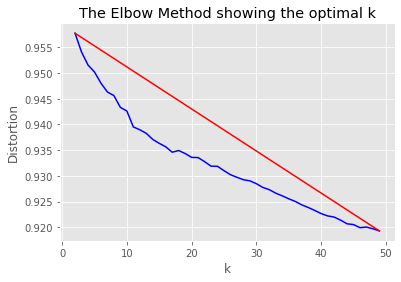

In [21]:
import matplotlib.pyplot as plt
plt.style.use('ggplot')

X_line = [K[0], K[-1]]
Y_line = [distortions[0], distortions[-1]]

# Plot the elbow
plt.plot(K, distortions, 'b-')
plt.plot(X_line, Y_line, 'r')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [22]:
k = 20
kmeans = KMeans(n_clusters=k, random_state=42)
y_pred = kmeans.fit_predict(X_reduced)
df_covid['y'] = y_pred

In [23]:
from sklearn.manifold import TSNE

tsne = TSNE(verbose=1, perplexity=100, random_state=42)
X_embedded = tsne.fit_transform(X.toarray())

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 10798 samples in 7.242s...
[t-SNE] Computed neighbors for 10798 samples in 794.741s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10798
[t-SNE] Computed conditional probabilities for sample 2000 / 10798
[t-SNE] Computed conditional probabilities for sample 3000 / 10798
[t-SNE] Computed conditional probabilities for sample 4000 / 10798
[t-SNE] Computed conditional probabilities for sample 5000 / 10798
[t-SNE] Computed conditional probabilities for sample 6000 / 10798
[t-SNE] Computed conditional probabilities for sample 7000 / 10798
[t-SNE] Computed conditional probabilities for sample 8000 / 10798
[t-SNE] Computed conditional probabilities for sample 9000 / 10798
[t-SNE] Computed conditional probabilities for sample 10000 / 10798
[t-SNE] Computed conditional probabilities for sample 10798 / 10798
[t-SNE] Mean sigma: 0.428734
[t-SNE] KL divergence after 250 iterations with early exaggeration: 147.973541
[t-SNE]

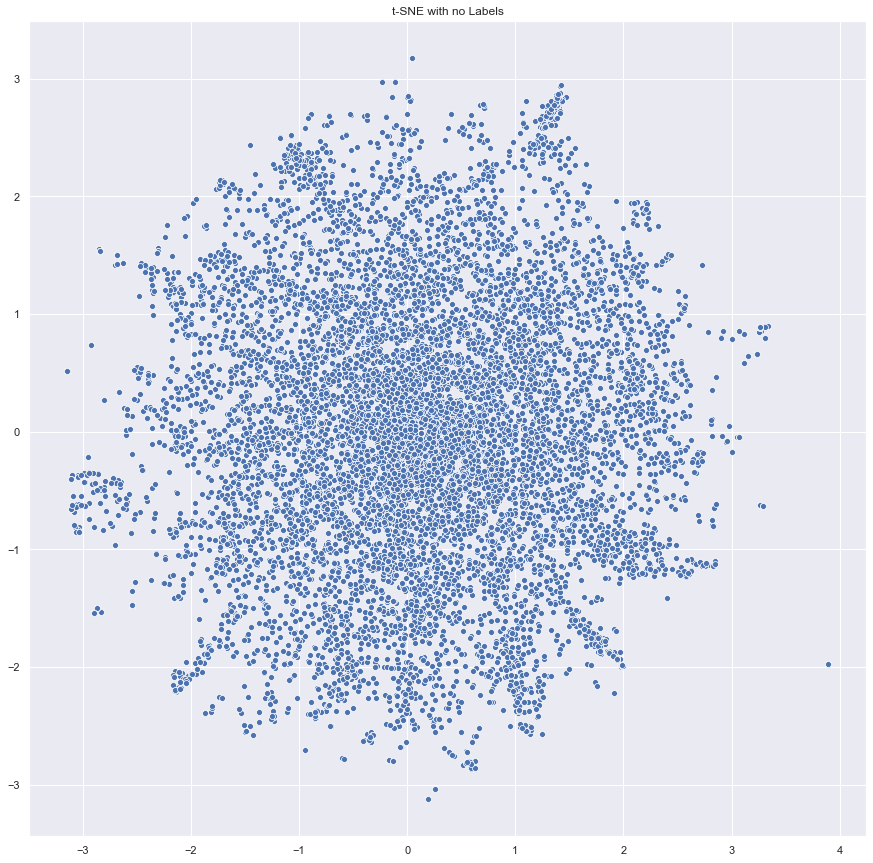

In [24]:
from matplotlib import pyplot as plt
import seaborn as sns

# sns settings
sns.set(rc={'figure.figsize':(15,15)})

# colors
palette = sns.color_palette("bright", 1)

# plot
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], palette=palette)
plt.title('t-SNE with no Labels')
plt.savefig("t-sne_covid19.png")
plt.show()

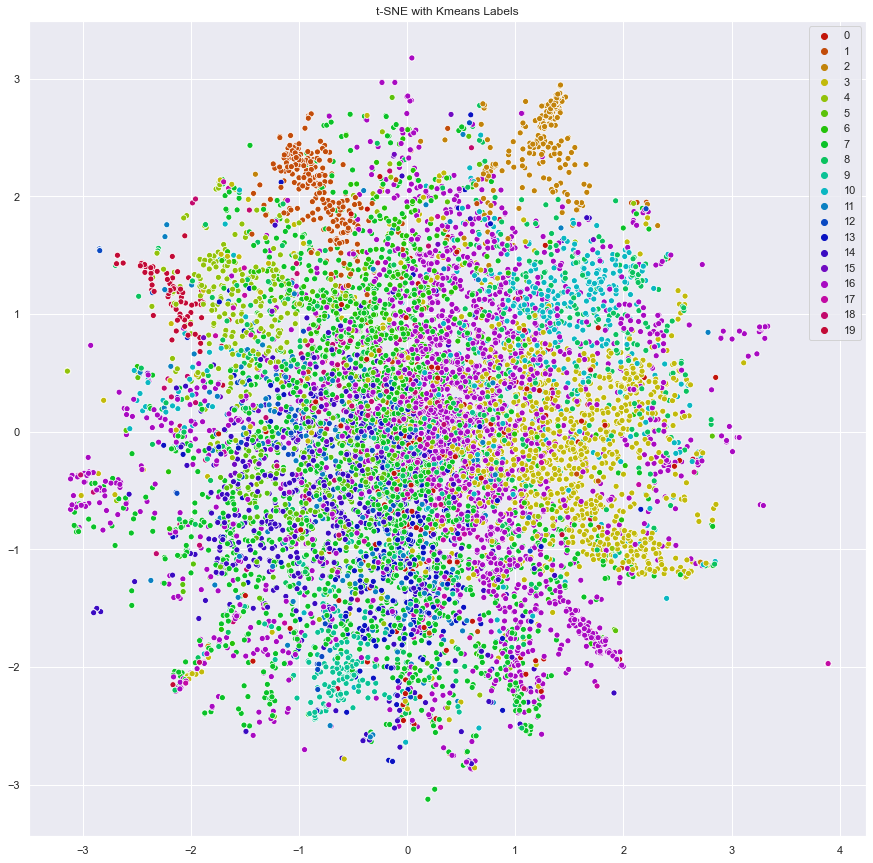

In [25]:
%matplotlib inline
from matplotlib import pyplot as plt
import seaborn as sns

# sns settings
sns.set(rc={'figure.figsize':(15,15)})

# colors
palette = sns.hls_palette(20, l=.4, s=.9)

# plot
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], hue=y_pred, legend='full', palette=palette)
plt.title('t-SNE with Kmeans Labels')
plt.savefig("improved_cluster_tsne.png")
plt.show()

In [26]:
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer

In [27]:
vectorizers = []
    
for ii in range(0, 20):
    # Creating a vectorizer
    vectorizers.append(CountVectorizer(min_df=5, max_df=0.9, stop_words='english', lowercase=True, token_pattern='[a-zA-Z\-][a-zA-Z\-]{2,}'))

In [28]:
vectorizers[0]

CountVectorizer(max_df=0.9, min_df=5, stop_words='english',
                token_pattern='[a-zA-Z\\-][a-zA-Z\\-]{2,}')

In [29]:
vectorized_data = []

for current_cluster, cvec in enumerate(vectorizers):
    try:
        vectorized_data.append(cvec.fit_transform(df_covid.loc[df_covid['y'] == current_cluster, 'processed_text']))
    except Exception as e:
        print("Not enough instances in cluster: " + str(current_cluster))
        vectorized_data.append(None)

In [30]:
len(vectorized_data)


20

In [31]:
# number of topics per cluster
NUM_TOPICS_PER_CLUSTER = 20

lda_models = []
for ii in range(0, 20):
    # Latent Dirichlet Allocation Model
    lda = LatentDirichletAllocation(n_components=NUM_TOPICS_PER_CLUSTER, max_iter=10, learning_method='online',verbose=False, random_state=42)
    lda_models.append(lda)
    
lda_models[0]

LatentDirichletAllocation(learning_method='online', n_components=20,
                          random_state=42, verbose=False)

In [32]:
clusters_lda_data = []

for current_cluster, lda in enumerate(lda_models):
    # print("Current Cluster: " + str(current_cluster))
    
    if vectorized_data[current_cluster] != None:
        clusters_lda_data.append((lda.fit_transform(vectorized_data[current_cluster])))

In [33]:
# Functions for printing keywords for each topic
def selected_topics(model, vectorizer, top_n=3):
    current_words = []
    keywords = []
    
    for idx, topic in enumerate(model.components_):
        words = [(vectorizer.get_feature_names()[i], topic[i]) for i in topic.argsort()[:-top_n - 1:-1]]
        for word in words:
            if word[0] not in current_words:
                keywords.append(word)
                current_words.append(word[0])
                
    keywords.sort(key = lambda x: x[1])  
    keywords.reverse()
    return_values = []
    for ii in keywords:
        return_values.append(ii[0])
    return return_values

In [34]:
all_keywords = []
for current_vectorizer, lda in enumerate(lda_models):
    # print("Current Cluster: " + str(current_vectorizer))

    if vectorized_data[current_vectorizer] != None:
        all_keywords.append(selected_topics(lda, vectorizers[current_vectorizer]))

In [35]:
all_keywords[0][:10]

['intervention',
 'study',
 'clinical',
 'health',
 'human',
 'coronavirus',
 'case',
 'use',
 'covid-',
 'sars-cov-']

In [36]:
len(all_keywords)

20

In [37]:
f=open('topics.txt','w')

count = 0

for ii in all_keywords:

    if vectorized_data[count] != None:
        f.write(', '.join(ii) + "\n")
    else:
        f.write("Not enough instances to be determined. \n")
        f.write(', '.join(ii) + "\n")
    count += 1

f.close()

In [38]:
import pickle

# save the COVID-19 DataFrame, too large for github
pickle.dump(df_covid, open("df_covid.p", "wb" ))

# save the final t-SNE
pickle.dump(X_embedded, open("X_embedded.p", "wb" ))

# save the labels generate with k-means(20)
pickle.dump(y_pred, open("y_pred.p", "wb" ))

In [39]:
# function to print out classification model report
def classification_report(model_name, test, pred):
    from sklearn.metrics import precision_score, recall_score
    from sklearn.metrics import accuracy_score
    from sklearn.metrics import f1_score
    
    print(model_name, ":\n")
    print("Accuracy Score: ", '{:,.3f}'.format(float(accuracy_score(test, pred)) * 100), "%")
    print("     Precision: ", '{:,.3f}'.format(float(precision_score(test, pred, average='macro')) * 100), "%")
    print("        Recall: ", '{:,.3f}'.format(float(recall_score(test, pred, average='macro')) * 100), "%")
    print("      F1 score: ", '{:,.3f}'.format(float(f1_score(test, pred, average='macro')) * 100), "%")

In [40]:
from sklearn.model_selection import train_test_split

# test set size of 20% of the data and the random seed 42 <3
X_train, X_test, y_train, y_test = train_test_split(X.toarray(),y_pred, test_size=0.2, random_state=42)

print("X_train size:", len(X_train))
print("X_test size:", len(X_test), "\n")

X_train size: 8638
X_test size: 2160 



In [41]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.linear_model import SGDClassifier

# SGD instance
sgd_clf = SGDClassifier(max_iter=10000, tol=1e-3, random_state=42, n_jobs=4)
# train SGD
sgd_clf.fit(X_train, y_train)

# cross validation predictions
sgd_pred = cross_val_predict(sgd_clf, X_train, y_train, cv=3, n_jobs=4)

# print out the classification report
classification_report("Stochastic Gradient Descent Report (Training Set)", y_train, sgd_pred)

Stochastic Gradient Descent Report (Training Set) :

Accuracy Score:  95.774 %
     Precision:  94.838 %
        Recall:  92.872 %
      F1 score:  93.812 %


In [401]:
# cross validation predictions
sgd_pred = cross_val_predict(sgd_clf, X_test, y_test, cv=3, n_jobs=4)

# print out the classification report
classification_report("Stochastic Gradient Descent Report (Training Set)", y_test, sgd_pred)

Stochastic Gradient Descent Report (Training Set) :

Accuracy Score:  89.259 %
     Precision:  90.975 %
        Recall:  79.999 %
      F1 score:  84.204 %


In [42]:
sgd_cv_score = cross_val_score(sgd_clf, X.toarray(), y_pred, cv=10)
print("Mean cv Score - SGD: {:,.3f}".format(float(sgd_cv_score.mean()) * 100), "%")

Mean cv Score - SGD: 96.194 %


In [43]:
import os

# change into lib directory to load plot python scripts
main_path = os.getcwd()
lib_path = '/home/dell/Escritorio/SBC'
os.chdir(lib_path)

In [44]:
# required libraries for plot

from call_backs import input_callback, selected_code  # file with customJS callbacks for bokeh
                                                      # github.com/MaksimEkin/COVID19-Literature-Clustering/blob/master/lib/call_backs.py
import bokeh
from bokeh.models import ColumnDataSource, HoverTool, LinearColorMapper, CustomJS, Slider, TapTool, TextInput
from bokeh.palettes import Category20
from bokeh.transform import linear_cmap, transform
from bokeh.io import output_file, show, output_notebook
from bokeh.plotting import figure
from bokeh.models import RadioButtonGroup, TextInput, Div, Paragraph
from bokeh.layouts import column, widgetbox, row, layout
from bokeh.layouts import column

In [45]:
os.chdir(main_path)

In [46]:
import os

topic_path = 'topics.txt'
with open(topic_path) as f:
    topics = f.readlines()

In [47]:
# show on notebook
output_notebook()
# target labels
y_labels = y_pred

# data sources
source = ColumnDataSource(data=dict(
    x= X_embedded[:,0], 
    y= X_embedded[:,1],
    x_backup = X_embedded[:,0],
    y_backup = X_embedded[:,1],
    desc= y_labels, 
    uri= df_covid['Uri_Pb'],
    doi= df_covid['Doi'],
    titulo= df_covid['Titulo'],
    autores = df_covid['Autores'],
    fecha = df_covid['Fecha'],
    revista = df_covid['Revista'],
    organizacion = df_covid['Organizacion'],
    licencia = df_covid['Licencia'],
    url = df_covid['URL'],
    labels = ["C-" + str(x) for x in y_labels]
    ))

# hover over information
hover = HoverTool(tooltips=[
    ("uri", "@uri{safe}"),
    ("DOI", "@doi{safe}"),
    ("Titulo", "@titulo{safe}"),
    ("Autor(es)", "@autores{safe}"),
    ("Fecha", "@fecha{safe}"),
    ("Revista", "@revista{safe}"),
    ("Organizacion", "@organizacion{safe}"),
    ("Licencia", "@licencia{safe}"),
    ("URL", "@url{safe}"),
],
point_policy="follow_mouse")

# map colors
mapper = linear_cmap(field_name='desc', 
                     palette=Category20[20],
                     low=min(y_labels) ,high=max(y_labels))

# prepare the figure
plot = figure(plot_width=1200, plot_height=850, 
           tools=[hover, 'pan', 'wheel_zoom', 'box_zoom', 'reset', 'save', 'tap'], 
           title="Clustering COVID-19 Publicaciones", 
           toolbar_location="above")

# plot settings
plot.scatter('x', 'y', size=5, 
          source=source,
          fill_color=mapper,
          line_alpha=0.3,
          line_color="black",
          legend = 'labels')
plot.legend.background_fill_alpha = 0.6

Loading BokehJS ...

In [48]:
# Keywords
text_banner = Paragraph(text= 'UNIVERSIDAD TECNICA PARTICULAR DE LOJA || SISTEMAS BASADOS EN CONOCIMIENTO || CLUSTERING PUBLICACIONES COVID-19   ', height=45)

input_callback_1 = input_callback(plot, source, text_banner, topics)

# currently selected article
div_curr = Div(text="""Integrantes:\n Elvis Joel Ayala 
\n Fernando León """,height=150)
callback_selected = CustomJS(args=dict(source=source, current_selection=div_curr), code=selected_code())
taptool = plot.select(type=TapTool)
taptool.callback = callback_selected

# # WIDGETS
# slider = Slider(start=0, end=5, value=3, step=1, title="Cluster #", callback=input_callback_1)
# keyword = TextInput(title="Search:", callback=input_callback_1)

# # pass call back arguments
# input_callback_1.args["text"] = keyword
# input_callback_1.args["slider"] = slider

In [49]:
# STYLE
# slider.sizing_mode = "stretch_width"
# slider.margin=15

# keyword.sizing_mode = "scale_both"
# keyword.margin=15

div_curr.style={'color': '#BF0A30', 'font-family': 'Helvetica Neue, Helvetica, Arial, sans-serif;', 'font-size': '1.1em'}
div_curr.sizing_mode = "scale_both"
div_curr.margin = 20

text_banner.style={'color': '#0269A4', 'font-family': 'Helvetica Neue, Helvetica, Arial, sans-serif;', 'font-size': '1.1em'}
text_banner.sizing_mode = "scale_both"
text_banner.margin = 20

plot.sizing_mode = "scale_both"
plot.margin = 5

r = row(div_curr,text_banner)
r.sizing_mode = "stretch_width"

In [50]:
# LAYOUT OF THE PAGE
l = layout([
#     [slider, keyword],
    [text_banner],
    [div_curr],
    [plot],
])

l.sizing_mode = "scale_both"

# show
output_file('t-sne_covid-19_interactive.html')
show(l)